*Initially created at 13.03.2018 by Petteri Nevavuori (<petteri.nevavuori@mtech.fi>)*

---

# ML III. CNN Optimization

In this notebook we'll train several CNNs with Drone datasets and research if the drone images are valid with just themselves as inputs in predicting the yield outputs. We will perform training by the datasets generated at the previous notebook. We will use the images as inputs and use area-wise means as training targets.

The CNN will effectively comprise of a multilayer CNN connected to several linear layers for yield prediction. Some research questions:

- How many layers is optimal?
- What optimizer is optimal?
- What hyperparameters are optimal?
- Which input image size yields best results?

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#1.-Optimizer-Comparison" data-toc-modified-id="1.-Optimizer-Comparison-1">1. Optimizer Comparison</a></span><ul class="toc-item"><li><span><a href="#1.1-Batch-Size-Limits" data-toc-modified-id="1.1-Batch-Size-Limits-1.1">1.1 Batch Size Limits</a></span><ul class="toc-item"><li><span><a href="#1.1.1-SGD" data-toc-modified-id="1.1.1-SGD-1.1.1">1.1.1 SGD</a></span></li><li><span><a href="#1.1.2-RMSProp" data-toc-modified-id="1.1.2-RMSProp-1.1.2">1.1.2 RMSProp</a></span></li><li><span><a href="#1.1.3-Adadelta" data-toc-modified-id="1.1.3-Adadelta-1.1.3">1.1.3 Adadelta</a></span></li><li><span><a href="#1.1.4-Conclusions" data-toc-modified-id="1.1.4-Conclusions-1.1.4">1.1.4 Conclusions</a></span></li></ul></li><li><span><a href="#1.2-Comparing-with-Distinct-Datasets" data-toc-modified-id="1.2-Comparing-with-Distinct-Datasets-1.2">1.2 Comparing with Distinct Datasets</a></span><ul class="toc-item"><li><span><a href="#1.2.1-NDVI-Earlier-Dataset" data-toc-modified-id="1.2.1-NDVI-Earlier-Dataset-1.2.1">1.2.1 NDVI Earlier Dataset</a></span></li><li><span><a href="#1.2.2-NDVI-Later-Dataset" data-toc-modified-id="1.2.2-NDVI-Later-Dataset-1.2.2">1.2.2 NDVI Later Dataset</a></span></li><li><span><a href="#1.2.3-RGB-Earlier-Dataset" data-toc-modified-id="1.2.3-RGB-Earlier-Dataset-1.2.3">1.2.3 RGB Earlier Dataset</a></span></li><li><span><a href="#1.2.4-RGB-Later-Dataset" data-toc-modified-id="1.2.4-RGB-Later-Dataset-1.2.4">1.2.4 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#1.4-Conclusion-for-the-Optimizer" data-toc-modified-id="1.4-Conclusion-for-the-Optimizer-1.3">1.4 Conclusion for the Optimizer</a></span><ul class="toc-item"><li><span><a href="#1.4.1-NDVI-Datasets" data-toc-modified-id="1.4.1-NDVI-Datasets-1.3.1">1.4.1 NDVI Datasets</a></span></li><li><span><a href="#1.4.2-RGB-Datasets" data-toc-modified-id="1.4.2-RGB-Datasets-1.3.2">1.4.2 RGB Datasets</a></span></li><li><span><a href="#1.4.3-Final-Optimizer-Conclusions" data-toc-modified-id="1.4.3-Final-Optimizer-Conclusions-1.3.3">1.4.3 Final Optimizer Conclusions</a></span></li></ul></li></ul></li><li><span><a href="#2.-Optimal-Depth" data-toc-modified-id="2.-Optimal-Depth-2">2. Optimal Depth</a></span><ul class="toc-item"><li><span><a href="#2.1-Depth-Comparisons" data-toc-modified-id="2.1-Depth-Comparisons-2.1">2.1 Depth Comparisons</a></span><ul class="toc-item"><li><span><a href="#2.1.1-NDVI-Earlier-Dataset" data-toc-modified-id="2.1.1-NDVI-Earlier-Dataset-2.1.1">2.1.1 NDVI Earlier Dataset</a></span></li><li><span><a href="#2.1.2-NDVI-Later-Dataset" data-toc-modified-id="2.1.2-NDVI-Later-Dataset-2.1.2">2.1.2 NDVI Later Dataset</a></span><ul class="toc-item"><li><span><a href="#Re-training-poorly-initialized-models" data-toc-modified-id="Re-training-poorly-initialized-models-2.1.2.1">Re-training poorly initialized models</a></span></li></ul></li><li><span><a href="#2.1.3-RGB-Earlier-Dataset" data-toc-modified-id="2.1.3-RGB-Earlier-Dataset-2.1.3">2.1.3 RGB Earlier Dataset</a></span></li><li><span><a href="#2.1.4-RGB-Later-Dataset" data-toc-modified-id="2.1.4-RGB-Later-Dataset-2.1.4">2.1.4 RGB Later Dataset</a></span><ul class="toc-item"><li><span><a href="#Re-training-poorly-initialized-models" data-toc-modified-id="Re-training-poorly-initialized-models-2.1.4.1">Re-training poorly initialized models</a></span></li></ul></li></ul></li><li><span><a href="#2.3-Conclusion-for-the-Depth" data-toc-modified-id="2.3-Conclusion-for-the-Depth-2.2">2.3 Conclusion for the Depth</a></span></li></ul></li><li><span><a href="#3.-Regularization" data-toc-modified-id="3.-Regularization-3">3. Regularization</a></span><ul class="toc-item"><li><span><a href="#3.1-Initializing-Networks" data-toc-modified-id="3.1-Initializing-Networks-3.1">3.1 Initializing Networks</a></span><ul class="toc-item"><li><span><a href="#3.1.1-RGB-Earlier-Dataset" data-toc-modified-id="3.1.1-RGB-Earlier-Dataset-3.1.1">3.1.1 RGB Earlier Dataset</a></span></li><li><span><a href="#3.1.2-RGB-Later-Dataset" data-toc-modified-id="3.1.2-RGB-Later-Dataset-3.1.2">3.1.2 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#3.2-Benchmark-Trainings" data-toc-modified-id="3.2-Benchmark-Trainings-3.2">3.2 Benchmark Trainings</a></span><ul class="toc-item"><li><span><a href="#3.2.1-RGB-Earlier-Dataset" data-toc-modified-id="3.2.1-RGB-Earlier-Dataset-3.2.1">3.2.1 RGB Earlier Dataset</a></span></li><li><span><a href="#3.2.2-RGB-Later-Dataset" data-toc-modified-id="3.2.2-RGB-Later-Dataset-3.2.2">3.2.2 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#3.2-Weight-decay" data-toc-modified-id="3.2-Weight-decay-3.3">3.2 Weight decay</a></span><ul class="toc-item"><li><span><a href="#3.2.1-Grid-Search-with-Both-RGB-Datasets" data-toc-modified-id="3.2.1-Grid-Search-with-Both-RGB-Datasets-3.3.1">3.2.1 Grid Search with Both RGB Datasets</a></span><ul class="toc-item"><li><span><a href="#3.2.1.1-RGB-Earlier-Dataset" data-toc-modified-id="3.2.1.1-RGB-Earlier-Dataset-3.3.1.1">3.2.1.1 RGB Earlier Dataset</a></span></li><li><span><a href="#3.2.1.2-RGB-Later-Dataset" data-toc-modified-id="3.2.1.2-RGB-Later-Dataset-3.3.1.2">3.2.1.2 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#3.2.2-Random-Search-with-Both-Datasets" data-toc-modified-id="3.2.2-Random-Search-with-Both-Datasets-3.3.2">3.2.2 Random Search with Both Datasets</a></span><ul class="toc-item"><li><span><a href="#3.2.2.1-RGB-Earlier-Dataset" data-toc-modified-id="3.2.2.1-RGB-Earlier-Dataset-3.3.2.1">3.2.2.1 RGB Earlier Dataset</a></span></li><li><span><a href="#3.2.2.2-RGB-Later-Dataset" data-toc-modified-id="3.2.2.2-RGB-Later-Dataset-3.3.2.2">3.2.2.2 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#3.2.3-Conclusions" data-toc-modified-id="3.2.3-Conclusions-3.3.3">3.2.3 Conclusions</a></span></li></ul></li><li><span><a href="#3.3-Early-Stopping" data-toc-modified-id="3.3-Early-Stopping-3.4">3.3 Early Stopping</a></span><ul class="toc-item"><li><span><a href="#3.3.1-RGB-Earlier-Dataset" data-toc-modified-id="3.3.1-RGB-Earlier-Dataset-3.4.1">3.3.1 RGB Earlier Dataset</a></span></li><li><span><a href="#3.3.2-RGB-Later-Dataset" data-toc-modified-id="3.3.2-RGB-Later-Dataset-3.4.2">3.3.2 RGB Later Dataset</a></span></li><li><span><a href="#3.3.3-Conclusions" data-toc-modified-id="3.3.3-Conclusions-3.4.3">3.3.3 Conclusions</a></span></li></ul></li><li><span><a href="#3.4-Conclusions-for-Regularization" data-toc-modified-id="3.4-Conclusions-for-Regularization-3.5">3.4 Conclusions for Regularization</a></span></li></ul></li><li><span><a href="#4.-Optimizer-Tuning" data-toc-modified-id="4.-Optimizer-Tuning-4">4. Optimizer Tuning</a></span><ul class="toc-item"><li><span><a href="#4.1-Grid-Search" data-toc-modified-id="4.1-Grid-Search-4.1">4.1 Grid Search</a></span><ul class="toc-item"><li><span><a href="#4.1.1-RGB-Earlier-Dataset" data-toc-modified-id="4.1.1-RGB-Earlier-Dataset-4.1.1">4.1.1 RGB Earlier Dataset</a></span></li><li><span><a href="#4.1.2-RGB-Later-Dataset" data-toc-modified-id="4.1.2-RGB-Later-Dataset-4.1.2">4.1.2 RGB Later Dataset</a></span></li><li><span><a href="#4.1.3-Conclusions" data-toc-modified-id="4.1.3-Conclusions-4.1.3">4.1.3 Conclusions</a></span></li></ul></li><li><span><a href="#4.2-Random-Search" data-toc-modified-id="4.2-Random-Search-4.2">4.2 Random Search</a></span><ul class="toc-item"><li><span><a href="#4.2.1-RGB-Earlier-Dataset" data-toc-modified-id="4.2.1-RGB-Earlier-Dataset-4.2.1">4.2.1 RGB Earlier Dataset</a></span></li><li><span><a href="#4.2.2-RGB-Later-Dataset" data-toc-modified-id="4.2.2-RGB-Later-Dataset-4.2.2">4.2.2 RGB Later Dataset</a></span></li><li><span><a href="#4.2.3-Conclusions" data-toc-modified-id="4.2.3-Conclusions-4.2.3">4.2.3 Conclusions</a></span></li></ul></li><li><span><a href="#4.3.-Full-Training" data-toc-modified-id="4.3.-Full-Training-4.3">4.3. Full Training</a></span><ul class="toc-item"><li><span><a href="#4.3.1-RGB-Earlier-Dataset" data-toc-modified-id="4.3.1-RGB-Earlier-Dataset-4.3.1">4.3.1 RGB Earlier Dataset</a></span></li><li><span><a href="#4.3.2-RGB-Later-Dataset" data-toc-modified-id="4.3.2-RGB-Later-Dataset-4.3.2">4.3.2 RGB Later Dataset</a></span></li></ul></li></ul></li></ul></div>

## 1. Optimizer Comparison

The first comparison point is the optimizer. While some hints were already provided in the CNN building phase, we'll asses the differences more distinctly here. We will compare vanilla implementations of `PyTorch`'s SGD with momentum, RMSProp and Adadelta. The CNN will by default use SGD with momentum, so we'll introduce explicitly only the RMSProp and Adadelta. We won't use early stopping yet, as we want to see how the training progresses.


### 1.1 Batch Size Limits

During the course of training the models with varying optimzier it was noticed that sometimes a batch size too large would result in the optimizer failing to reduce the objective loss. Thus we will explore the optimizer limits. The initial intuition is that there exists a dual limit to batch size. The first is the GPU memory and the second is a level above which the optimizer switches from functional to detrimental.

We will test every batch size with triple initialization. This is to see whether random initialization of model's parameters has a noticeable role.

In [1]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import numpy as np
from torch import optim

from field_analysis.model.dataset.dataperiod import DroneNDVIEarlier, DroneRGBEarlier
from field_analysis.model.nets.cnn import DroneYieldMeanCNN

db_32 = 'field_analysis_10m_32px.db'
db_64 = 'field_analysis_20m_64px.db'
db_128 = 'field_analysis_40m_128px.db'
dbs = [db_32, db_64, db_128]


def test_optimizer_batch_size(optimizer):
    plt.rcParams['figure.figsize'] = 10, 3
    batch_sizes = [32*2**x for x in range(6)]
    for i, source_dim in enumerate([32, 64, 128]):
        for j, dataset in enumerate([DroneNDVIEarlier, DroneRGBEarlier]):
            ds_name = "NDVI"
            if j == 1:
                ds_name = "RGB"
            for batch_size in batch_sizes:
                losses = []
                losses_deltas = []
                try:
                    for k in range(3):
                        train, test = dataset(dbs[i]).separate_train_test(
                            batch_size=batch_size,
                            train_ratio=0.8)
                        cnn = DroneYieldMeanCNN(
                            source_bands=max(1, 3*j),
                            source_dim=source_dim,
                            optimizer=optimizer)
                        losses_dict = cnn.train(
                            epochs=3,
                            training_data=train,
                            test_data=test,
                            visualize=False,
                            suppress_output=True,
                            save_model=False)
                        losses.append(np.array(losses_dict['test_losses_mean_std'])[:,0].min())
                except Exception as ex:
                    pass
                if len(losses) > 0:
                    losses = np.array(losses)
                    plt.scatter([batch_size]*len(losses), losses, alpha=0.5)
                    plt.errorbar(batch_size, losses.mean(),
                                 losses.std(), capsize=6, marker='o')
            plt.title('Best Test Losses for {} {}x{}'.format(ds_name, source_dim, source_dim))
            plt.xlabel('Batch Size')
            plt.ylabel('$\mu_{Loss}$')
            plt.xticks(batch_sizes)
            plt.ylim(bottom=0)
            plt.xlim(16, 1040)
            plt.grid()
            plt.tight_layout()
            plt.show()

#### 1.1.1 SGD

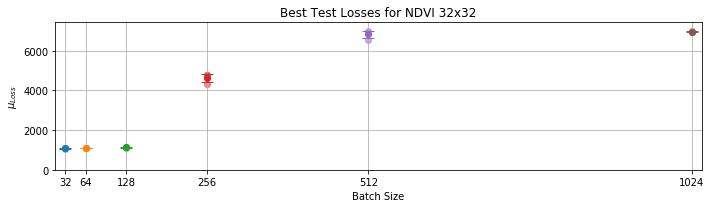

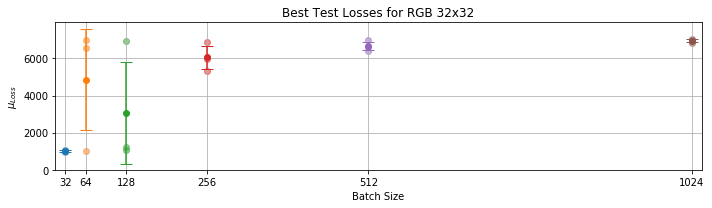

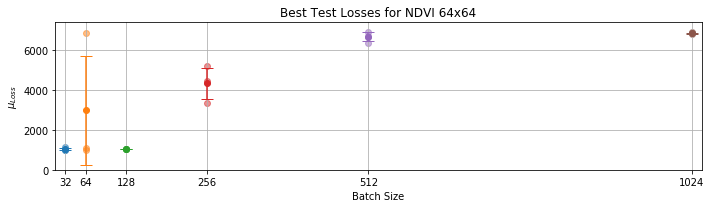

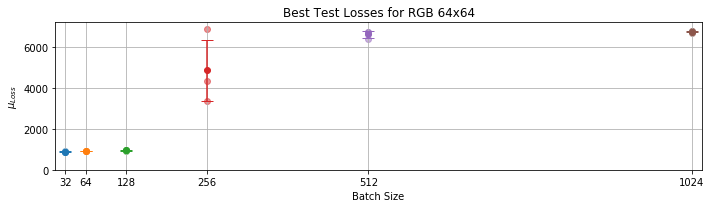

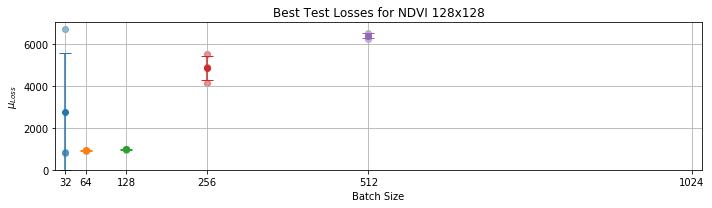

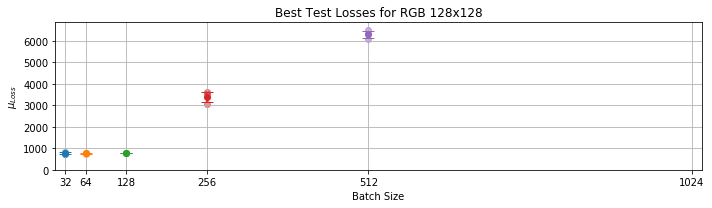

In [2]:
test_optimizer_batch_size(optimizer=None)

#### 1.1.2 RMSProp

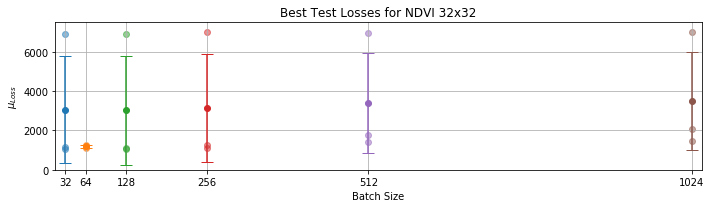

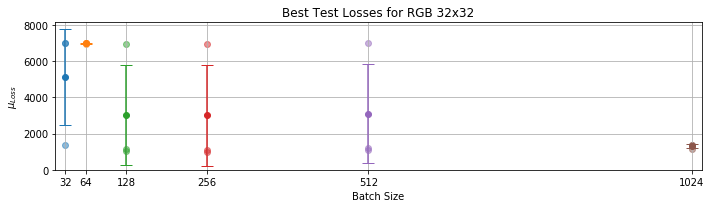

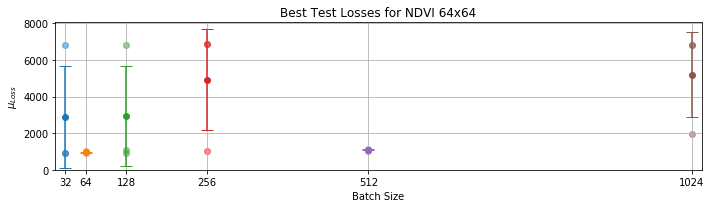

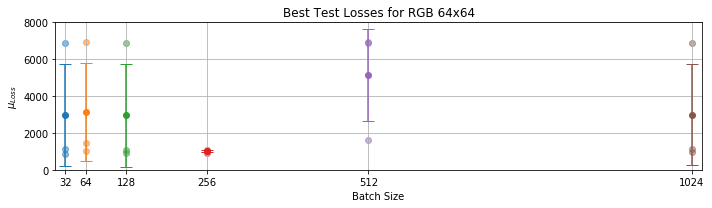

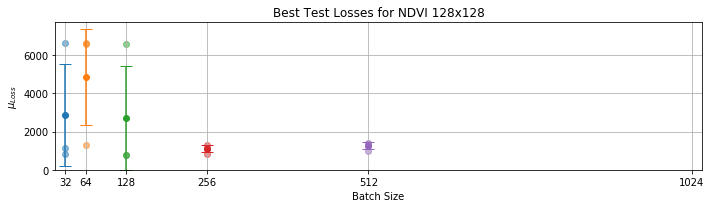

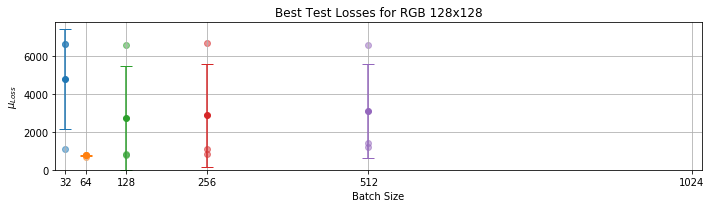

In [3]:
test_optimizer_batch_size(optimizer=optim.RMSprop)

#### 1.1.3 Adadelta

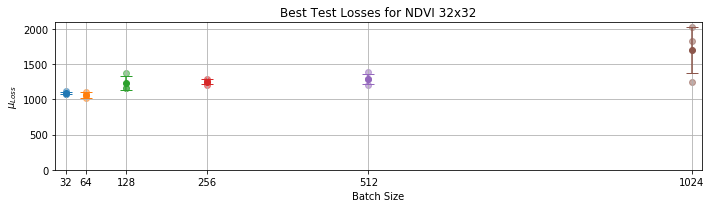

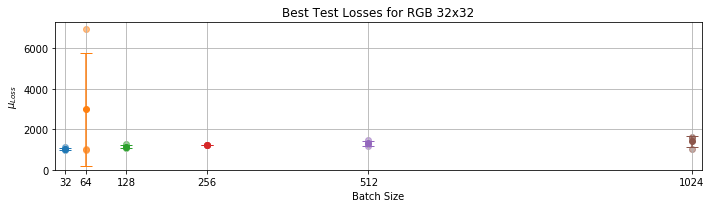

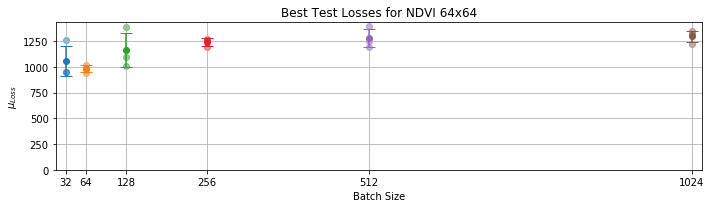

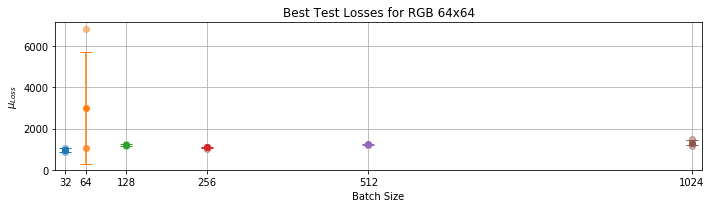

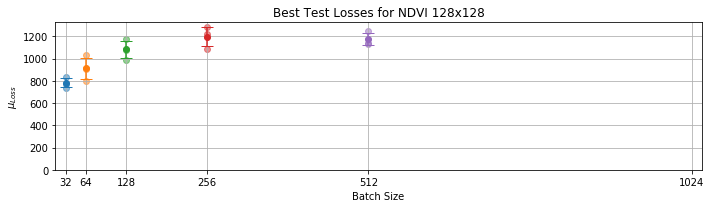

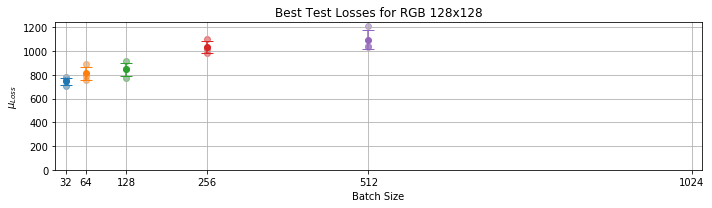

In [4]:
test_optimizer_batch_size(optimizer=optim.Adadelta)

#### 1.1.4 Conclusions

Here are the results from trying out multiple batch size in range $[2^5, 2^{10}]$. The results are given for each optimizer and dataset and presented in table below. The columns represent the batch sizes and the rows the batch-wise feasibilities for each optimizer and dataset. The possible outcomes are **feasible** (Y), **not feasible** (N) and **over the GPU memory limit** (-). 

The feasibility is determined by whether the optimizer was able to start minimizing the test error during three epochs. A telltale sign of the inability to minimize is when the values stay around the level of the median of the target values. This essentially means that the network produces values close to zero while the absolute target values are around 6500. As each dataset-optimizer-pair is initialized and trained three times, **a pair is feasible when majority of initializations provide sufficient minimization**. With three initialization this means that one non-minimizing initialization is within the threshold.

| *SGD*    | 32 | 64 | 128 | 256 | 512 | 1024 |
|----------|----|----|-----|-----|-----|------|
| NDVI 32  | Y  | Y  | Y   | Y   | N   | N    |
| RGB 32   | Y  | N  | Y   | Y   | N   | N    |
| NDVI 64  | Y  | Y  | Y   | Y   | N   | N    |
| RGB 64   | Y  | Y  | Y   | Y   | N   | N    |
| NDVI 128 | Y  | Y  | Y   | Y   | N   | -    |
| RGB 128  | Y  | Y  | Y   | Y   | N   | -    |

| *RMSprop* | 32 | 64 | 128 | 256 | 512 | 1024 |
|-----------|----|----|-----|-----|-----|------|
| NDVI 32   | Y  | Y  | Y   | Y   | Y   | Y    |
| RGB 32    | N  | N  | Y   | Y   | Y   | Y    |
| NDVI 64   | Y  | Y  | Y   | N   | Y   | N    |
| RGB 64    | Y  | Y  | Y   | Y   | N   | Y    |
| NDVI 128  | Y  | N  | Y   | Y   | Y   | -    |
| RGB 128   | N  | Y  | Y   | Y   | Y   | -    |

| *Adadelta* | 32 | 64 | 128 | 256 | 512 | 1024 |
|------------|----|----|-----|-----|-----|------|
| NDVI 32    | Y  | Y  | Y   | Y   | Y   | Y    |
| RGB 32     | Y  | Y  | Y   | Y   | Y   | Y    |
| NDVI 64    | Y  | Y  | Y   | Y   | Y   | Y    |
| RGB 64     | Y  | Y  | Y   | Y   | Y   | Y    |
| NDVI 128   | Y  | Y  | Y   | Y   | Y   | -    |
| RGB 128    | Y  | Y  | Y   | Y   | Y   | -    |

Adadelta seems to be the most robust while the RMSprop is the pickiest one. Also the way the RMSprop behaves induces mistrust towards it as it seems quite unreliable. **The comparison will thus continue with SGD and Adadelta only and with a fixed batch size of 128.** This is because they are reliable and do not seemingly randomly tend to fail to start initializing. This is the case with RMSprop, as there is no clear distinction in the setting that causes the optimization to fail. While SGD fails at times, it is clearly with higher batch sizes. RMSprop fails from the smallest to the largest  batch sizes.

### 1.2 Comparing with Distinct Datasets

We'll begin by looking at the NDVI datasets first. Initially we'll use a tad deeper topology, as it proved to have a large enough capacity to show distinction between training and test losses. This is a good thing as the model is able to fit better. This also makes the use of regularization viable in driving the test losses down. **Each model is trained for 50 epochs**.

Then we'll do the same comparison with RGB images. We will train each dataset with each of the optimizers and see how they manage.

In [1]:
import os
import pandas as pd
import numpy as np
from torch import optim
from field_analysis.model.dataset import dataperiod as dp
from field_analysis.model.nets.cnn import DroneYieldMeanCNN
import field_analysis.settings.model as model_settings
%matplotlib inline

db_32 = 'field_analysis_10m_32px.db'
db_64 = 'field_analysis_20m_64px.db'
db_128 = 'field_analysis_40m_128px.db'
dbs = [db_32, db_64, db_128]
optimizer_models_dir = os.path.join(model_settings.MODELS_DIR,'optimizer')
os.makedirs(optimizer_models_dir,exist_ok=True)

optimizers = [None, optim.Adadelta]

def test_optimizer(dataloader):
    losses = pd.DataFrame()
    for i, db in enumerate(dbs):
        dataset = dataloader(db_name=db)
        dataset_name = dataset.__class__.__name__
        source_bands = 1  # NDVI
        if 'RGB' in dataset_name:
            source_bands = 3
        for optimizer in optimizers:
            source_dim = 32*(2**i)
            if optimizer is not None:
                optim_name = 'Adadelta'
            else:
                optim_name = 'SGD'
            cnn = DroneYieldMeanCNN(
                source_bands=source_bands,
                source_dim=source_dim,
                cnn_layers=6,
                fc_layers=2,
                optimizer=optimizer)
            cnn.model_path = os.path.join(optimizer_models_dir,cnn.model_filename)
            print(cnn.model_path)
            losses_dict = cnn.train(
                epochs=50,
                training_data=dataset,
                k_cv_folds=3,
                suppress_output=True)
            best_loss = np.array(losses_dict['test_losses_mean_std'])[:, 0].min()
            losses.loc[source_dim,optim_name] = best_loss
    return losses

#### 1.2.1 NDVI Earlier Dataset

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_085026957_SGD_1x32x32_6cnn_2fc.pkl
Best Test Loss: 1003.50


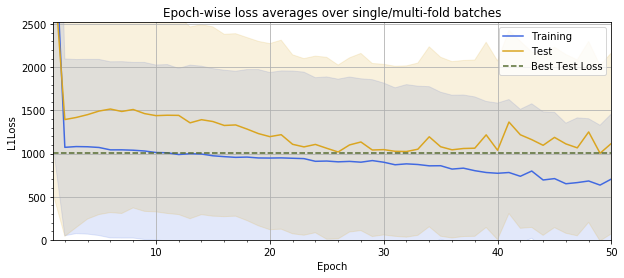

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_085526247_Adadelta_1x32x32_6cnn_2fc.pkl
Best Test Loss: 680.22


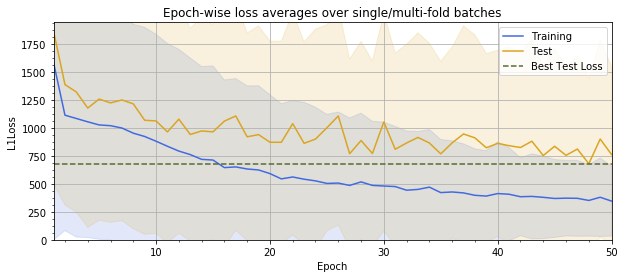

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_090033821_SGD_1x64x64_6cnn_2fc.pkl
Best Test Loss: 895.26


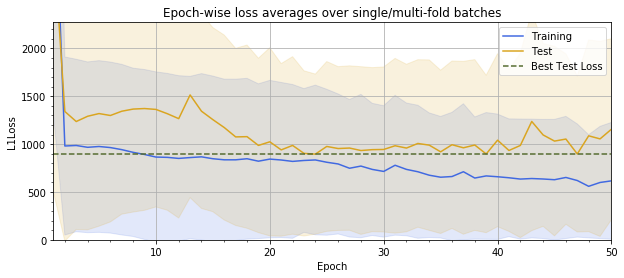

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_090837177_Adadelta_1x64x64_6cnn_2fc.pkl
Best Test Loss: 758.63


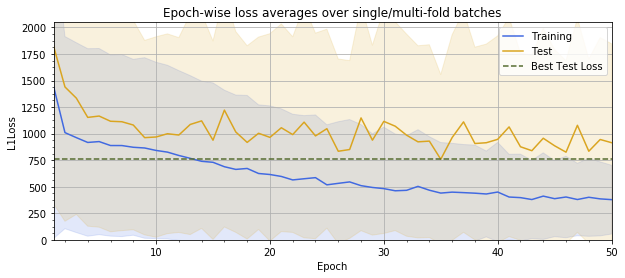

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_091648508_SGD_1x128x128_6cnn_2fc.pkl
Best Test Loss: 774.68


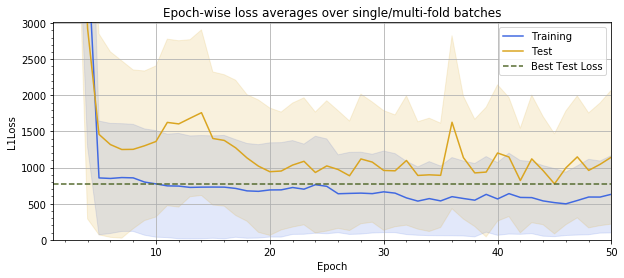

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_093605017_Adadelta_1x128x128_6cnn_2fc.pkl
Best Test Loss: 553.76


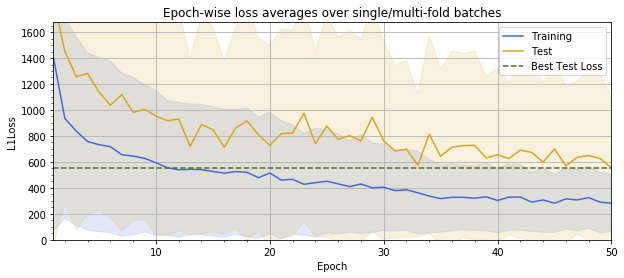

In [2]:
result_earlier_ndvi = test_optimizer(dataloader=dp.DroneNDVIEarlier)

#### 1.2.2 NDVI Later Dataset

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_095547938_SGD_1x32x32_6cnn_2fc.pkl
Best Test Loss: 1404.77


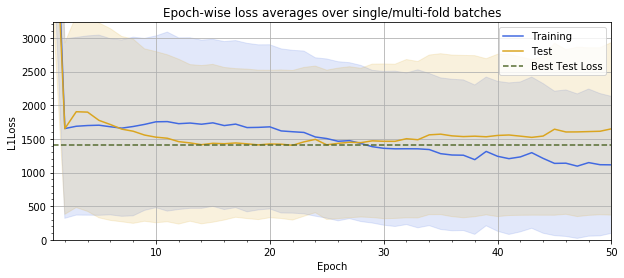

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_100101396_Adadelta_1x32x32_6cnn_2fc.pkl
Best Test Loss: 1382.23


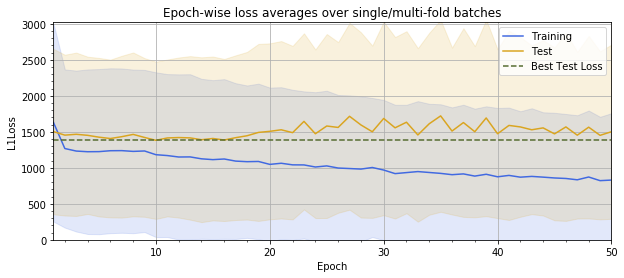

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_100623512_SGD_1x64x64_6cnn_2fc.pkl
Best Test Loss: 1172.14


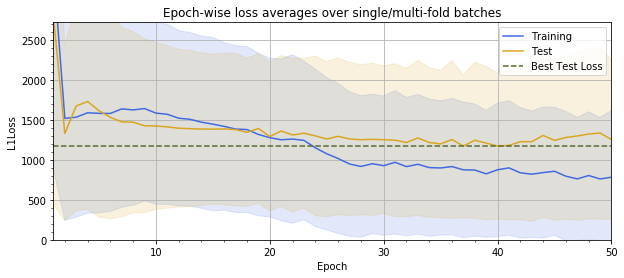

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_101425043_Adadelta_1x64x64_6cnn_2fc.pkl
Best Test Loss: 1244.23


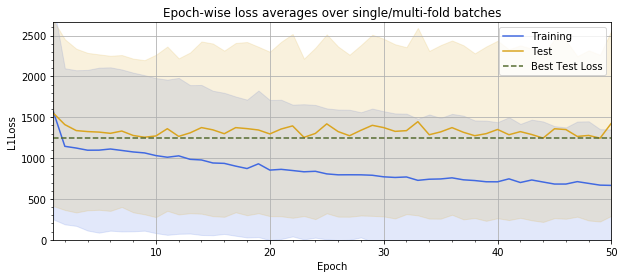

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_102231246_SGD_1x128x128_6cnn_2fc.pkl
Best Test Loss: 1257.52


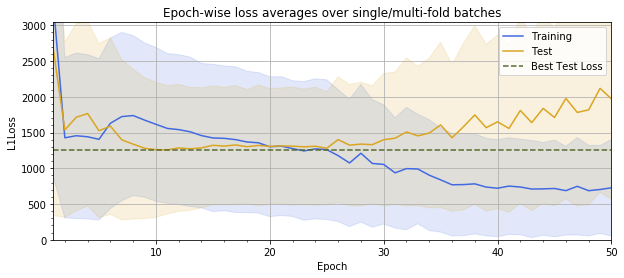

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_104132579_Adadelta_1x128x128_6cnn_2fc.pkl
Best Test Loss: 776.75


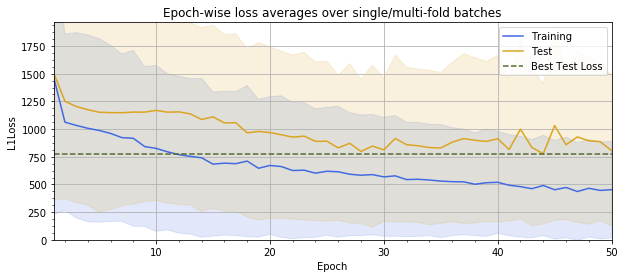

In [3]:
result_later_ndvi = test_optimizer(dataloader=dp.DroneNDVILater)

#### 1.2.3 RGB Earlier Dataset

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_110103313_SGD_3x32x32_6cnn_2fc.pkl
Best Test Loss: 877.83


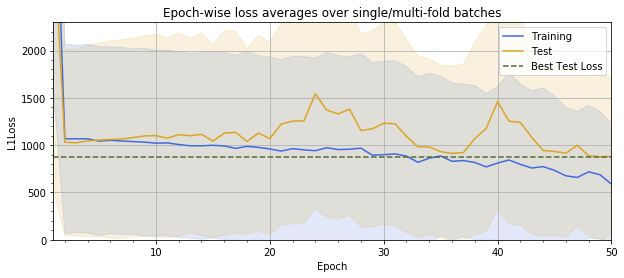

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_110648755_Adadelta_3x32x32_6cnn_2fc.pkl
Best Test Loss: 549.96


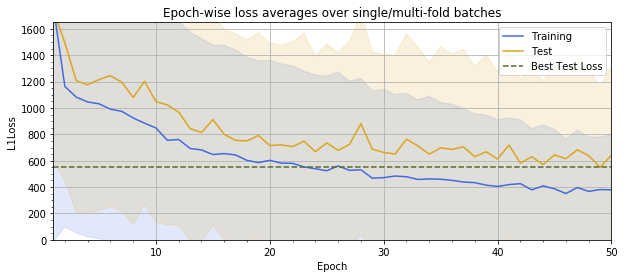

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_111243874_SGD_3x64x64_6cnn_2fc.pkl
Best Test Loss: 824.38


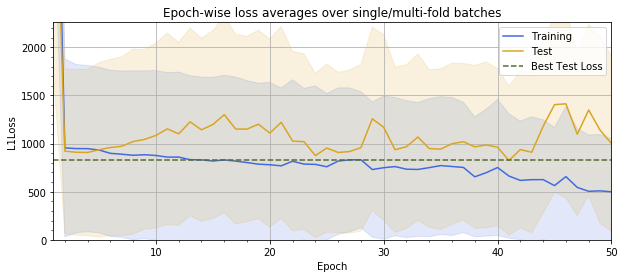

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_112203256_Adadelta_3x64x64_6cnn_2fc.pkl
Best Test Loss: 581.97


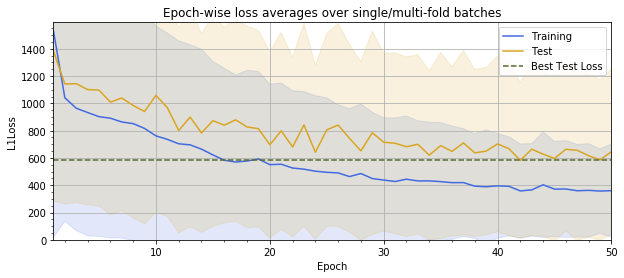

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_113133735_SGD_3x128x128_6cnn_2fc.pkl
Best Test Loss: 780.07


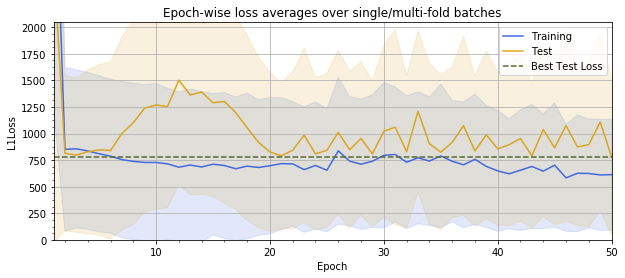

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_115507911_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 435.48


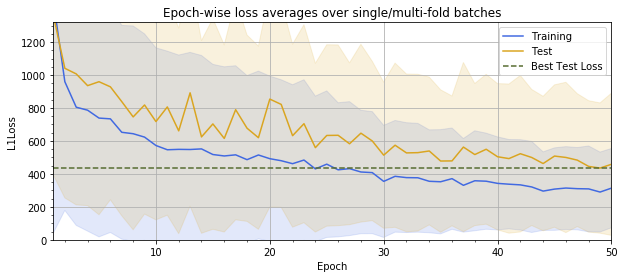

In [4]:
result_earlier_rgb = test_optimizer(dataloader=dp.DroneRGBEarlier)

#### 1.2.4 RGB Later Dataset

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_121845907_SGD_3x32x32_6cnn_2fc.pkl
Best Test Loss: 1107.89


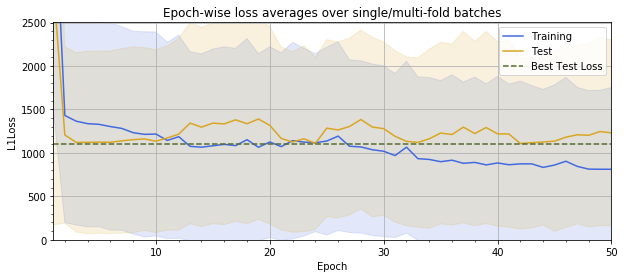

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_122423466_Adadelta_3x32x32_6cnn_2fc.pkl
Best Test Loss: 631.90


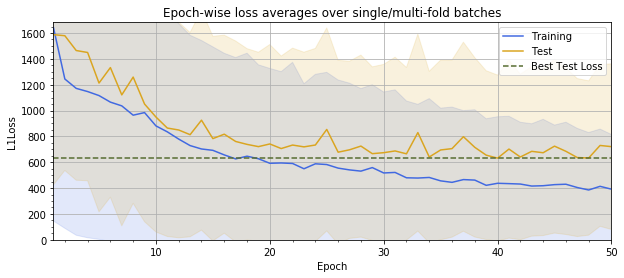

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_123006864_SGD_3x64x64_6cnn_2fc.pkl
Best Test Loss: 862.24


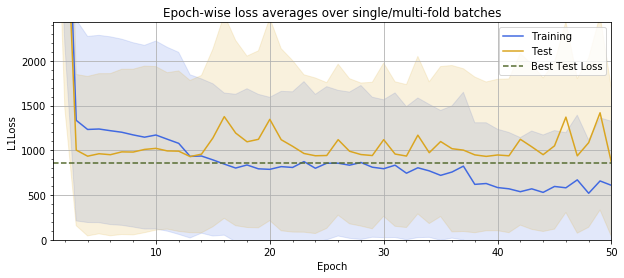

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_123906231_Adadelta_3x64x64_6cnn_2fc.pkl
Best Test Loss: 574.65


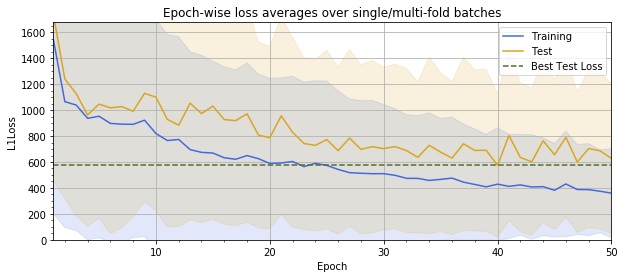

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_124813919_SGD_3x128x128_6cnn_2fc.pkl
Best Test Loss: 669.19


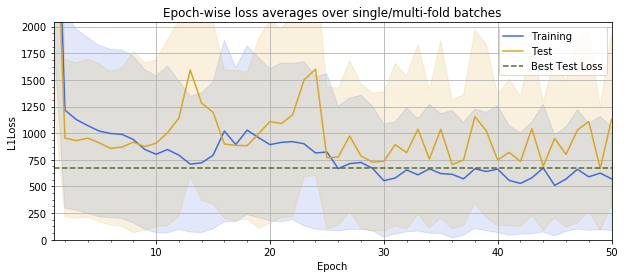

/home/nevavuor/crop-field-cnn/models/optimizer/20181114_130955347_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 416.37


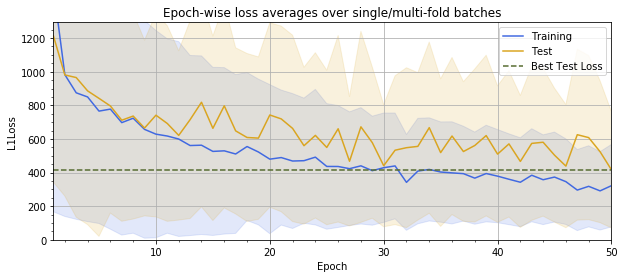

In [5]:
result_later_rgb = test_optimizer(dataloader=dp.DroneRGBLater)

### 1.4 Conclusion for the Optimizer

First we'll take a look at the test losses produced with distinct datasets for each optimizer.

In [6]:
pd.options.display.float_format = '{:.2f}'.format

#### 1.4.1 NDVI Datasets

The following tables show the best test L1-losses with distinct datasets and optimizers. The first table is for the earlier dataset with pre-July Drone NDVI images:

In [7]:
result_earlier_ndvi

,SGD,Adadelta
32,1003.50,680.22
64,895.26,758.63
128,774.68,553.76


In [8]:
result_later_ndvi

,SGD,Adadelta
32,1404.77,1382.23
64,1172.14,1244.23
128,1257.52,776.75


#### 1.4.2 RGB Datasets

Let's pull up the tables for period-wise lowest L1-losses with only 50 epochs and no tuning. First one is the table for pre-July RGB datasets:

In [9]:
result_earlier_rgb

,SGD,Adadelta
32,877.83,549.96
64,824.38,581.97
128,780.07,435.48


In [10]:
result_later_rgb

,SGD,Adadelta
32,1107.89,631.90
64,862.24,574.65
128,669.19,416.37


#### 1.4.3 Final Optimizer Conclusions

After ruling out the RMSprop in the optimal batch size exploration stage already the comparison was conducted between the SGD with momentum and Adadelta. Adadelta produced the best results out every training configuration. This means that it succeeded better in utilizing the capacity of the model. **We will thus use Adadelta as the optimizer.**

## 2. Optimal Depth

Next up is comparing several depths for the CNN component of the network. We will attempt at keeping the FC layers at two to really isolate the CNN performance. A good result is achieved when the network is able to even overfit. That means the capacity is sufficient and allows for the utilization of regularization to drive the test error down.

Even though the number of total trainings is high (48 distinct trainings), we will still go through them. In the later stages of the optimization we will use only some of the datasets if similar results are produced to the comparison of optimizers. We will also increase the number of epochs to see where the deeper models would progress.

In [1]:
import os
import pandas as pd
import numpy as np
from torch import optim
from field_analysis.model.dataset import dataperiod as dp
from field_analysis.model.nets.cnn import DroneYieldMeanCNN
import field_analysis.settings.model as model_settings
%matplotlib inline

db_32 = 'field_analysis_10m_32px.db'
db_64 = 'field_analysis_20m_64px.db'
db_128 = 'field_analysis_40m_128px.db'
dbs = [db_32, db_64, db_128]
depth_models_dir = os.path.join(model_settings.MODELS_DIR,'depth')
results_dir = os.path.join(os.getcwd(),'results')
os.makedirs(depth_models_dir,exist_ok=True)
os.makedirs(results_dir,exist_ok=True)

def test_depth(dataloader, bands):
    depths = list(range(4, 14, 2))
    multi_index = pd.MultiIndex.from_product([[32,64,128],depths])
    losses = pd.DataFrame(index=['test','train'],columns=multi_index)
    for i, db in enumerate(dbs):
        dataset = dataloader(db_name=db)
        dataset_name = dataset.__class__.__name__
        source_bands = 1  # NDVI
        if 'RGB' in dataset_name:
            source_bands = 3
        for depth in depths:
            source_dim = 32*(2**i)
            cnn = DroneYieldMeanCNN(
                source_bands=bands,
                source_dim=source_dim,
                cnn_layers=depth,
                fc_layers=2,
                optimizer=optim.Adadelta)
            cnn.model_path = os.path.join(depth_models_dir,cnn.model_filename)
            print(cnn.model_path)
            losses_dict= cnn.train(
                epochs=50,
                training_data=dataset,
                k_cv_folds=3,
                suppress_output=True)
            best_test_loss = np.array(losses_dict['test_losses_mean_std'])[:, 0].min()
            best_train_loss = np.array(losses_dict['training_losses_mean_std'])[:, 0].min()
            losses.loc['test',(source_dim,depth)] = best_test_loss
            losses.loc['train',(source_dim,depth)] = best_train_loss
    return losses

In [26]:
def test_depth_single(dataloader, bands, db, depth, dim):
    depths = list(range(4, 14, 2))
    multi_index = pd.MultiIndex.from_product([[32,64,128],depths])
    losses = pd.DataFrame(index=['test','train'],columns=multi_index)
    dataset = dataloader(db_name=db)
    dataset_name = dataset.__class__.__name__
    source_bands = 1  # NDVI
    if 'RGB' in dataset_name:
        source_bands = 3
    source_dim = dim
    cnn = DroneYieldMeanCNN(
        source_bands=bands,
        source_dim=source_dim,
        cnn_layers=depth,
        fc_layers=2,
        optimizer=optim.Adadelta)
    cnn.model_path = os.path.join(depth_models_dir,cnn.model_filename)
    print(cnn.model_path)
    losses_dict= cnn.train(
        epochs=50,
        training_data=dataset,
        k_cv_folds=3,
        suppress_output=True)
    best_test_loss = np.array(losses_dict['test_losses_mean_std'])[:, 0].min()
    best_train_loss = np.array(losses_dict['training_losses_mean_std'])[:, 0].min()
    losses.loc['test',(source_dim,depth)] = best_test_loss
    losses.loc['train',(source_dim,depth)] = best_train_loss
    return losses

### 2.1 Depth Comparisons

First, as with the optimizer, we'll go through the NDVI datasets. Then the RGB ones.

#### 2.1.1 NDVI Earlier Dataset

/home/nevavuor/crop-field-cnn/models/depth/20181115_205421047_Adadelta_1x32x32_4cnn_2fc.pkl
Best Test Loss: 745.89


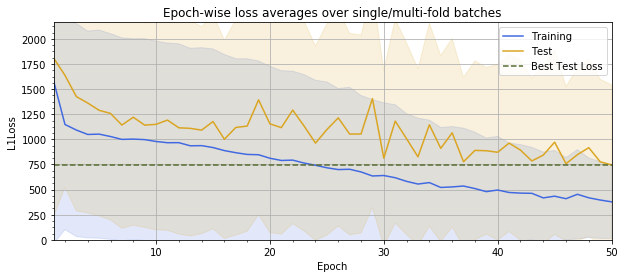

/home/nevavuor/crop-field-cnn/models/depth/20181115_205913384_Adadelta_1x32x32_6cnn_2fc.pkl
Best Test Loss: 746.68


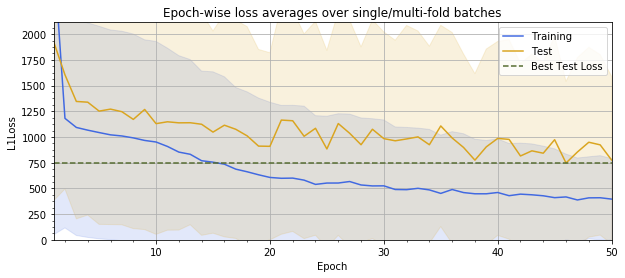

/home/nevavuor/crop-field-cnn/models/depth/20181115_210437884_Adadelta_1x32x32_8cnn_2fc.pkl
Best Test Loss: 785.59


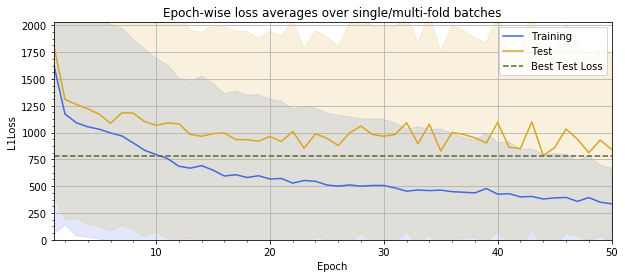

/home/nevavuor/crop-field-cnn/models/depth/20181115_211037218_Adadelta_1x32x32_10cnn_2fc.pkl
Best Test Loss: 759.75


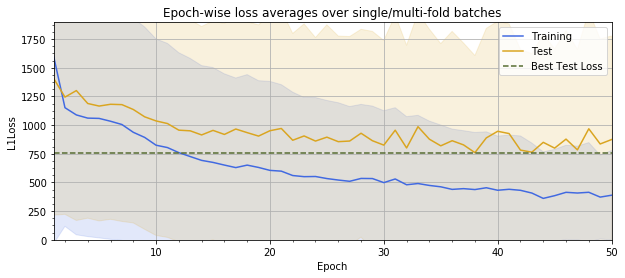

/home/nevavuor/crop-field-cnn/models/depth/20181115_211711601_Adadelta_1x32x32_12cnn_2fc.pkl
Best Test Loss: 776.68


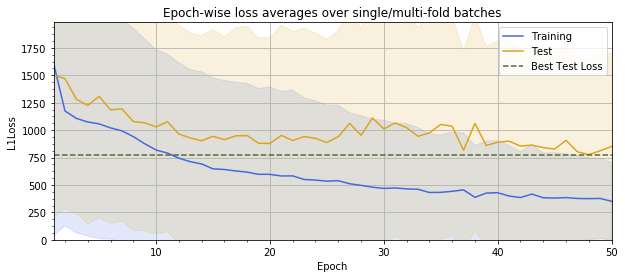

/home/nevavuor/crop-field-cnn/models/depth/20181115_212419209_Adadelta_1x64x64_4cnn_2fc.pkl
Best Test Loss: 747.39


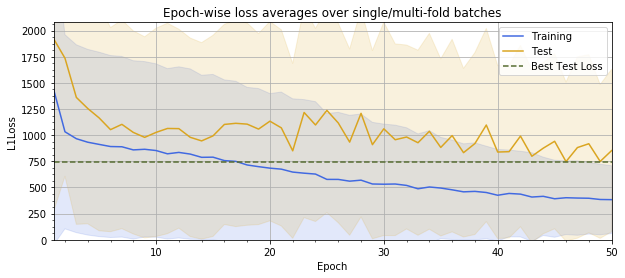

/home/nevavuor/crop-field-cnn/models/depth/20181115_213242277_Adadelta_1x64x64_6cnn_2fc.pkl
Best Test Loss: 726.99


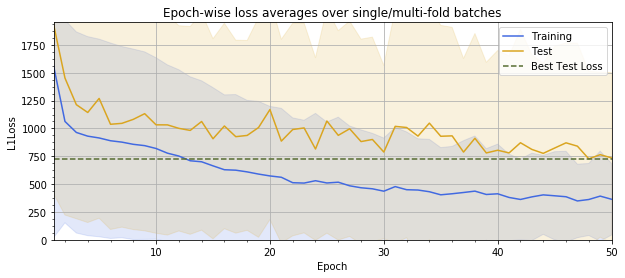

/home/nevavuor/crop-field-cnn/models/depth/20181115_214137868_Adadelta_1x64x64_8cnn_2fc.pkl
Best Test Loss: 761.30


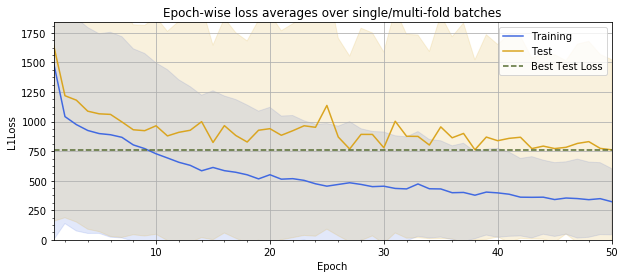

/home/nevavuor/crop-field-cnn/models/depth/20181115_215100842_Adadelta_1x64x64_10cnn_2fc.pkl
Best Test Loss: 671.97


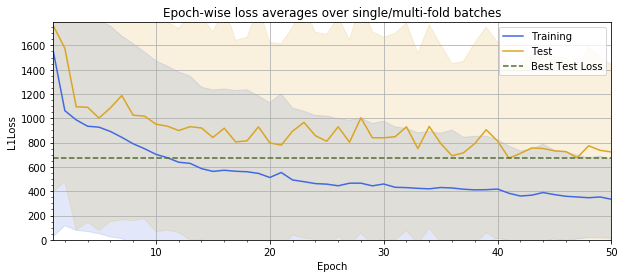

/home/nevavuor/crop-field-cnn/models/depth/20181115_220057222_Adadelta_1x64x64_12cnn_2fc.pkl
Best Test Loss: 692.59


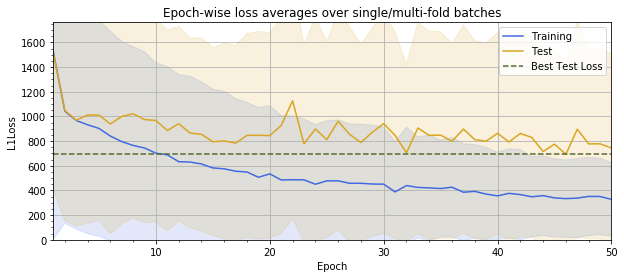

/home/nevavuor/crop-field-cnn/models/depth/20181115_221135367_Adadelta_1x128x128_4cnn_2fc.pkl
Best Test Loss: 791.01


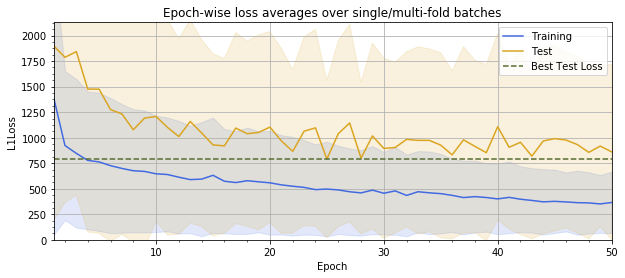

/home/nevavuor/crop-field-cnn/models/depth/20181115_223228329_Adadelta_1x128x128_6cnn_2fc.pkl
Best Test Loss: 604.04


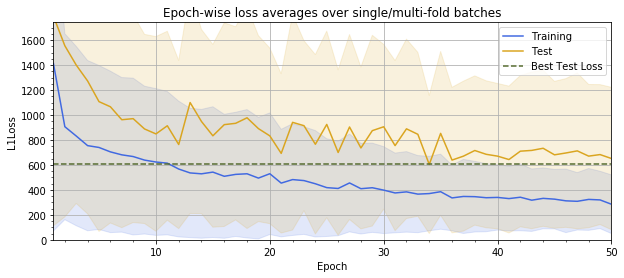

/home/nevavuor/crop-field-cnn/models/depth/20181115_225339216_Adadelta_1x128x128_8cnn_2fc.pkl
Best Test Loss: 595.29


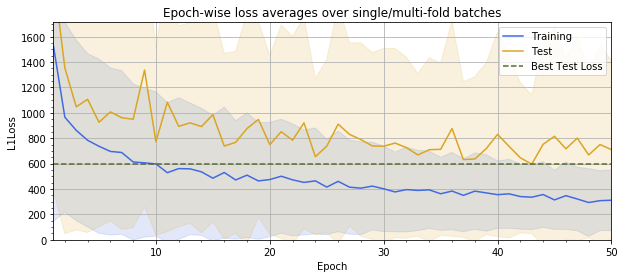

/home/nevavuor/crop-field-cnn/models/depth/20181115_231530635_Adadelta_1x128x128_10cnn_2fc.pkl
Best Test Loss: 557.11


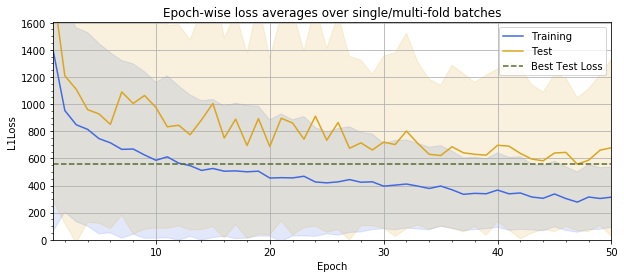

/home/nevavuor/crop-field-cnn/models/depth/20181115_233804797_Adadelta_1x128x128_12cnn_2fc.pkl
Best Test Loss: 609.44


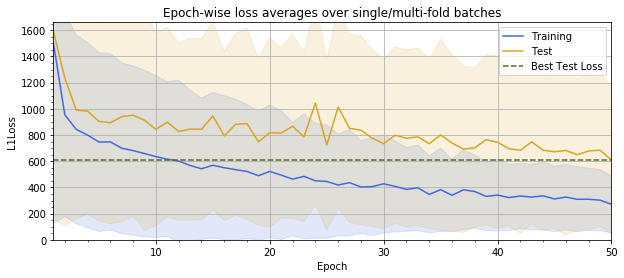

In [2]:
depth_ndvi_earlier = test_depth(dp.DroneNDVIEarlier, 1)
depth_ndvi_earlier.to_csv(os.path.join(results_dir,'depth_ndvi_earlier.csv'))

In [3]:
print("NDVI Earlier")
depth_ndvi_earlier

NDVI Earlier


32                                           64                     \
            4        6        8        10       12       4        6        8    
test   745.888  746.675  785.586  759.747  776.681  747.393  726.991  761.298   
train  377.979  387.457  335.613  360.947  351.415  383.714  348.864  322.651   

                             128                                      
            10       12       4        6        8        10       12  
test   671.974  692.592  791.006  604.037  595.292  557.106  609.438  
train  333.725  327.697  351.333   285.16  293.713  277.747  271.286

#### 2.1.2 NDVI Later Dataset

/home/nevavuor/crop-field-cnn/models/depth/20181116_000116438_Adadelta_1x32x32_4cnn_2fc.pkl
Best Test Loss: 1375.81


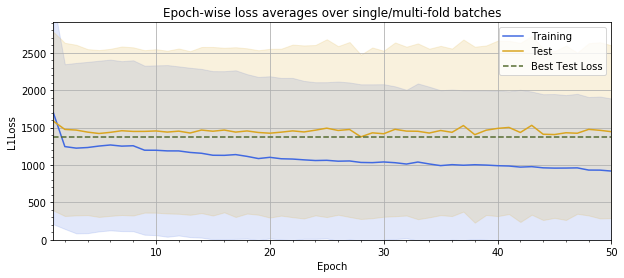

/home/nevavuor/crop-field-cnn/models/depth/20181116_000615470_Adadelta_1x32x32_6cnn_2fc.pkl
Best Test Loss: 1351.29


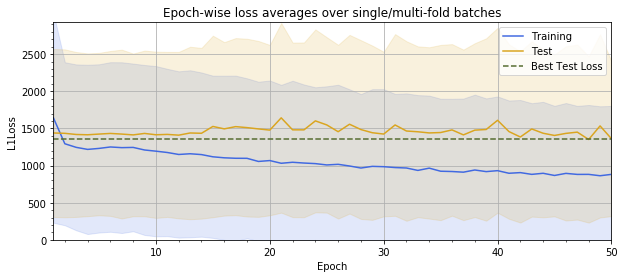

/home/nevavuor/crop-field-cnn/models/depth/20181116_001142989_Adadelta_1x32x32_8cnn_2fc.pkl
Best Test Loss: 1390.48


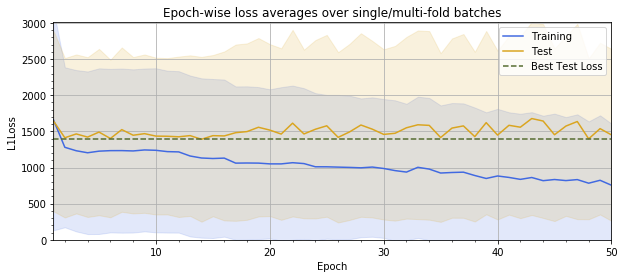

/home/nevavuor/crop-field-cnn/models/depth/20181116_001744189_Adadelta_1x32x32_10cnn_2fc.pkl
Best Test Loss: 1420.34


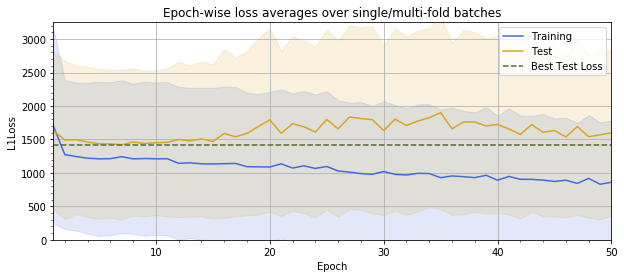

/home/nevavuor/crop-field-cnn/models/depth/20181116_002418555_Adadelta_1x32x32_12cnn_2fc.pkl
Best Test Loss: 1409.32


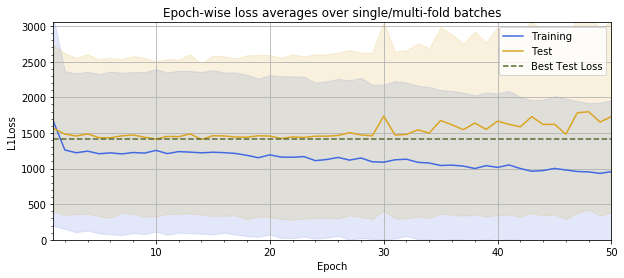

/home/nevavuor/crop-field-cnn/models/depth/20181116_003125426_Adadelta_1x64x64_4cnn_2fc.pkl
Best Test Loss: 1271.75


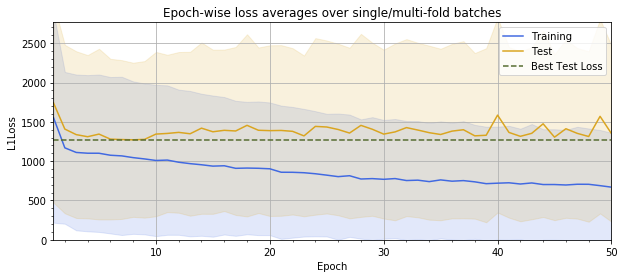

/home/nevavuor/crop-field-cnn/models/depth/20181116_003938231_Adadelta_1x64x64_6cnn_2fc.pkl
Best Test Loss: 1123.84


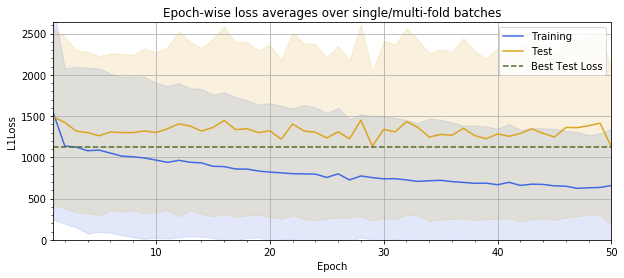

/home/nevavuor/crop-field-cnn/models/depth/20181116_004823556_Adadelta_1x64x64_8cnn_2fc.pkl
Best Test Loss: 1251.22


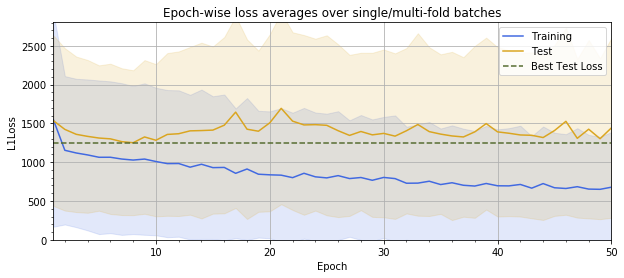

/home/nevavuor/crop-field-cnn/models/depth/20181116_005742500_Adadelta_1x64x64_10cnn_2fc.pkl
Best Test Loss: 6306.92


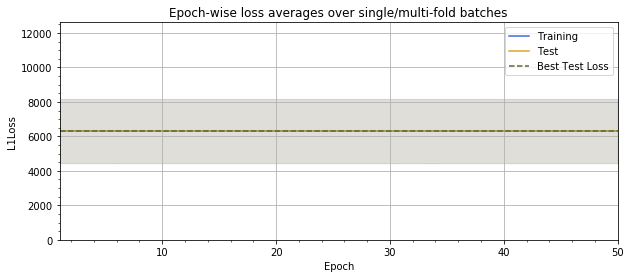

/home/nevavuor/crop-field-cnn/models/depth/20181116_010733577_Adadelta_1x64x64_12cnn_2fc.pkl
Best Test Loss: 1119.03


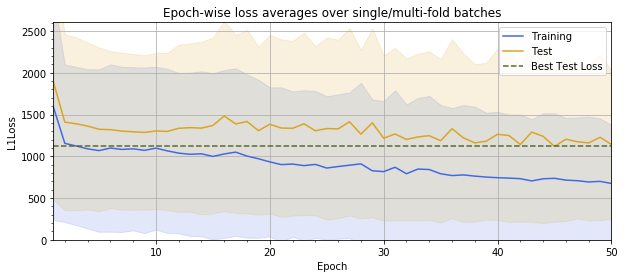

/home/nevavuor/crop-field-cnn/models/depth/20181116_011758551_Adadelta_1x128x128_4cnn_2fc.pkl
Best Test Loss: 848.09


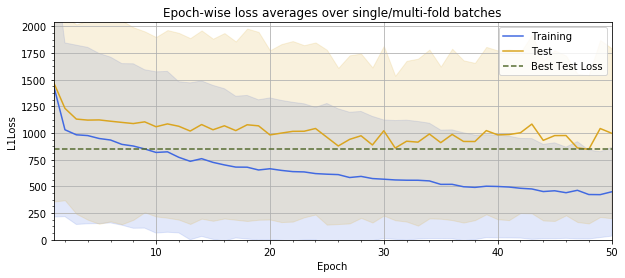

/home/nevavuor/crop-field-cnn/models/depth/20181116_013833877_Adadelta_1x128x128_6cnn_2fc.pkl
Best Test Loss: 1008.48


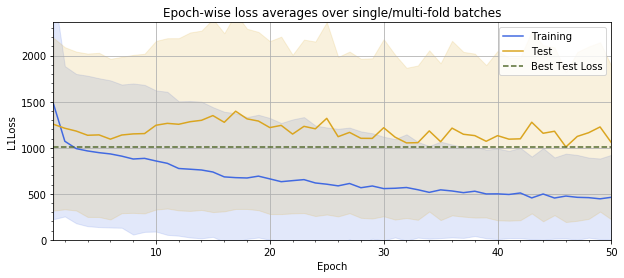

/home/nevavuor/crop-field-cnn/models/depth/20181116_015930327_Adadelta_1x128x128_8cnn_2fc.pkl
Best Test Loss: 1123.67


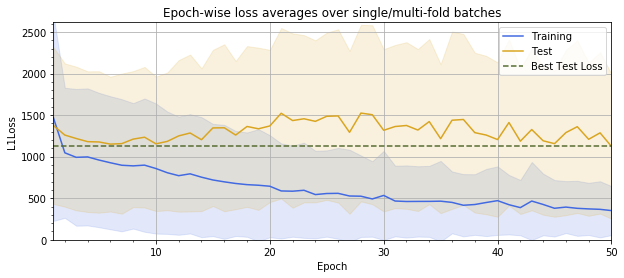

/home/nevavuor/crop-field-cnn/models/depth/20181116_022054294_Adadelta_1x128x128_10cnn_2fc.pkl
Best Test Loss: 1197.91


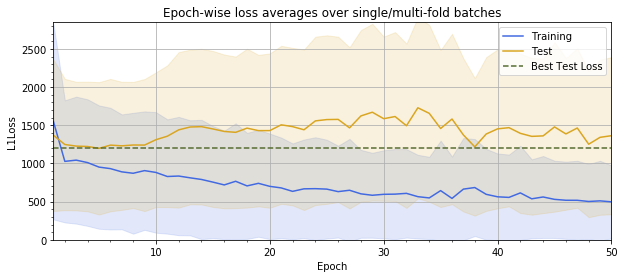

/home/nevavuor/crop-field-cnn/models/depth/20181116_024255455_Adadelta_1x128x128_12cnn_2fc.pkl
Best Test Loss: 1166.10


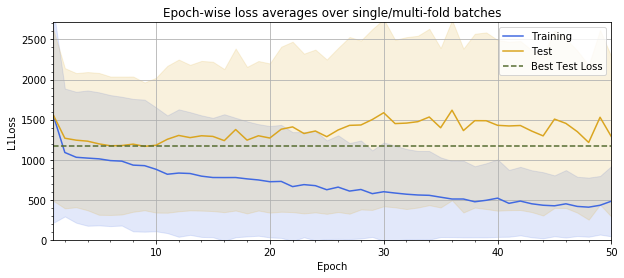

In [4]:
depth_ndvi_later = test_depth(dp.DroneNDVILater, 1)
depth_ndvi_later.to_csv(os.path.join(results_dir,'depth_ndvi_later.csv'))

In [5]:
print("NDVI Later")
depth_ndvi_later

NDVI Later


32                                           64                     \
            4        6        8        10       12       4        6        8    
test   1375.81  1351.29  1390.48  1420.34  1409.32  1271.75  1123.84  1251.22   
train  918.389  862.719  754.834  830.063   932.67  669.414  623.817  650.514   

                             128                                      
            10       12       4        6        8        10       12  
test   6306.92  1119.03  848.092  1008.48  1123.67  1197.91   1166.1  
train  6307.31  674.395  423.202  444.935  351.303  497.335  407.251

##### Re-training poorly initialized models

/home/nevavuor/crop-field-cnn/models/depth/20181116_170037537_Adadelta_1x64x64_10cnn_2fc.pkl
Best Test Loss: 1333.46


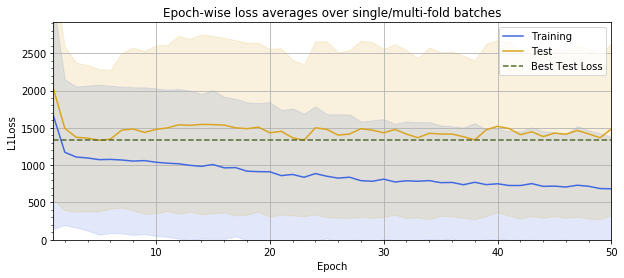

In [28]:
depth_ndvi_later_single = test_depth_single(dp.DroneNDVILater, 1, db_64, 10, 64)

In [48]:
depth_ndvi_later.loc[:,('64','10')] = depth_ndvi_later_single.loc[:,(64,10)]
depth_ndvi_later.to_csv(os.path.join(results_dir,'depth_ndvi_later.csv'))

#### 2.1.3 RGB Earlier Dataset

/home/nevavuor/crop-field-cnn/models/depth/20181116_030540350_Adadelta_3x32x32_4cnn_2fc.pkl
Best Test Loss: 657.41


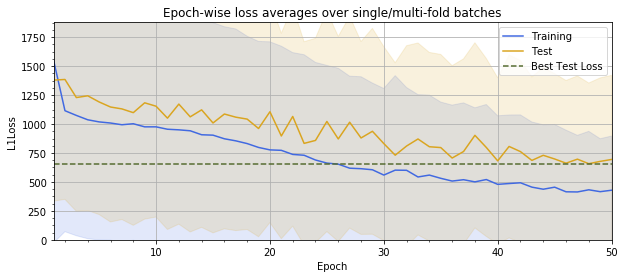

/home/nevavuor/crop-field-cnn/models/depth/20181116_031119045_Adadelta_3x32x32_6cnn_2fc.pkl
Best Test Loss: 518.25


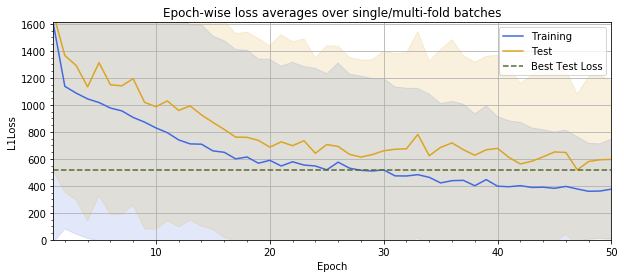

/home/nevavuor/crop-field-cnn/models/depth/20181116_031730480_Adadelta_3x32x32_8cnn_2fc.pkl
Best Test Loss: 562.31


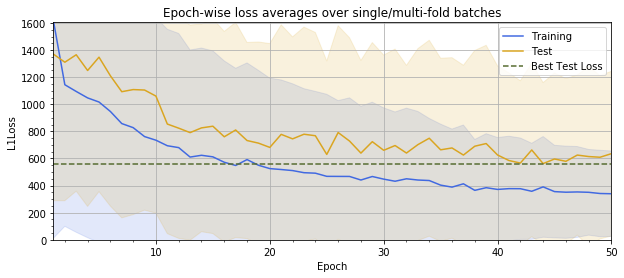

/home/nevavuor/crop-field-cnn/models/depth/20181116_032417187_Adadelta_3x32x32_10cnn_2fc.pkl
Best Test Loss: 543.52


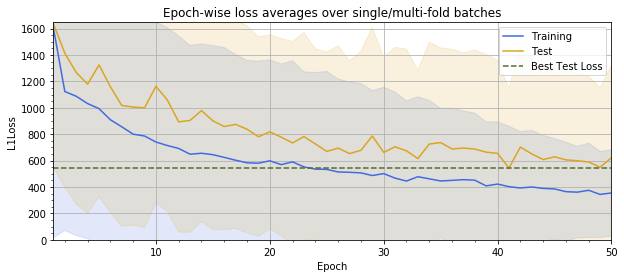

/home/nevavuor/crop-field-cnn/models/depth/20181116_033137247_Adadelta_3x32x32_12cnn_2fc.pkl
Best Test Loss: 566.23


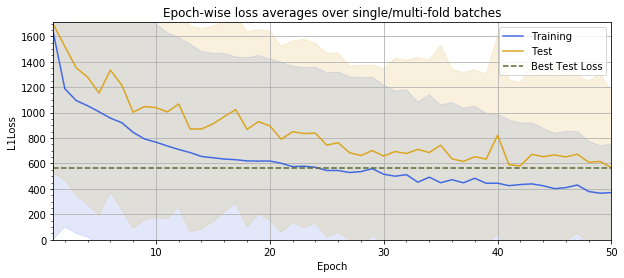

/home/nevavuor/crop-field-cnn/models/depth/20181116_033931046_Adadelta_3x64x64_4cnn_2fc.pkl
Best Test Loss: 671.72


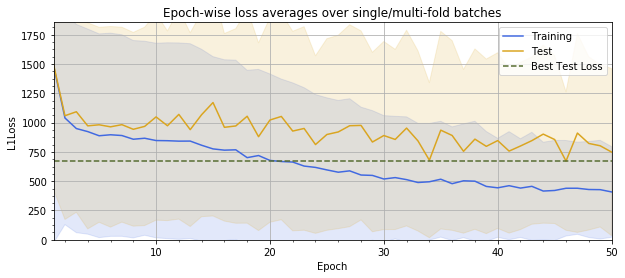

/home/nevavuor/crop-field-cnn/models/depth/20181116_034857433_Adadelta_3x64x64_6cnn_2fc.pkl
Best Test Loss: 583.09


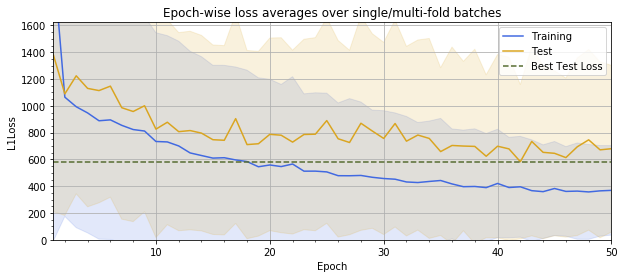

/home/nevavuor/crop-field-cnn/models/depth/20181116_035853957_Adadelta_3x64x64_8cnn_2fc.pkl
Best Test Loss: 539.09


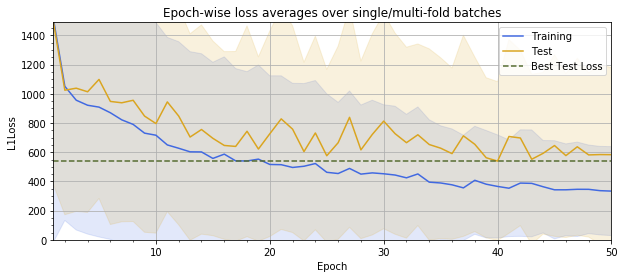

/home/nevavuor/crop-field-cnn/models/depth/20181116_040932858_Adadelta_3x64x64_10cnn_2fc.pkl
Best Test Loss: 562.97


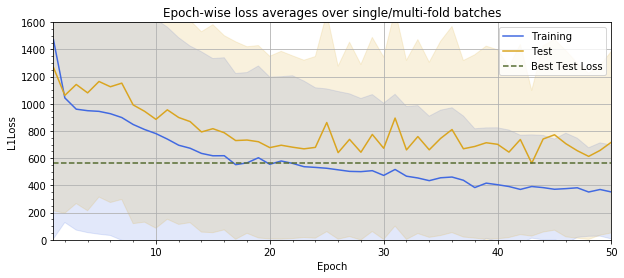

/home/nevavuor/crop-field-cnn/models/depth/20181116_042039270_Adadelta_3x64x64_12cnn_2fc.pkl
Best Test Loss: 611.65


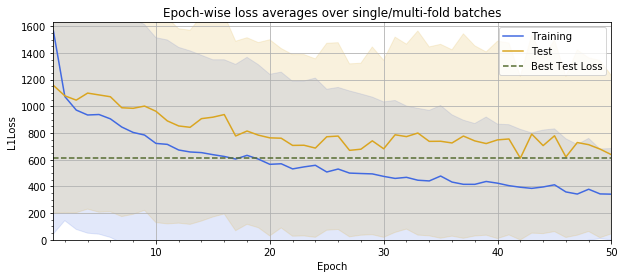

/home/nevavuor/crop-field-cnn/models/depth/20181116_043221403_Adadelta_3x128x128_4cnn_2fc.pkl
Best Test Loss: 616.85


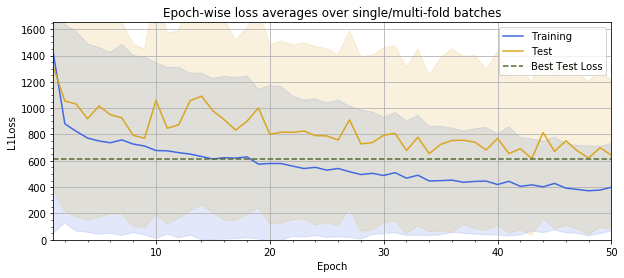

/home/nevavuor/crop-field-cnn/models/depth/20181116_045716421_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 459.41


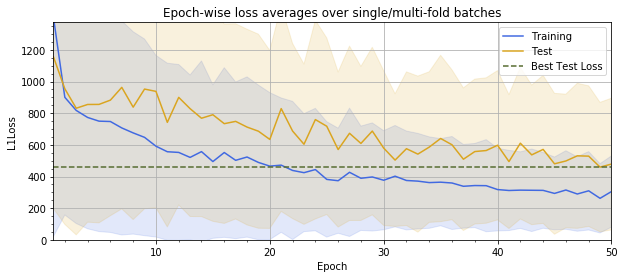

/home/nevavuor/crop-field-cnn/models/depth/20181116_052228912_Adadelta_3x128x128_8cnn_2fc.pkl
Best Test Loss: 603.77


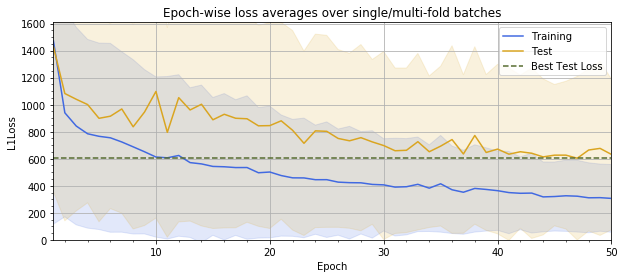

/home/nevavuor/crop-field-cnn/models/depth/20181116_054820897_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 489.47


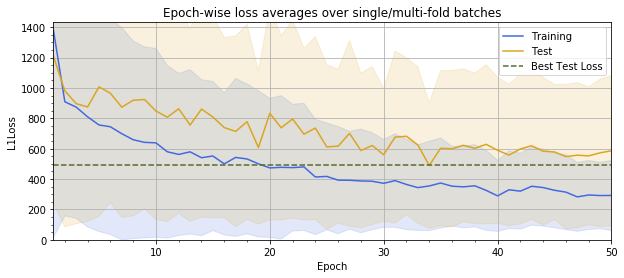

/home/nevavuor/crop-field-cnn/models/depth/20181116_061458003_Adadelta_3x128x128_12cnn_2fc.pkl
Best Test Loss: 572.48


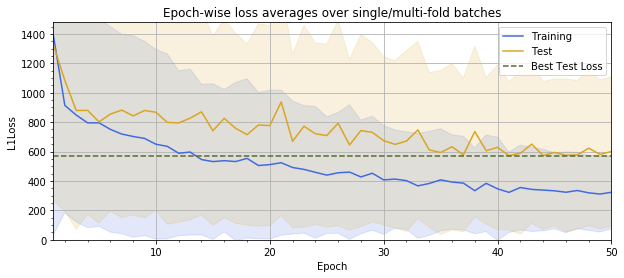

In [6]:
depth_rgb_earlier = test_depth(dp.DroneRGBEarlier, 3)
depth_rgb_earlier.to_csv(os.path.join(results_dir,'depth_rgb_earlier.csv'))

In [7]:
print("RGB Earlier")
depth_rgb_earlier

RGB Earlier


32                                           64                     \
            4        6        8        10       12       4        6        8    
test   657.413  518.247  562.309  543.519  566.234  671.721  583.086  539.093   
train  413.396  359.255  339.849  343.829  366.353  408.346  357.292  333.554   

                             128                                      
            10       12       4        6        8        10       12  
test   562.966   611.65  616.852  459.407  603.766  489.465  572.477  
train  351.514  341.881  372.393  262.207  306.322  282.638  311.215

#### 2.1.4 RGB Later Dataset

/home/nevavuor/crop-field-cnn/models/depth/20181116_064157395_Adadelta_3x32x32_4cnn_2fc.pkl
Best Test Loss: 704.89


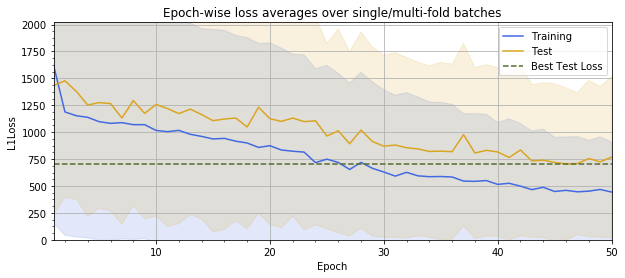

/home/nevavuor/crop-field-cnn/models/depth/20181116_064717895_Adadelta_3x32x32_6cnn_2fc.pkl
Best Test Loss: 571.75


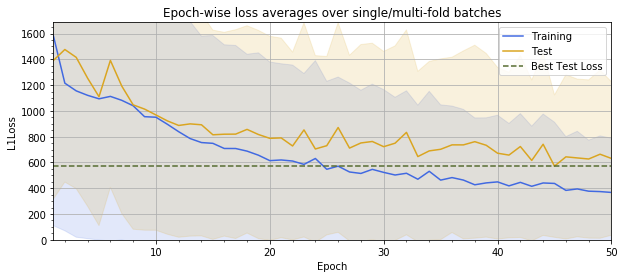

/home/nevavuor/crop-field-cnn/models/depth/20181116_065306712_Adadelta_3x32x32_8cnn_2fc.pkl
Best Test Loss: 616.75


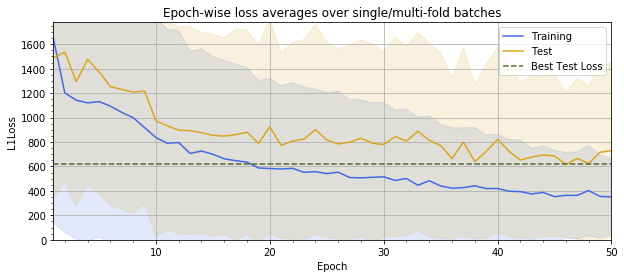

/home/nevavuor/crop-field-cnn/models/depth/20181116_065926755_Adadelta_3x32x32_10cnn_2fc.pkl
Best Test Loss: 678.57


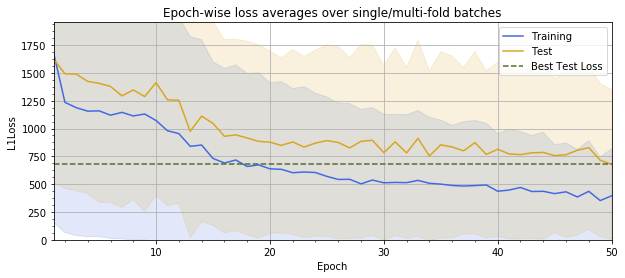

/home/nevavuor/crop-field-cnn/models/depth/20181116_070615074_Adadelta_3x32x32_12cnn_2fc.pkl
Best Test Loss: 767.88


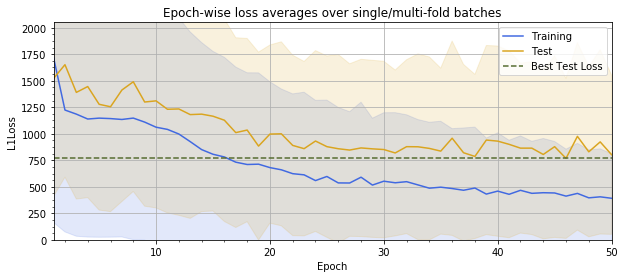

/home/nevavuor/crop-field-cnn/models/depth/20181116_071332436_Adadelta_3x64x64_4cnn_2fc.pkl
Best Test Loss: 536.53


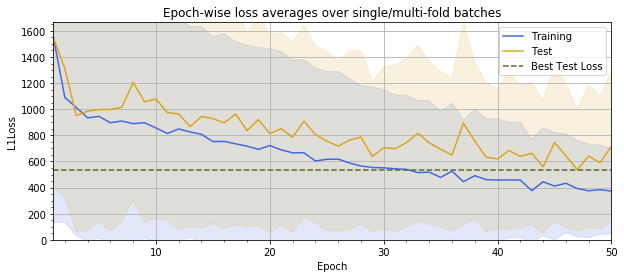

/home/nevavuor/crop-field-cnn/models/depth/20181116_072215982_Adadelta_3x64x64_6cnn_2fc.pkl
Best Test Loss: 504.78


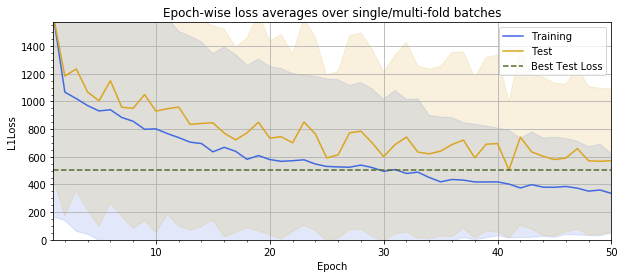

/home/nevavuor/crop-field-cnn/models/depth/20181116_073121555_Adadelta_3x64x64_8cnn_2fc.pkl
Best Test Loss: 530.18


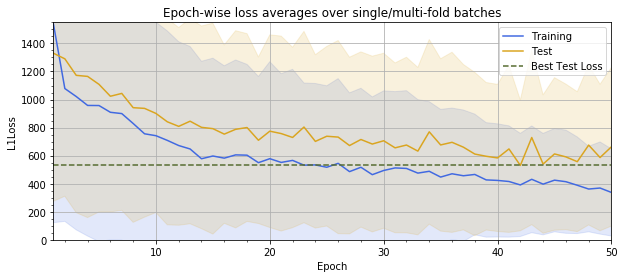

/home/nevavuor/crop-field-cnn/models/depth/20181116_074057176_Adadelta_3x64x64_10cnn_2fc.pkl
Best Test Loss: 620.97


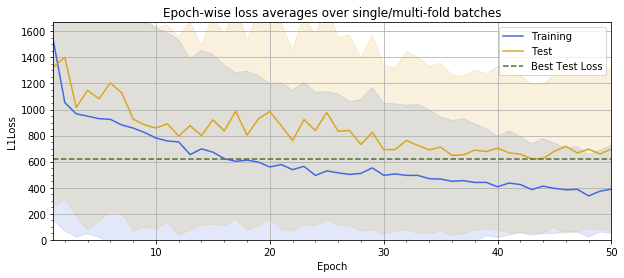

/home/nevavuor/crop-field-cnn/models/depth/20181116_075106354_Adadelta_3x64x64_12cnn_2fc.pkl
Best Test Loss: 6748.98


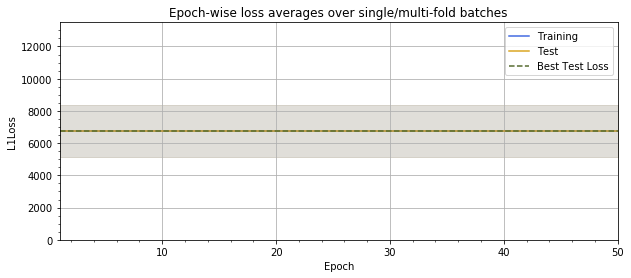

/home/nevavuor/crop-field-cnn/models/depth/20181116_080148620_Adadelta_3x128x128_4cnn_2fc.pkl
Best Test Loss: 469.74


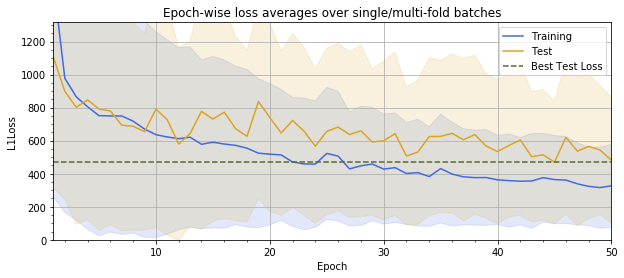

/home/nevavuor/crop-field-cnn/models/depth/20181116_082502349_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 385.03


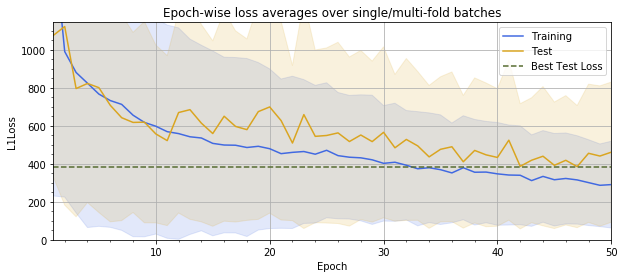

/home/nevavuor/crop-field-cnn/models/depth/20181116_084803084_Adadelta_3x128x128_8cnn_2fc.pkl
Best Test Loss: 454.26


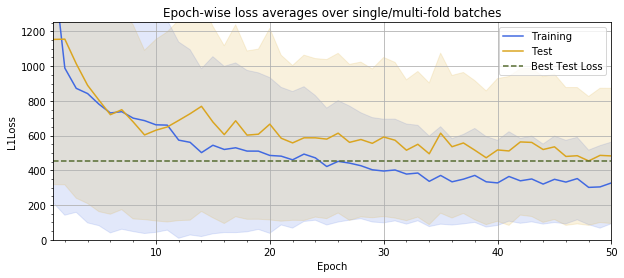

/home/nevavuor/crop-field-cnn/models/depth/20181116_091132060_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 403.28


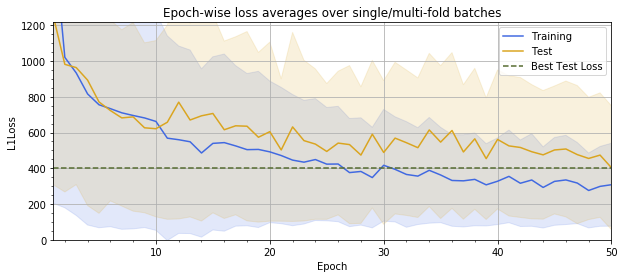

/home/nevavuor/crop-field-cnn/models/depth/20181116_093531895_Adadelta_3x128x128_12cnn_2fc.pkl
Best Test Loss: 471.83


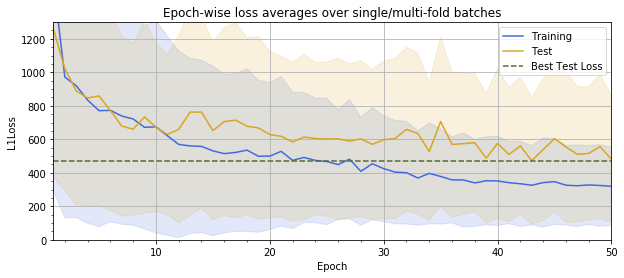

In [8]:
depth_rgb_later = test_depth(dp.DroneRGBLater, 3)
depth_rgb_later.to_csv(os.path.join(results_dir,'depth_rgb_later.csv'))

In [9]:
print("RGB Later")
depth_rgb_later

RGB Later


32                                           64                     \
            4        6        8        10       12       4        6        8    
test   704.888  571.751  616.751  678.574  767.876  536.528  504.778  530.182   
train  443.407  367.375  350.849  352.311  391.538  372.452  335.128  337.636   

                             128                                      
            10       12       4        6        8        10       12  
test   620.966  6748.98  469.743  385.028  454.262  403.278  471.832  
train  336.919  6748.98  315.829  286.658  301.794  275.921  319.242

##### Re-training poorly initialized models

/home/nevavuor/crop-field-cnn/models/depth/20181116_171040178_Adadelta_3x64x64_12cnn_2fc.pkl
Best Test Loss: 588.42


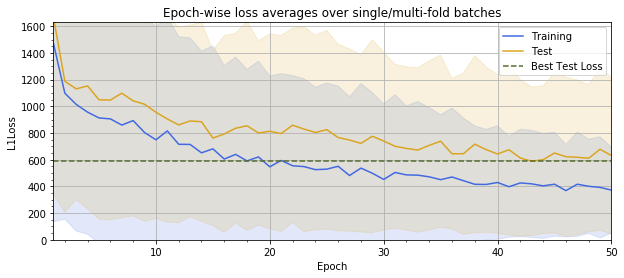

In [29]:
depth_rgb_later_single = test_depth_single(dp.DroneRGBLater, 3, db_64, 12, 64)

In [52]:
depth_rgb_later.loc[:,('64','12')] =  depth_rgb_later_single.loc[:,(64,12)]
depth_rgb_later.to_csv(os.path.join(results_dir,'depth_rgb_later.csv'))

### 2.3 Conclusion for the Depth

With so many numbers it is actually starting to get a bit hard to grasp the progression. We therefore take these numbers and plot them  out. The error values for the unfitted will be handled as `NaN`s to ensure proper scaling of the plots. The plotted areas use the training error as the upper bound and the test error as the lower bound.

In [53]:
import pandas as pd
import numpy as np
import os

depth_ndvi_earlier=pd.read_csv(os.path.join(results_dir,'depth_ndvi_earlier.csv'),index_col=0,header=[0,1])
depth_ndvi_later=pd.read_csv(os.path.join(results_dir,'depth_ndvi_later.csv'),index_col=0,header=[0,1])
depth_rgb_earlier=pd.read_csv(os.path.join(results_dir,'depth_rgb_earlier.csv'),index_col=0,header=[0,1])
depth_rgb_later=pd.read_csv(os.path.join(results_dir,'depth_rgb_later.csv'),index_col=0,header=[0,1])

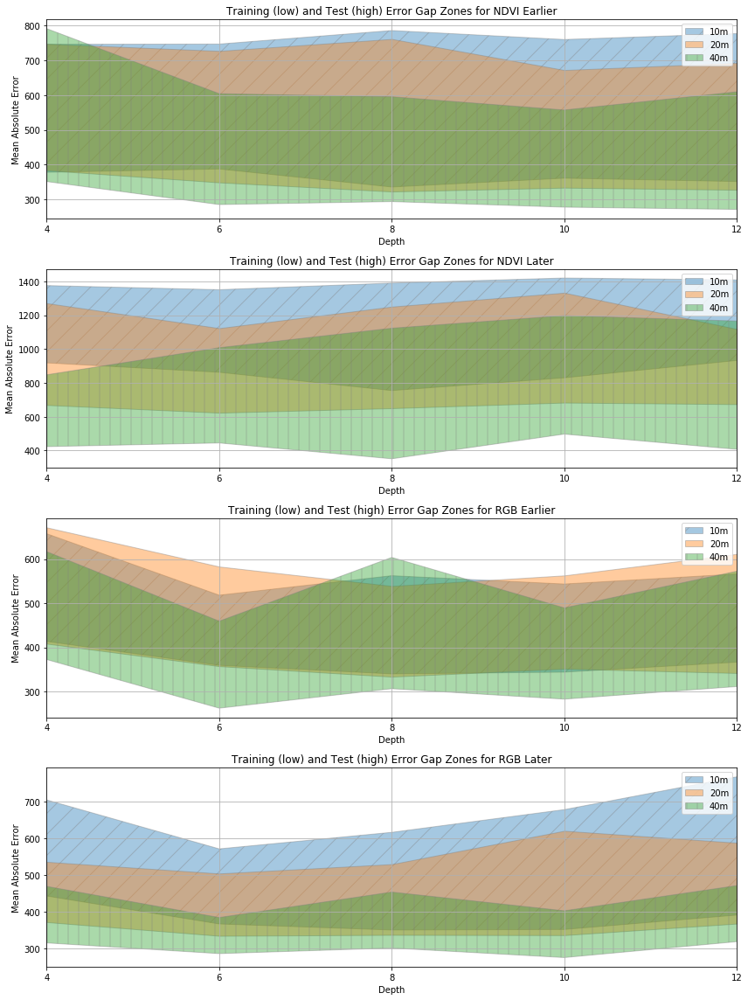

In [61]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os 

plt.rcParams['figure.figsize'] = 12, 16
hatches = ['/', None, '|']
x = list(range(4, 14, 2))
result_sets = [depth_ndvi_earlier, depth_ndvi_later, depth_rgb_earlier ,depth_rgb_later]
result_set_names = ['NDVI Earlier','NDVI Later','RGB Earlier','RGB Later']
for i, label in enumerate(['10m', '20m', '40m']):
    window_px = str(32*2**i)
    for j, result_set in enumerate(result_sets):
        plt.subplot(411+j)
        plt.fill_between(x, 
                         list(result_set.loc['train',window_px].values), 
                         list(result_set.loc['test',window_px].values),
                         label=label, 
                         hatch=hatches[i], 
                         edgecolor='gray', 
                         alpha=0.4)
        plt.xticks(x)
        plt.xlim([4, 12])
        plt.legend()
        plt.grid()
        plt.xlabel("Depth")
        plt.ylabel("Mean Absolute Error")
        plt.title(f"Training (low) and Test (high) Error Gap Zones for {result_set_names[j]}")
plt.tight_layout()
plt.savefig(os.path.join(os.getcwd(),'results','cnn-depth.png'),
            dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

The optimal result is achieved with **depth of 10 layers and the 128px image dataset**. The test losses are however notably lower for the RGB images than for the NDVI images.

## 3. Regularization

We have already concluded that the optimal optimizer to use is the Adadelta and the optimal CNN depth is 8 layers. We have also concluded as a side product of the optimal depth research that minimal test loss is best achieved using 128px RGB datasets. Now it is time to attempt at drivin the test loss down by means of regularization. We have two possibilities, early stopping and weight decay.

The hyperparameter for the early stopping is the number of consecutive non-improving training iterations to perform before terminating the training. We will also implement a second boolean hyperparameter for whether to continue training after first termination. The hyperparameter for the weight decay is the decay coefficient. We will try out several values with random search. Thus we will try out a fixed amount of trainings and see which one of them produces the lowest test error.

We will set the hyperparameter value ranges as follows:

- Early stopping (`patience`): $[10, ... , 50]$
- Weight decay (`weight_decay`): $[0.0, ... , 1.0]$

While this is just a comparison, we'll continue using a limited amount of epochs to see how the overall progression of the training proceeds. We'll also proceed byt first testing the weight decay and only after that the early stopping. This is because the training times grow exceedingly after the number of epochs is in ballpark where early stopping is able to show its effectiveness.

In [4]:
import os
import shutil

import numpy as np
import pandas as pd
import torch
from torch import optim

from field_analysis.model.dataset import dataperiod as dp
from field_analysis.model.nets.cnn import DroneYieldMeanCNN
import field_analysis.settings.model as model_settings
%matplotlib inline

DB_128 = 'field_analysis_40m_128px.db'
DATASET_NAMES = ['earlier', 'later']
EPOCHS = 50
regularized_models_dir = os.path.join(model_settings.MODELS_DIR,'regularization')
os.makedirs(regularized_models_dir,exist_ok=True)


def copy_model(cnn, is_later, save):
    "Copy the dataset-wise persisted model either for later use (`save=True`) or current use (`save=False`)."
    cnn.model_path = os.path.join(regularized_models_dir,cnn.model_filename)
    model_folder, _ = os.path.split(cnn.model_path)
    model_name, suffix = cnn.model_filename.split('.')
    model_name = "initial_model_{}.{}".format(
        DATASET_NAMES[is_later], suffix)
    if save:
        cnn.save_model()
        from_path = cnn.model_path
        to_path = os.path.join(model_folder, model_name)
    else:
        from_path = os.path.join(model_folder, model_name)
        to_path = cnn.model_path
    shutil.copyfile(from_path, to_path)
    print("Persisted model copied \n\tFrom: {} \n\tTo: {}".format(from_path, to_path))

### 3.1 Initializing Networks

Before we delve deeper in to comparing the performance metrics with varying hyperparametervalues, we will initialize a network with no further training. This is to ensure that all the runs are performed with equally initialized model and.

#### 3.1.1 RGB Earlier Dataset

First we train the initial model for earlier dataset.

In [5]:
cnn = DroneYieldMeanCNN(
    source_bands=3,
    source_dim=128,
    cnn_layers=10,
    optimizer=optim.Adadelta)
copy_model(cnn=cnn, is_later=False, save=True)

Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181116_194926952_Adadelta_3x128x128_10cnn_2fc.pkl
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/20181116_194926952_Adadelta_3x128x128_10cnn_2fc.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl


#### 3.1.2 RGB Later Dataset

Then we train the later dataset initial model.

In [6]:
cnn = DroneYieldMeanCNN(
    source_bands=3,
    source_dim=128,
    cnn_layers=10,
    optimizer=optim.Adadelta)
copy_model(cnn=cnn, is_later=True, save=True)

Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181116_194936605_Adadelta_3x128x128_10cnn_2fc.pkl
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/20181116_194936605_Adadelta_3x128x128_10cnn_2fc.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_later.pkl


### 3.2 Benchmark Trainings

We will first perform benchmark trainings with no regularization. This is to see where the training would progress. We will then compare the regularized trainings to these to see the level of improvement attained.

#### 3.2.1 RGB Earlier Dataset

Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181116_195007905_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181116_195007905_Adadelta_3x128x128_10cnn_2fc.pkl
Starting the training with GPU:
[   3/  50] (1m 41s) 	Mean Loss:	Train=901.73 +-759.91	Test=1029.86 +-882.35
[   6/  50] (3m 14s) 	Mean Loss:	Train=749.94 +-705.17	Test=933.75 +-771.55
[   9/  50] (4m 46s) 	Mean Loss:	Train=630.00 +-614.59	Test=704.54 +-648.17
[  12/  50] (6m 19s) 	Mean Loss:	Train=542.98 +-559.07	Test=804.12 +-598.19
[  15/  50] (7m 51s) 	Mean Loss:	Train=543.11 +-510.75	Test=827.62 +-662.78
[  18/  50] (9m 23s) 	Mean Loss:	Train=522.37 +-485.80	Test=745.58 +-626.15
[  21/  50] (10m 55s) 	Mean Loss:	Train=461.29 +-439.72	Test=690.46 +-614.86
[  24/  50] (12m 28s) 	Mean Loss:	Train=457.65 +-406.42	Test=723.07 +-593.31
[  27/  50]

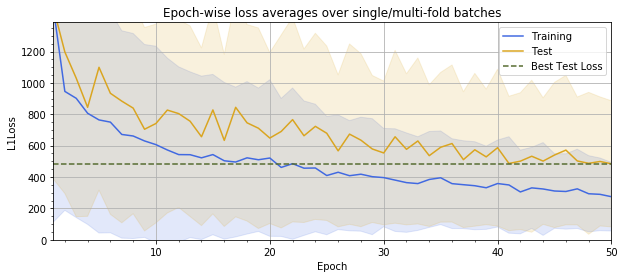

In [7]:
cnn = DroneYieldMeanCNN(
    source_bands=3,
    source_dim=128,
    cnn_layers=10,
    optimizer=optim.Adadelta)
copy_model(cnn=cnn, is_later=False, save=False)
cnn.load_model()
_ = cnn.train(
    epochs=EPOCHS,
    training_data=dp.DroneRGBEarlier(DB_128),
    k_cv_folds=3)

#### 3.2.2 RGB Later Dataset

Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181116_201605765_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181116_201605765_Adadelta_3x128x128_10cnn_2fc.pkl
Starting the training with GPU:
[   3/  50] (1m 34s) 	Mean Loss:	Train=869.88 +-776.04	Test=853.07 +-648.70
[   6/  50] (3m  1s) 	Mean Loss:	Train=763.62 +-668.85	Test=783.45 +-704.16
[   9/  50] (4m 28s) 	Mean Loss:	Train=645.10 +-622.74	Test=626.99 +-486.77
[  12/  50] (5m 56s) 	Mean Loss:	Train=605.52 +-582.76	Test=633.68 +-484.28
[  15/  50] (7m 22s) 	Mean Loss:	Train=494.22 +-452.33	Test=769.29 +-622.86
[  18/  50] (8m 49s) 	Mean Loss:	Train=512.01 +-417.03	Test=661.46 +-527.74
[  21/  50] (10m 16s) 	Mean Loss:	Train=492.18 +-398.85	Test=527.55 +-426.07
[  24/  50] (11m 43s) 	Mean Loss:	Train=446.24 +-368.29	Test=661.17 +-534.20
[  27/  50] (1

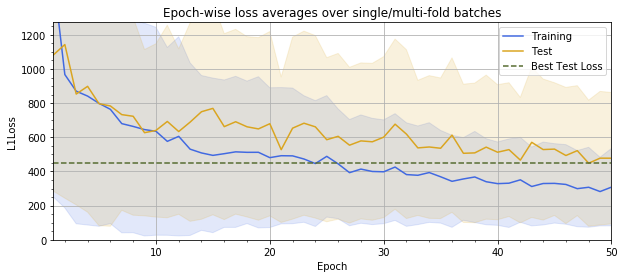

In [8]:
cnn = DroneYieldMeanCNN(
    source_bands=3,
    source_dim=128,
    cnn_layers=10,
    optimizer=optim.Adadelta)
copy_model(cnn=cnn, is_later=True, save=False)
cnn.load_model()
_ = cnn.train(
    epochs=EPOCHS,
    training_data=dp.DroneRGBLater(DB_128),
    k_cv_folds=3)

### 3.2 Weight decay

First we research the optimal weight decay by running series of grid searches. We want to first see if there is a coarse area of better test errors achieved with only a maximum of 50 epochs. After that we'll use this information to perform random searches in this neighborhood of best coarse values drawing random samples from a normal distribution with mean corresponding to the dataset-wise lowest grid search and standard deviation focusing the values around that particular mean value.

In [9]:
def test_weight_decay(dataset, weight_decays):
    best_losses = pd.DataFrame(
        columns=['weight_decay', 'best_loss', 'loss_mean', 'loss_std'])
    for weight_decay in weight_decays:
        print("weight_decay={}".format(
            weight_decay))
        cnn = DroneYieldMeanCNN(
            source_bands=3,
            source_dim=128,
            cnn_layers=10,
            optimizer=optim.Adadelta,
            optimizer_parameters={'weight_decay': weight_decay})
        copy_model(cnn=cnn, is_later=isinstance(dataset, dp.DroneRGBLater), save=False)
        cnn.load_model()
        losses_dict = cnn.train(
            epochs=EPOCHS,
            training_data=dataset(DB_128),
            k_cv_folds=3,
            suppress_output=True)
        losses = np.array(losses_dict['test_losses_mean_std'])[:, 0]
        best_losses = best_losses.append(
            {'weight_decay': weight_decay,
             'best_loss': losses.min(),
             'loss_mean': losses.mean(),
             'loss_std': losses.std()},
            ignore_index=True)
    return best_losses.sort_values(by='weight_decay').reset_index(drop=True)

#(weight_decay, best_loss)
best_l2_earlier = (None,None)
best_l2_later = (None,None)

#### 3.2.1 Grid Search with Both RGB Datasets

So first we perform a crude grid search with multiple values of powers of ten.

##### 3.2.1.1 RGB Earlier Dataset

weight_decay=0.001
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181116_204025637_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181116_204025637_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 477.21


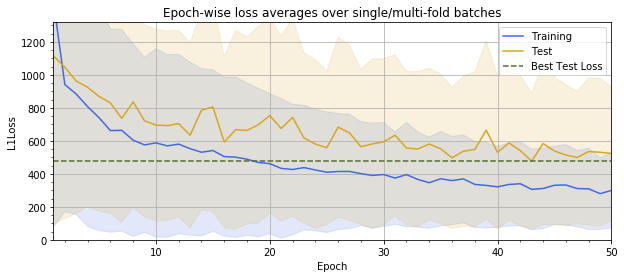

weight_decay=0.01
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181116_210628982_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181116_210628982_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 570.32


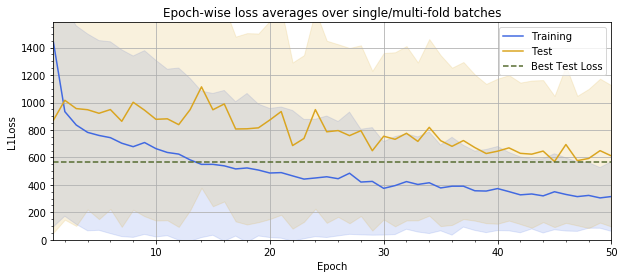

weight_decay=0.1
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181116_213240655_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181116_213240655_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 503.85


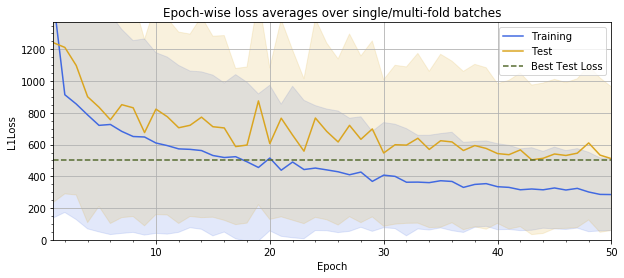

weight_decay=1.0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181116_215858739_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181116_215858739_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 451.55


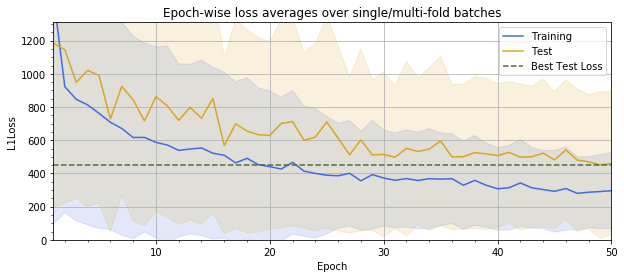

weight_decay=10.0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181116_222521934_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181116_222521934_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 450.23


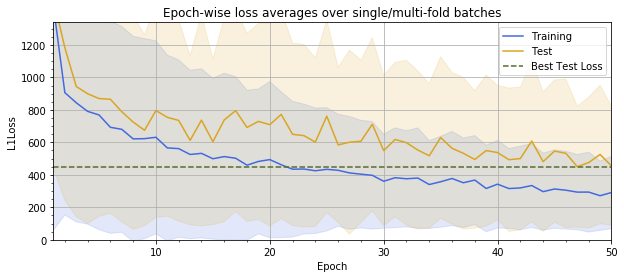

In [10]:
l2_earlier = test_weight_decay(dp.DroneRGBEarlier, [1e-3, 1e-2, 1e-1, 1e0, 1e1])

,weight_decay,best_loss,loss_mean,loss_std
0,0.001,477.211771,659.071748,142.678612
1,0.010,570.319333,791.993147,134.383861
2,0.100,503.853242,685.078342,164.536070
3,1.000,451.549101,655.001710,180.832897
4,10.000,450.234931,669.587943,184.044392


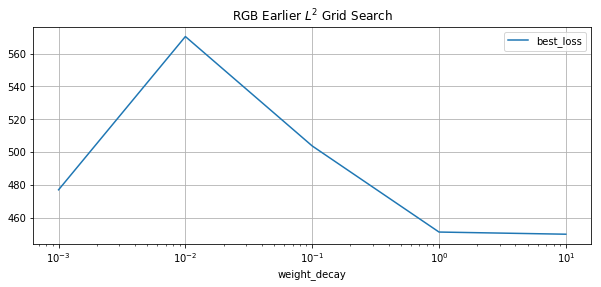

In [11]:
l2_earlier.plot(x='weight_decay', y='best_loss', logx=True, grid=True, title='RGB Earlier $L^2$ Grid Search')
l2_earlier

In [12]:
best_row = l2_earlier.loc[l2_earlier['best_loss'].idxmin()]
best_l2_earlier = (best_row['weight_decay'], best_row['best_loss'])
best_l2_earlier

(10.0, 450.2349305397355)

##### 3.2.1.2 RGB Later Dataset

weight_decay=0.001
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181116_225135026_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181116_225135026_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 469.79


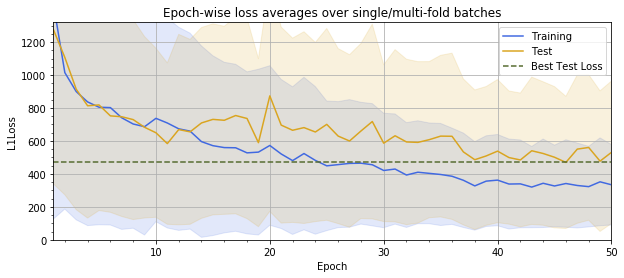

weight_decay=0.01
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181116_231547763_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181116_231547763_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 437.69


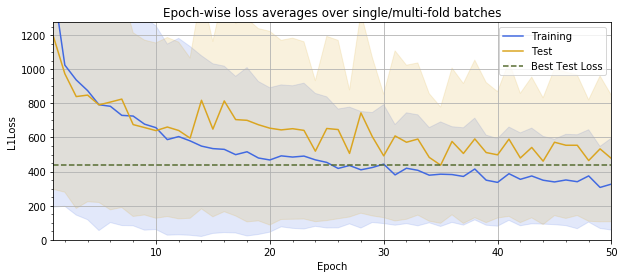

weight_decay=0.1
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181116_233959373_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181116_233959373_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 447.64


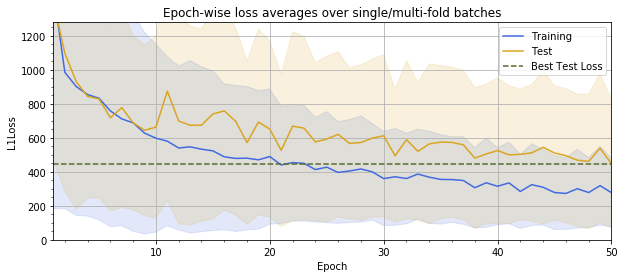

weight_decay=1.0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_000419142_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_000419142_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 434.80


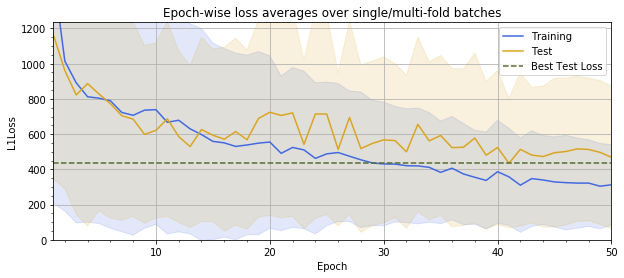

weight_decay=10.0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_002841866_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_002841866_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 481.56


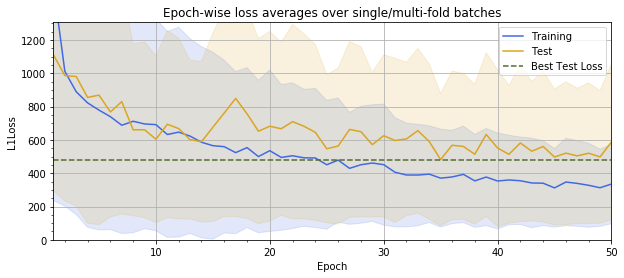

In [13]:
l2_later = test_weight_decay(dp.DroneRGBLater, [1e-3, 1e-2, 1e-1, 1e0, 1e1])

,weight_decay,best_loss,loss_mean,loss_std
0,0.001,469.792148,659.911374,150.582433
1,0.010,437.688612,637.389861,142.644531
2,0.100,447.641663,639.658510,169.256473
3,1.000,434.804030,617.291118,138.717553
4,10.000,481.556474,652.979327,134.723806


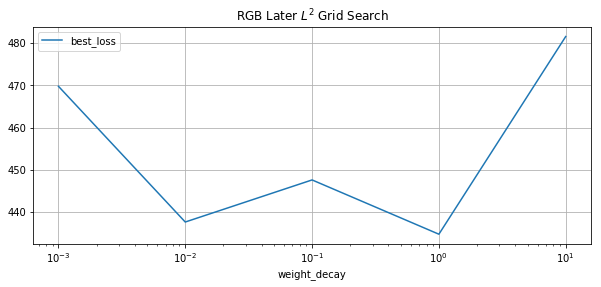

In [14]:
l2_later.plot(x='weight_decay', y='best_loss', logx=True, grid=True, title='RGB Later $L^2$ Grid Search')
l2_later

In [15]:
best_row = l2_later.loc[l2_later['best_loss'].idxmin()]
best_l2_later = (best_row['weight_decay'], best_row['best_loss'])
best_l2_later

(1.0, 434.80403039355747)

#### 3.2.2 Random Search with Both Datasets

Then we perform a zoomed search around the optimal values. 

There is one discussion point however, and that is the lowest test loss produced for RGB Earlier dataset. When comparing the loss progression with graphs, it seems that the lowest loss with ``weight_decay=0.001`` could be attributable to just random fluctuations. To support this notion, the graphs of other regularization values produce more values close to the lowest attained loss more coherently, while the loss of the first regularization test with the first dataset jumps back up to 550ish test loss range. 

Thus it seems that for both datasets we could use similar base ballpark of random search values. One option would to use a normal distribution. Another is to use a limited range uniform distribution. We will go with normal to properly zoom to a range of optimal values.

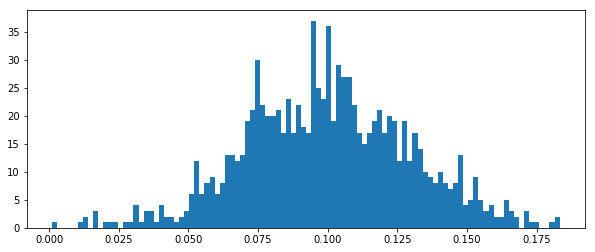

In [16]:
import matplotlib.pyplot as plt
import numpy as np
_ = plt.hist(np.random.normal(loc=1e-1, scale=3*1e-2, size=1000), bins=100)

##### 3.2.2.1 RGB Earlier Dataset

weight_decay=17.068212685244106
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_005256636_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_005256636_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 489.63


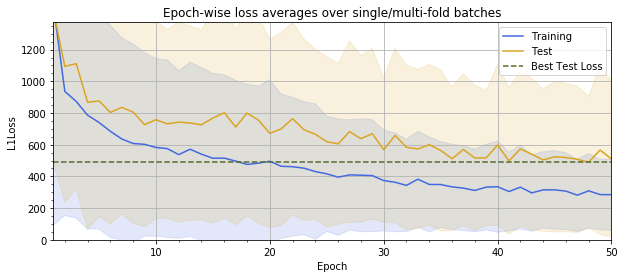

weight_decay=17.600023363852422
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_011920223_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_011920223_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 465.03


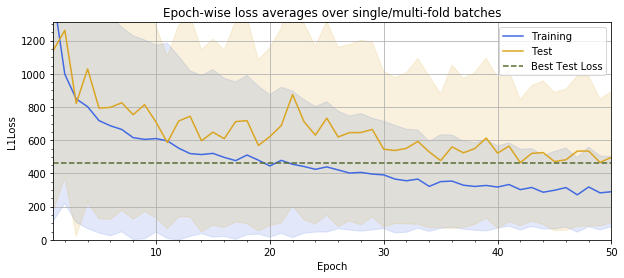

weight_decay=5.932954864632261
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_014541309_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_014541309_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 503.30


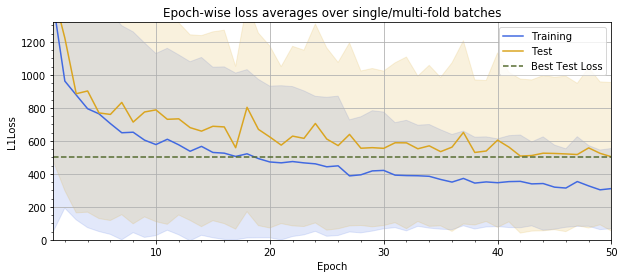

weight_decay=18.644003478251282
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_021213017_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_021213017_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 583.61


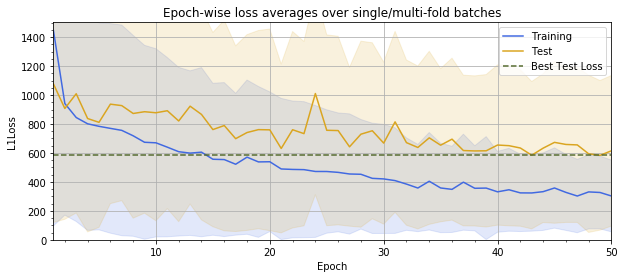

weight_decay=12.647383906920089
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_023838202_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_023838202_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 575.13


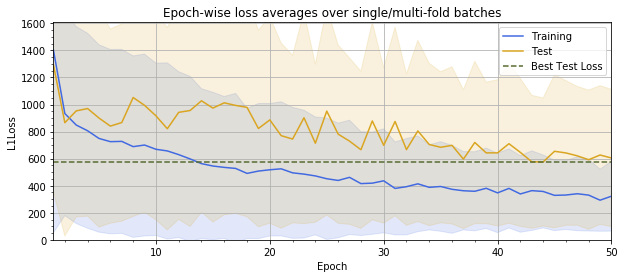

weight_decay=2.1295144508859662
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_030503371_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_030503371_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 489.16


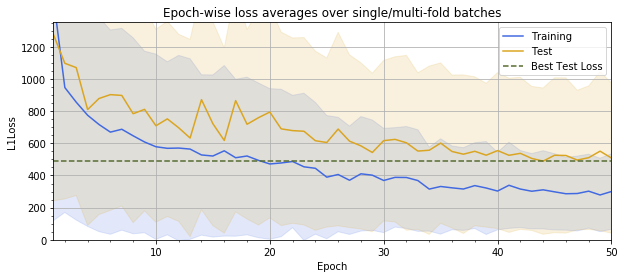

weight_decay=5.070295153974401
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_033126305_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_033126305_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 469.28


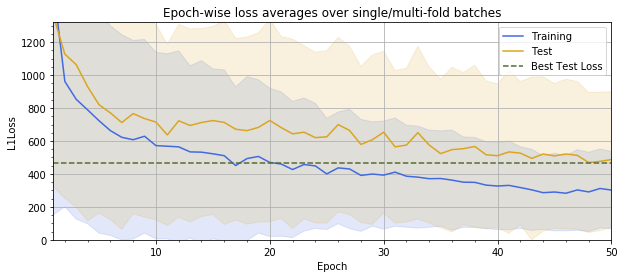

weight_decay=9.428403444346644
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_035748142_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_035748142_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 528.56


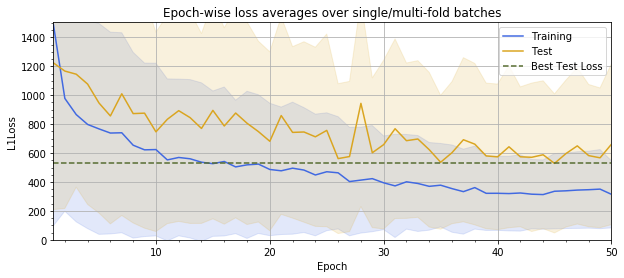

weight_decay=4.984524339236719
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_042424395_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_042424395_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 482.70


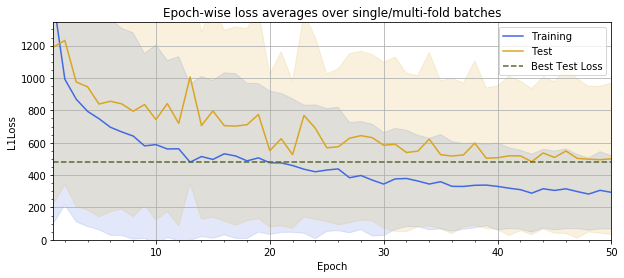

weight_decay=9.748598965049288
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_045046992_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_045046992_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 437.49


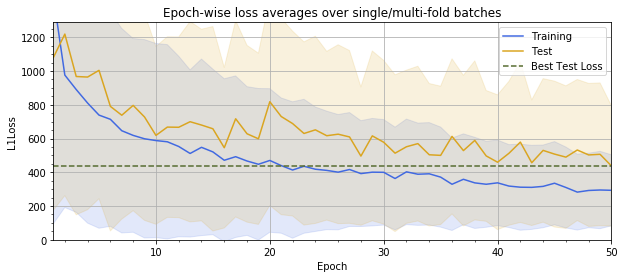

In [17]:
l2_earlier = test_weight_decay(dp.DroneRGBEarlier, 
                               np.abs(np.random.normal(loc=best_l2_earlier[0], 
                                                       scale=5*best_l2_earlier[0]*0.1, 
                                                       size=10)))

,weight_decay,best_loss,loss_mean,loss_std
0,2.129514,489.163634,675.933279,168.783139
1,4.984524,482.698196,671.880394,177.353601
2,5.070295,469.281613,660.154142,167.423087
3,5.932955,503.304393,658.996332,178.049748
4,9.428403,528.557759,752.125530,170.595561
5,9.748599,437.493057,644.216358,165.067455
6,12.647384,575.125327,803.587462,157.418415
7,17.068213,489.630977,686.024756,176.495561
8,17.600023,465.027567,655.009037,164.727226
9,18.644003,583.611680,751.131721,123.223317


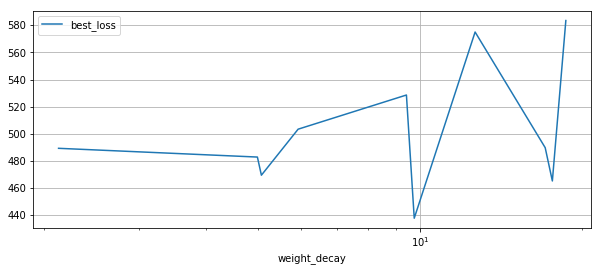

In [18]:
l2_earlier.plot(x='weight_decay', y='best_loss', logx=True, grid=True)
l2_earlier

In [19]:
best_row = l2_earlier.loc[l2_earlier['best_loss'].idxmin()]

if best_row['best_loss'] < best_l2_earlier[-1]:
    best_l2_earlier = (best_row['weight_decay'], best_row['best_loss'])

best_l2_earlier

(9.748598965049288, 437.493056788589)

##### 3.2.2.2 RGB Later Dataset

weight_decay=0.777759413420733
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_051716492_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_051716492_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 433.33


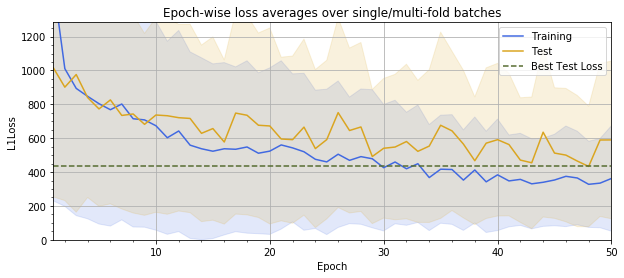

weight_decay=0.7113536107989309
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_054142930_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_054142930_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 456.60


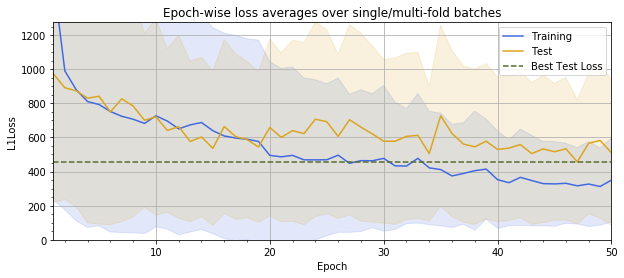

weight_decay=0.3700925626607817
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_060614219_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_060614219_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 414.16


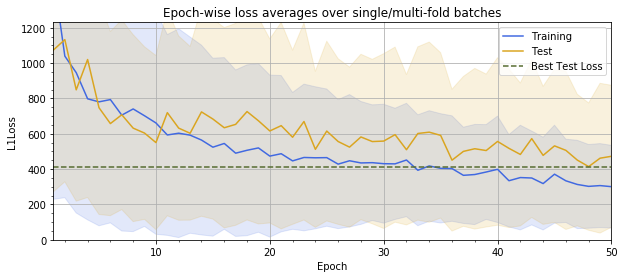

weight_decay=1.5895413413512367
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_063035799_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_063035799_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 435.51


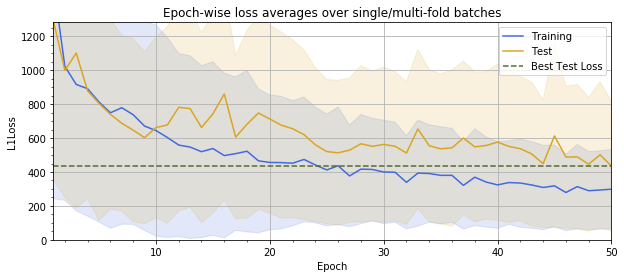

weight_decay=1.3921978863094684
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_065458234_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_065458234_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 483.72


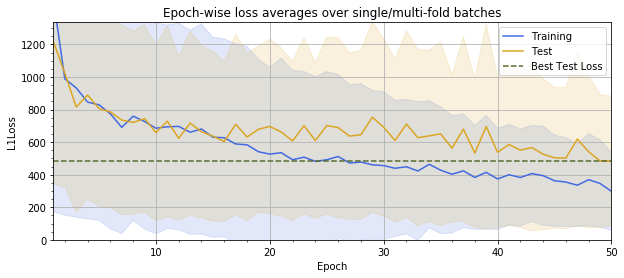

weight_decay=1.5951394211868655
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_071920975_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_071920975_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 460.96


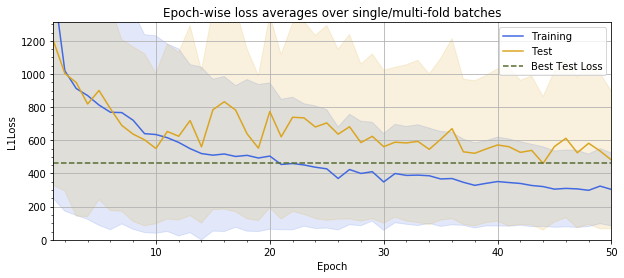

weight_decay=1.4835050886198036
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_074339848_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_074339848_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 394.15


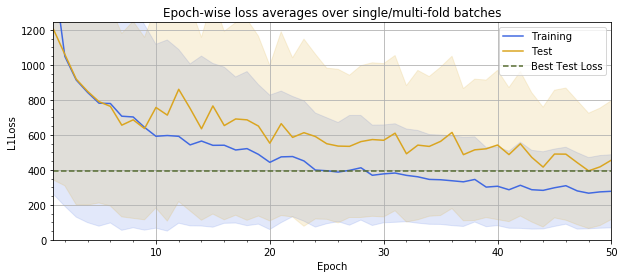

weight_decay=1.617714390633095
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_080803049_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_080803049_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 542.66


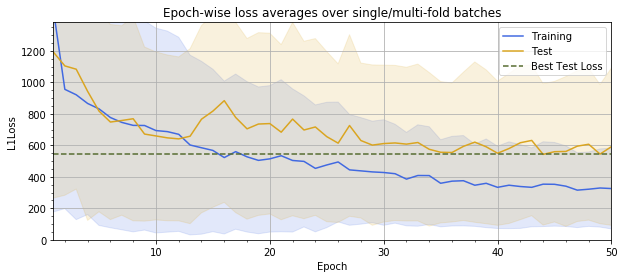

weight_decay=0.626726854016624
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_083234405_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_083234405_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 426.93


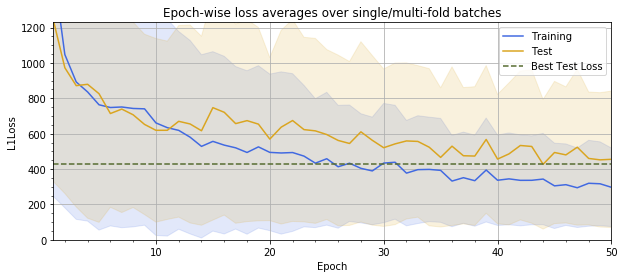

weight_decay=1.0567261398450762
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_085657639_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_085657639_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 470.66


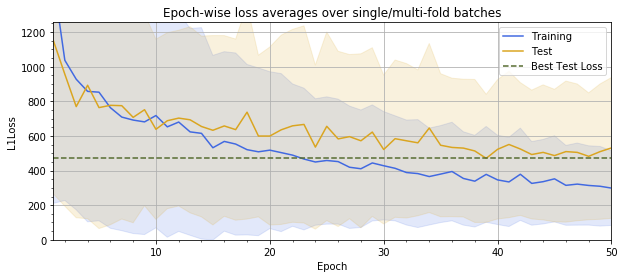

In [20]:
result_later = test_weight_decay(dp.DroneRGBLater, 
                                 np.abs(np.random.normal(loc=best_l2_later[0], 
                                                       scale=5*best_l2_later[0]*0.1, 
                                                       size=10)))

,weight_decay,best_loss,loss_mean,loss_std
0,0.370093,414.163643,615.143924,145.973619
1,0.626727,426.934663,614.584577,148.283240
2,0.711354,456.604016,637.232953,112.019636
3,0.777759,433.331445,642.125269,127.780165
4,1.056726,470.663764,628.000423,129.570572
5,1.392198,483.721943,667.846805,128.547288
6,1.483505,394.151552,621.407686,158.193088
7,1.589541,435.513534,641.507496,164.082599
8,1.595139,460.959588,655.743323,140.956544
9,1.617714,542.661628,690.709995,142.707248


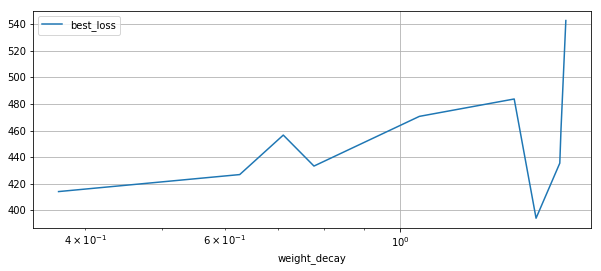

In [21]:
result_later.plot(x='weight_decay', y='best_loss', logx=True, grid=True)
result_later

In [22]:
best_row = l2_later.loc[l2_later['best_loss'].idxmin()]
if best_row['best_loss'] < best_l2_later[-1]:
    best_l2_later = (best_row['weight_decay'], best_row['best_loss'])
best_l2_later

(1.0, 434.80403039355747)

#### 3.2.3 Conclusions

In [17]:
best_l2_earlier = (9.748598965049288, 437.493056788589)
best_l2_earlier

(9.748598965049288, 437.493056788589)

In [18]:
best_l2_later = (1.0, 434.80403039355747)
best_l2_later

(1.0, 434.80403039355747)

In [28]:
print("RGB Earlier")
print("\tWeight Decay: {}".format(best_l2_earlier[0]))
print("\tBest Loss: {}".format(best_l2_earlier[1]))
print("RGB Later")
print("\tWeight Decay: {}".format(best_l2_later[0]))
print("\tBest Loss: {}".format(best_l2_later[1]))

RGB Earlier
	Weight Decay: 9.748598965049288
	Best Loss: 437.493056788589
RGB Later
	Weight Decay: 1.0
	Best Loss: 434.80403039355747


### 3.3 Early Stopping

Next we test out multiple setting of early stopping. With early stopping it is adives by Goodfellow et al. (2016) to perform sequential training after the training has been terminated early using the same termination setting. We will thus try out several values for the early stopping patience, which is a number determining how many non-improving epochs we allow the training to pass before terminating it. We try with patiences 10, 20, 30, 40 and 50.

In [29]:
def test_early_stopping(dataset, weight_decay, patiences):
    best_losses = pd.DataFrame(
        columns=['patience', 'best_loss', 'epochs', 'loss_mean', 'loss_std'])
    for patience in patiences:
        print("patience={}".format(
            patience))
        cnn = DroneYieldMeanCNN(
            source_bands=3,
            source_dim=128,
            cnn_layers=10,
            optimizer=optim.Adadelta,
            optimizer_parameters={'weight_decay': weight_decay})
        copy_model(cnn=cnn, is_later=isinstance(dataset, dp.DroneRGBLater), save=False)
        cnn.load_model()
        losses = []
        losses_dict = cnn.train(
            epochs=250,
            training_data=dataset(DB_128),
            k_cv_folds=3,
            early_stopping_patience=patience)
        losses = list(np.array(losses_dict['test_losses_mean_std'])[:, 0])
        losses_dict = cnn.train(
            epochs=250,
            training_data=dataset(DB_128),
            k_cv_folds=3,
            early_stopping_patience=patience)
        losses += list(np.array(losses_dict['test_losses_mean_std'])[:, 0])
        losses = np.array(losses).flatten()
        best_losses = best_losses.append(
            {'patience': patience,
             'epochs':losses.size,
             'best_loss': losses.min(),
             'loss_mean': losses.mean(),
             'loss_std': losses.std()},
            ignore_index=True)
    return best_losses.sort_values(by='patience').reset_index(drop=True)

#### 3.3.1 RGB Earlier Dataset

patience=10
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_092300679_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_092300679_Adadelta_3x128x128_10cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (6m 59s) 	Mean Loss:	Train=537.93 +-507.28	Test=888.66 +-669.08
[  26/ 250] (13m 51s) 	Mean Loss:	Train=435.73 +-370.90	Test=735.14 +-614.97
[  38/ 250] (20m 10s) 	Mean Loss:	Train=330.87 +-265.84	Test=603.24 +-531.32
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181117_092300679_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 563.23


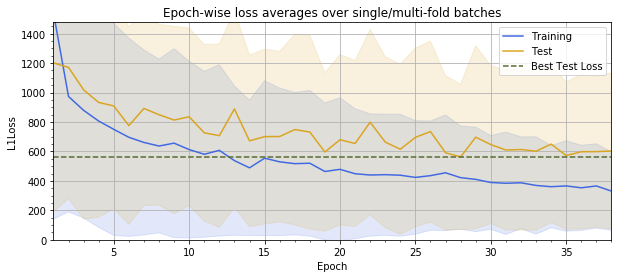

Starting the training with GPU:
[  13/ 250] (6m 60s) 	Mean Loss:	Train=298.26 +-224.92	Test=553.87 +-472.66
[  21/ 250] (11m 14s) 	Mean Loss:	Train=292.81 +-229.64	Test=527.08 +-463.54
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181117_092300679_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 489.56


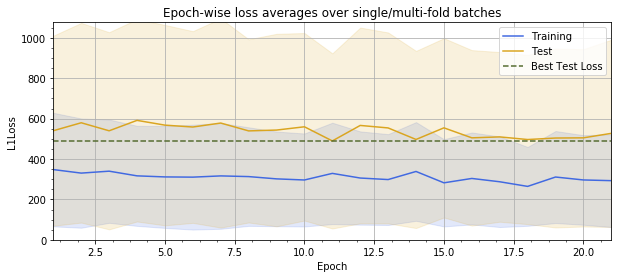

patience=20
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_095427124_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_095427124_Adadelta_3x128x128_10cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (6m 58s) 	Mean Loss:	Train=541.28 +-513.12	Test=666.31 +-596.78
[  26/ 250] (13m 57s) 	Mean Loss:	Train=405.64 +-368.58	Test=761.71 +-606.64
[  39/ 250] (20m 47s) 	Mean Loss:	Train=321.96 +-259.27	Test=501.79 +-447.86
[  52/ 250] (27m 37s) 	Mean Loss:	Train=287.35 +-226.20	Test=482.81 +-423.97
[  65/ 250] (34m 28s) 	Mean Loss:	Train=270.37 +-202.53	Test=499.34 +-398.62
[  71/ 250] (37m 37s) 	Mean Loss:	Train=257.84 +-201.53	Test=474.97 +-391.63
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181117_095427124_Adadel

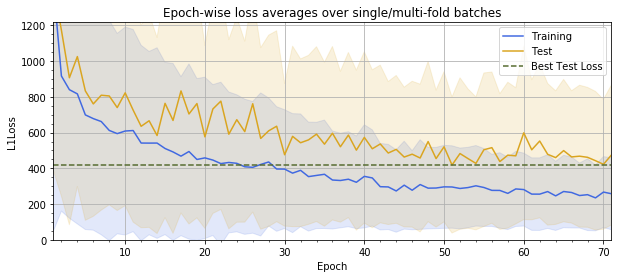

Starting the training with GPU:
[  13/ 250] (6m 58s) 	Mean Loss:	Train=220.65 +-172.52	Test=449.53 +-364.05
[  26/ 250] (13m 50s) 	Mean Loss:	Train=219.84 +-162.45	Test=437.64 +-361.86
[  39/ 250] (20m 41s) 	Mean Loss:	Train=181.95 +-152.20	Test=393.15 +-343.24
[  52/ 250] (27m 32s) 	Mean Loss:	Train=174.93 +-136.98	Test=367.15 +-342.04
[  65/ 250] (34m 23s) 	Mean Loss:	Train=170.56 +-130.27	Test=409.13 +-354.09
[  78/ 250] (41m 14s) 	Mean Loss:	Train=175.76 +-138.13	Test=399.67 +-338.51
[  91/ 250] (48m  5s) 	Mean Loss:	Train=180.37 +-125.06	Test=356.88 +-324.26
[  92/ 250] (48m 37s) 	Mean Loss:	Train=179.66 +-126.96	Test=383.12 +-362.85
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181117_095427124_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 351.94


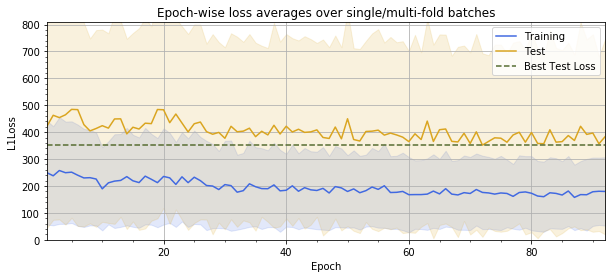

patience=30
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_112043706_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_112043706_Adadelta_3x128x128_10cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (6m 59s) 	Mean Loss:	Train=569.34 +-547.22	Test=700.32 +-597.88
[  26/ 250] (13m 50s) 	Mean Loss:	Train=445.09 +-431.56	Test=603.21 +-543.69
[  39/ 250] (20m 41s) 	Mean Loss:	Train=330.89 +-291.86	Test=574.01 +-484.38
[  52/ 250] (27m 33s) 	Mean Loss:	Train=277.55 +-227.61	Test=564.12 +-491.26
[  65/ 250] (34m 23s) 	Mean Loss:	Train=254.52 +-203.59	Test=541.00 +-463.62
[  78/ 250] (41m 20s) 	Mean Loss:	Train=218.77 +-185.08	Test=478.81 +-424.19
[  91/ 250] (48m 15s) 	Mean Loss:	Train=216.85 +-171.85	Test=449.41 +-401.33
[ 104/ 250] (55m  8s) 	Mean Loss:	Train=221.08 +-161.47	Test=446.28 +-42

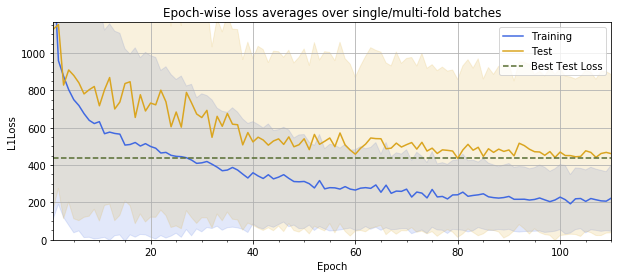

Starting the training with GPU:
[  13/ 250] (7m  1s) 	Mean Loss:	Train=202.99 +-154.58	Test=434.94 +-410.28
[  26/ 250] (13m 53s) 	Mean Loss:	Train=184.41 +-147.77	Test=442.93 +-423.64
[  39/ 250] (20m 44s) 	Mean Loss:	Train=187.99 +-144.08	Test=402.90 +-396.54
[  52/ 250] (27m 37s) 	Mean Loss:	Train=188.51 +-141.68	Test=413.80 +-397.39
[  65/ 250] (34m 28s) 	Mean Loss:	Train=175.74 +-134.50	Test=454.08 +-414.12
[  78/ 250] (41m 19s) 	Mean Loss:	Train=162.32 +-124.70	Test=416.85 +-417.78
[  91/ 250] (48m 10s) 	Mean Loss:	Train=158.72 +-123.91	Test=455.90 +-426.22
[ 104/ 250] (55m  1s) 	Mean Loss:	Train=165.40 +-126.52	Test=425.45 +-403.35
[ 117/ 250] (61m 52s) 	Mean Loss:	Train=153.99 +-113.90	Test=403.19 +-390.88
[ 130/ 250] (68m 44s) 	Mean Loss:	Train=149.67 +-114.01	Test=416.72 +-422.06
[ 141/ 250] (74m 32s) 	Mean Loss:	Train=156.72 +-116.20	Test=403.70 +-408.00
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularizatio

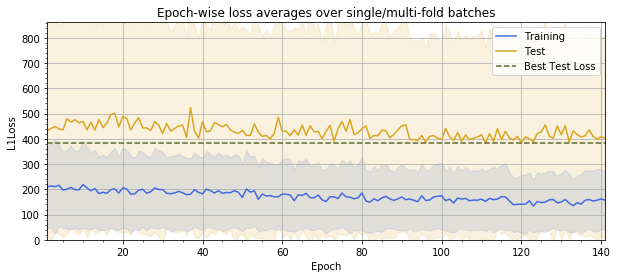

patience=40
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_133337855_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_133337855_Adadelta_3x128x128_10cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (6m 59s) 	Mean Loss:	Train=518.46 +-483.43	Test=666.82 +-523.69
[  26/ 250] (13m 51s) 	Mean Loss:	Train=405.05 +-311.21	Test=686.93 +-537.97
[  39/ 250] (20m 43s) 	Mean Loss:	Train=325.71 +-249.86	Test=593.93 +-473.42
[  52/ 250] (27m 34s) 	Mean Loss:	Train=273.19 +-202.79	Test=496.99 +-389.10
[  65/ 250] (34m 30s) 	Mean Loss:	Train=275.18 +-208.68	Test=544.94 +-398.19
[  78/ 250] (41m 28s) 	Mean Loss:	Train=224.32 +-170.87	Test=397.74 +-335.73
[  91/ 250] (48m 18s) 	Mean Loss:	Train=201.66 +-159.81	Test=379.38 +-334.92
[ 104/ 250] (55m 10s) 	Mean Loss:	Train=207.88 +-153.70	Test=412.79 +-36

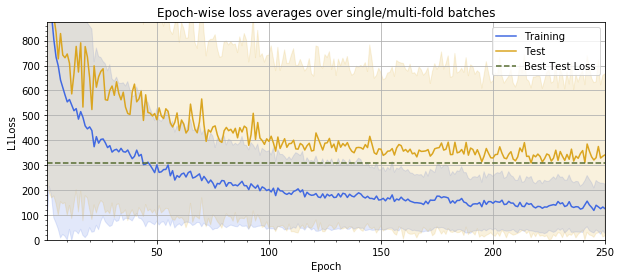

Starting the training with GPU:
[  13/ 250] (6m 60s) 	Mean Loss:	Train=133.21 +-98.94	Test=326.80 +-327.78
[  26/ 250] (13m 52s) 	Mean Loss:	Train=139.12 +-99.05	Test=333.70 +-318.05
[  39/ 250] (20m 54s) 	Mean Loss:	Train=111.73 +-82.80	Test=308.28 +-300.62
[  52/ 250] (27m 45s) 	Mean Loss:	Train=121.92 +-89.25	Test=315.90 +-286.35
[  65/ 250] (34m 38s) 	Mean Loss:	Train=128.58 +-88.27	Test=332.75 +-334.33
[  73/ 250] (38m 51s) 	Mean Loss:	Train=127.80 +-90.29	Test=325.46 +-297.68
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181117_133337855_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 298.77


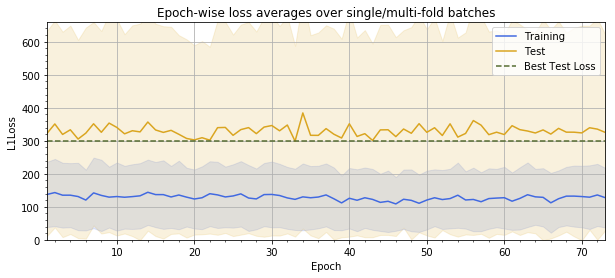

patience=50
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_162436886_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_162436886_Adadelta_3x128x128_10cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (6m 60s) 	Mean Loss:	Train=570.58 +-551.75	Test=583.68 +-518.83
[  26/ 250] (13m 52s) 	Mean Loss:	Train=397.65 +-378.81	Test=683.05 +-572.87
[  39/ 250] (20m 44s) 	Mean Loss:	Train=340.97 +-275.13	Test=487.70 +-452.39
[  52/ 250] (27m 35s) 	Mean Loss:	Train=289.54 +-224.46	Test=504.18 +-456.49
[  65/ 250] (34m 27s) 	Mean Loss:	Train=272.65 +-197.85	Test=448.96 +-431.08
[  78/ 250] (41m 19s) 	Mean Loss:	Train=236.66 +-182.80	Test=422.64 +-400.87
[  91/ 250] (48m 11s) 	Mean Loss:	Train=224.51 +-165.74	Test=467.11 +-382.13
[ 104/ 250] (55m  2s) 	Mean Loss:	Train=213.89 +-152.50	Test=442.93 +-40

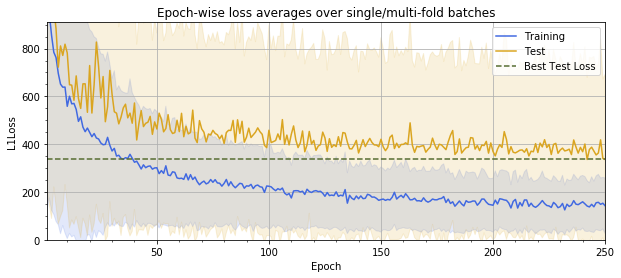

Starting the training with GPU:
[  13/ 250] (6m 58s) 	Mean Loss:	Train=140.67 +-105.79	Test=359.19 +-359.07
[  26/ 250] (13m 49s) 	Mean Loss:	Train=137.29 +-97.87	Test=358.10 +-352.43
[  39/ 250] (20m 40s) 	Mean Loss:	Train=123.96 +-95.70	Test=364.14 +-367.22
[  42/ 250] (22m 14s) 	Mean Loss:	Train=126.29 +-95.58	Test=359.30 +-356.48
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181117_162436886_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 336.09


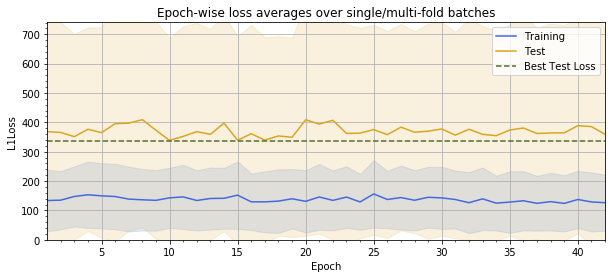

In [30]:
patience_earlier = test_early_stopping(
    dataset=dp.DroneRGBEarlier, 
    weight_decay=best_l2_earlier[0], 
    patiences=[10,20,30,40,50])

#### 3.3.2 RGB Later Dataset

patience=10
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_185852504_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_185852504_Adadelta_3x128x128_10cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (6m 27s) 	Mean Loss:	Train=540.58 +-504.70	Test=631.89 +-520.81
[  21/ 250] (10m 21s) 	Mean Loss:	Train=466.52 +-430.99	Test=600.44 +-480.22
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181117_185852504_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 556.76


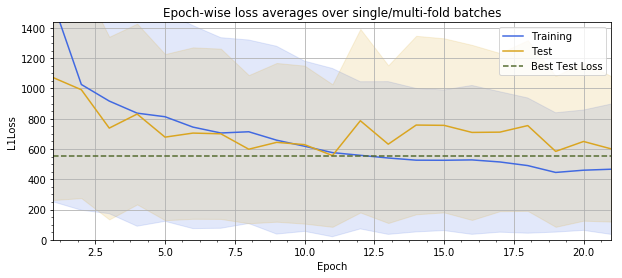

Starting the training with GPU:
[  13/ 250] (6m 25s) 	Mean Loss:	Train=367.45 +-290.67	Test=511.55 +-438.51
[  26/ 250] (12m 44s) 	Mean Loss:	Train=297.00 +-225.20	Test=491.92 +-399.92
[  39/ 250] (19m  3s) 	Mean Loss:	Train=242.80 +-197.72	Test=409.36 +-374.28
[  52/ 250] (25m 21s) 	Mean Loss:	Train=263.15 +-201.49	Test=454.45 +-405.21
[  65/ 250] (31m 40s) 	Mean Loss:	Train=210.78 +-158.54	Test=417.87 +-356.93
[  71/ 250] (34m 34s) 	Mean Loss:	Train=213.94 +-162.12	Test=399.55 +-343.37
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181117_185852504_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 373.43


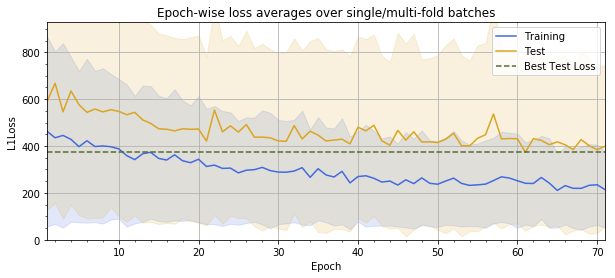

patience=20
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_194350186_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_194350186_Adadelta_3x128x128_10cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (6m 26s) 	Mean Loss:	Train=600.27 +-586.39	Test=579.88 +-498.21
[  26/ 250] (12m 44s) 	Mean Loss:	Train=418.00 +-320.09	Test=452.61 +-393.00
[  39/ 250] (19m  2s) 	Mean Loss:	Train=342.07 +-255.84	Test=451.58 +-382.04
[  52/ 250] (25m 21s) 	Mean Loss:	Train=281.30 +-217.22	Test=526.52 +-417.16
[  65/ 250] (31m 47s) 	Mean Loss:	Train=252.75 +-190.30	Test=422.88 +-363.03
[  78/ 250] (38m  4s) 	Mean Loss:	Train=226.59 +-169.13	Test=354.34 +-334.58
[  91/ 250] (44m 22s) 	Mean Loss:	Train=197.62 +-151.35	Test=405.04 +-331.67
[  98/ 250] (47m 46s) 	Mean Loss:	Train=214.32 +-160.06	Test=391.38 +-33

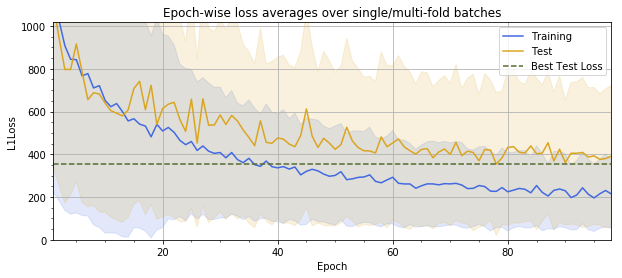

Starting the training with GPU:
[  13/ 250] (6m 25s) 	Mean Loss:	Train=238.87 +-166.98	Test=379.04 +-328.80
[  26/ 250] (12m 43s) 	Mean Loss:	Train=192.33 +-147.24	Test=361.86 +-298.26
[  39/ 250] (19m  1s) 	Mean Loss:	Train=195.82 +-143.11	Test=369.05 +-316.25
[  51/ 250] (24m 50s) 	Mean Loss:	Train=156.13 +-129.38	Test=395.39 +-320.50
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181117_194350186_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 341.60


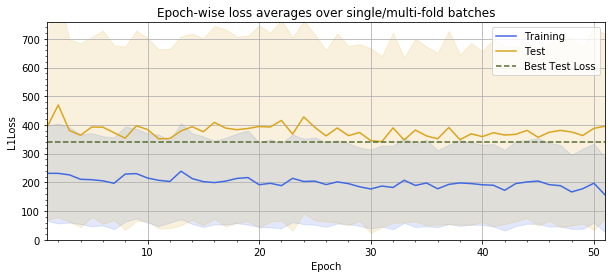

patience=30
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_205628442_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_205628442_Adadelta_3x128x128_10cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (6m 26s) 	Mean Loss:	Train=588.42 +-545.40	Test=712.68 +-536.30
[  26/ 250] (12m 47s) 	Mean Loss:	Train=460.73 +-367.19	Test=554.43 +-454.02
[  39/ 250] (19m  7s) 	Mean Loss:	Train=368.33 +-287.34	Test=427.41 +-341.60
[  52/ 250] (25m 26s) 	Mean Loss:	Train=302.74 +-227.40	Test=450.19 +-369.32
[  65/ 250] (31m 45s) 	Mean Loss:	Train=262.09 +-197.92	Test=447.64 +-379.73
[  78/ 250] (38m  5s) 	Mean Loss:	Train=234.31 +-181.65	Test=407.53 +-327.70
[  91/ 250] (44m 24s) 	Mean Loss:	Train=221.97 +-162.04	Test=427.07 +-363.48
[ 104/ 250] (50m 44s) 	Mean Loss:	Train=228.30 +-163.33	Test=389.53 +-32

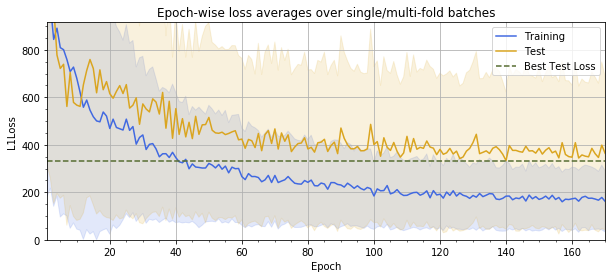

Starting the training with GPU:
[  13/ 250] (6m 26s) 	Mean Loss:	Train=183.23 +-131.94	Test=419.55 +-353.67
[  26/ 250] (12m 45s) 	Mean Loss:	Train=158.16 +-115.14	Test=368.69 +-340.68
[  31/ 250] (15m 12s) 	Mean Loss:	Train=163.96 +-125.68	Test=336.80 +-307.82
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181117_205628442_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 333.71


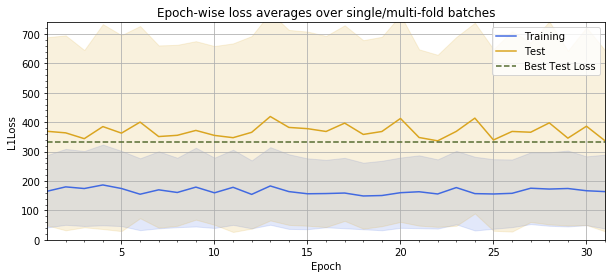

patience=40
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181117_223438710_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181117_223438710_Adadelta_3x128x128_10cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (6m 28s) 	Mean Loss:	Train=571.99 +-517.45	Test=750.62 +-589.57
[  26/ 250] (12m 48s) 	Mean Loss:	Train=412.16 +-325.89	Test=510.60 +-407.25
[  39/ 250] (19m  9s) 	Mean Loss:	Train=337.17 +-272.37	Test=579.94 +-439.70
[  52/ 250] (25m 30s) 	Mean Loss:	Train=323.68 +-246.42	Test=431.64 +-335.90
[  65/ 250] (31m 51s) 	Mean Loss:	Train=263.23 +-197.13	Test=370.25 +-307.16
[  78/ 250] (38m 11s) 	Mean Loss:	Train=227.53 +-177.93	Test=406.31 +-323.68
[  91/ 250] (44m 32s) 	Mean Loss:	Train=226.67 +-158.75	Test=389.97 +-313.23
[ 104/ 250] (50m 51s) 	Mean Loss:	Train=182.40 +-138.26	Test=335.16 +-27

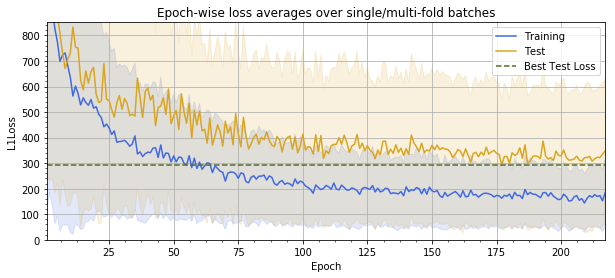

Starting the training with GPU:
[  13/ 250] (6m 23s) 	Mean Loss:	Train=149.36 +-112.76	Test=310.34 +-273.15
[  26/ 250] (12m 42s) 	Mean Loss:	Train=160.60 +-118.98	Test=327.54 +-278.40
[  39/ 250] (18m 59s) 	Mean Loss:	Train=142.54 +-109.22	Test=321.16 +-267.17
[  52/ 250] (25m 15s) 	Mean Loss:	Train=161.51 +-109.31	Test=333.99 +-278.02
[  65/ 250] (31m 31s) 	Mean Loss:	Train=147.13 +-109.21	Test=303.30 +-271.73
[  73/ 250] (35m 23s) 	Mean Loss:	Train=151.66 +-105.33	Test=311.12 +-280.05
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181117_223438710_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 277.73


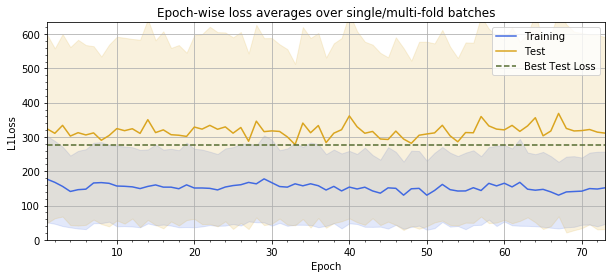

patience=50
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181118_005558292_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181118_005558292_Adadelta_3x128x128_10cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (6m 26s) 	Mean Loss:	Train=527.43 +-490.22	Test=625.01 +-505.77
[  26/ 250] (12m 44s) 	Mean Loss:	Train=401.59 +-303.00	Test=579.23 +-453.73
[  39/ 250] (19m  4s) 	Mean Loss:	Train=346.88 +-249.70	Test=645.37 +-478.87
[  52/ 250] (25m 22s) 	Mean Loss:	Train=279.75 +-205.48	Test=518.25 +-392.83
[  65/ 250] (31m 40s) 	Mean Loss:	Train=282.43 +-206.25	Test=492.15 +-382.37
[  78/ 250] (37m 58s) 	Mean Loss:	Train=239.15 +-169.75	Test=502.81 +-403.15
[  91/ 250] (44m 16s) 	Mean Loss:	Train=259.84 +-191.63	Test=448.95 +-369.30
[ 104/ 250] (50m 34s) 	Mean Loss:	Train=212.14 +-156.64	Test=417.80 +-33

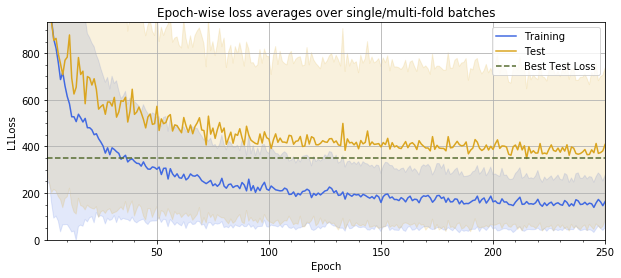

Starting the training with GPU:
[  13/ 250] (6m 24s) 	Mean Loss:	Train=144.52 +-105.63	Test=378.08 +-340.07
[  15/ 250] (7m 21s) 	Mean Loss:	Train=147.85 +-113.56	Test=368.36 +-319.82
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181118_005558292_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 348.62


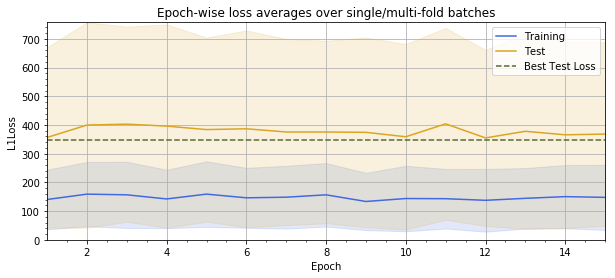

In [31]:
patience_later = test_early_stopping(
    dataset=dp.DroneRGBLater, 
    weight_decay=best_l2_later[0], 
    patiences=[10,20,30,40,50])

#### 3.3.3 Conclusions

The results of early stopping are given for both datasets in the following tables:

In [32]:
print("RGB Earlier")
patience_earlier

RGB Earlier


,patience,best_loss,epochs,loss_mean,loss_std
0,10.0,489.559356,59.0,667.215856,157.043667
1,20.0,351.942821,163.0,493.136071,157.028554
2,30.0,383.383293,251.0,496.997892,124.167511
3,40.0,298.770849,323.0,412.381927,129.824586
4,50.0,336.089172,292.0,442.666960,115.722293


In [33]:
print("RGB Later")
patience_later

RGB Later


,patience,best_loss,epochs,loss_mean,loss_std
0,10.0,373.425017,92.0,521.980717,133.202829
1,20.0,341.604794,149.0,464.136616,128.317362
2,30.0,333.706347,201.0,444.199593,125.929715
3,40.0,277.732013,290.0,398.290969,125.181891
4,50.0,348.622154,265.0,461.095044,117.718824


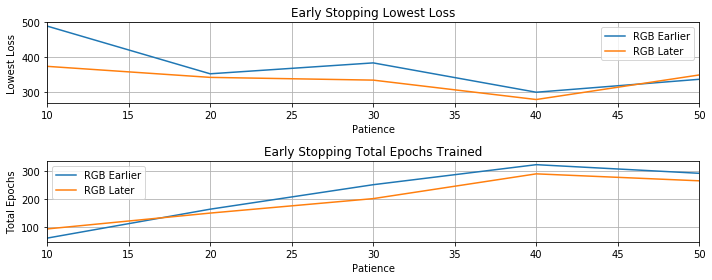

In [34]:
import matplotlib.pyplot as plt
plt.subplot(211)
plt.plot(patience_earlier['patience'],patience_earlier['best_loss'],label='RGB Earlier')
plt.plot(patience_later['patience'],patience_later['best_loss'],label='RGB Later')
plt.title("Early Stopping Lowest Loss")
plt.xlabel("Patience")
plt.ylabel("Lowest Loss")
plt.xlim(10,50)
plt.grid()
plt.legend()
plt.subplot(212)
plt.plot(patience_earlier['patience'],patience_earlier['epochs'],label='RGB Earlier')
plt.plot(patience_later['patience'],patience_later['epochs'],label='RGB Later')
plt.title("Early Stopping Total Epochs Trained")
plt.xlabel("Patience")
plt.ylabel("Total Epochs")
plt.xlim(10,50)
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()

The increase in in patience seems have the average effect of linearly increasing the training time. However at the same time the losses behave in convex way, where the minimum is somewhere between 150 and 300 total epochs trained. 

### 3.4 Conclusions for Regularization

We will use weight decays ``9.914449`` and ``1.0`` for the earlier and later datasets respectively and patience of ``30`` for the earlier and ``40`` for the later dataset.

## 4. Optimizer Tuning

The last step is to tune the hyperparameters of the optimizer. Adadelta has effectively two parameters that can be tuned. These are the initial learning rate ``lr`` that will be dynamically changed by the optimizer and the coefficient for running average of squared gradients ``rho`` used to determinate the changing of the learning rate. 

In the original Adadelta paper they performed hyperparameter tuning with just 6 epochs on the digit classification task. We will be a bit more generous to our network and use 25 epochs to determine the optimal settings. This means that we wont be utilizing early stopping here, but we will incorporate weight decay.

We will first conduct coarse grid search and random searh after that if necessary. We will use same initialized models as in the regularization testing phase.

In [21]:
import os
import shutil
import numpy as np
import pandas as pd
import seaborn as sns

from torch import optim
from field_analysis.model.dataset import dataperiod as dp
from field_analysis.model.nets.cnn import DroneYieldMeanCNN
import field_analysis.settings.model as model_settings

%matplotlib inline

DB_128 = 'field_analysis_40m_128px.db'
DATASET_NAMES = ['earlier', 'later']
optimized_models_dir = os.path.join(model_settings.MODELS_DIR,'optimization')
os.makedirs(optimized_models_dir,exist_ok=True)
# ALSO REMEMBER TO COPY INITIAL MODELS FROM REGULARIZATION TO THE OPTIMIZATION FOLDER

def copy_model(cnn, is_later, save):
    "Copy the dataset-wise persisted model either for later use (`save=True`) or current use (`save=False`)."
    cnn.model_path = os.path.join(optimized_models_dir,cnn.model_filename)
    model_folder, _ = os.path.split(cnn.model_path)
    model_name, suffix = cnn.model_filename.split('.')
    model_name = "initial_model_{}.{}".format(
        DATASET_NAMES[is_later], suffix)
    if save:
        cnn.save_model()
        from_path = cnn.model_path
        to_path = os.path.join(model_folder, model_name)
    else:
        from_path = os.path.join(model_folder, model_name)
        to_path = cnn.model_path
    shutil.copyfile(from_path, to_path)
    print("Persisted model copied \n\tFrom: {} \n\tTo: {}".format(from_path, to_path))

def test_optimizer(dataset, weight_decay, lrs, rhos):
    best_losses = pd.DataFrame(
        columns=['lr', 'rho', 'best_loss', 'loss_mean', 'loss_std'])
    for lr in lrs:
        for rho in rhos:
            print("lr={}, rho={}".format(lr, rho))
            cnn = DroneYieldMeanCNN(
                source_bands=3,
                source_dim=128,
                cnn_layers=10,
                optimizer=optim.Adadelta,
                optimizer_parameters={
                    'weight_decay': weight_decay,
                    'lr': lr,
                    'rho': rho})
            copy_model(
                cnn=cnn,
                is_later=isinstance(dataset, dp.DroneRGBLater),
                save=False)
            cnn.load_model()
            losses_dict = cnn.train(
                epochs=50,
                training_data=dataset(DB_128),
                k_cv_folds=3,
                suppress_output=True)
            losses = np.array(losses_dict['test_losses_mean_std'])[:, 0]
            best_losses = best_losses.append(
                {'lr': lr,
                 'rho': rho,
                 'best_loss': losses.min(),
                 'loss_mean': losses.mean(),
                 'loss_std': losses.std()},
                ignore_index=True)
    return best_losses.sort_values(by='best_loss').reset_index(drop=True)

# (lr, rho, loss)
best_optimizer_earlier = (None, None, None)
best_optmizer_later = (None, None, None)

### 4.1 Grid Search

For the initial values we will use learning rates of ``1e-4``,``1e-3``,``1e-2``,``1e-1`` and ``1e0``. For the running average coefficient we will use ``0.0``,``0.3``,``0.6`` and ``0.9``. This totals to 20 trainings per dataset.

#### 4.1.1 RGB Earlier Dataset

lr=0.0001, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181119_210055185_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181119_210055185_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 451.31


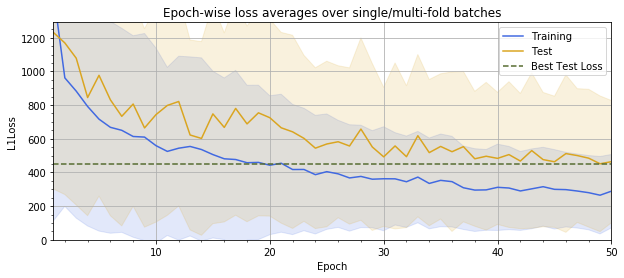

lr=0.0001, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181119_212627346_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181119_212627346_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 467.71


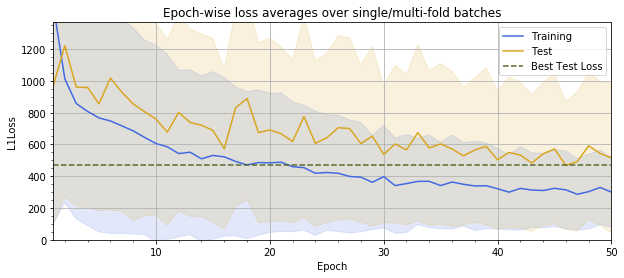

lr=0.0001, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181119_215212893_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181119_215212893_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 420.29


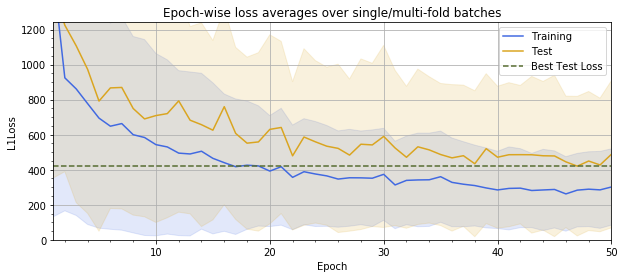

lr=0.0001, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181119_221805732_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181119_221805732_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 528.39


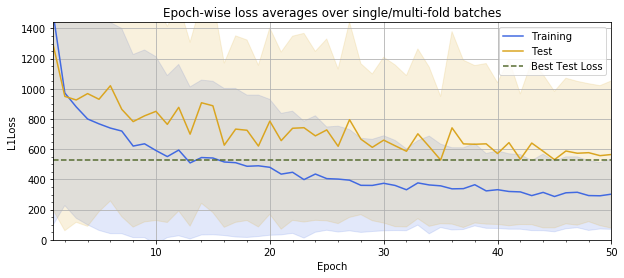

lr=0.001, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181119_224358228_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181119_224358228_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 514.40


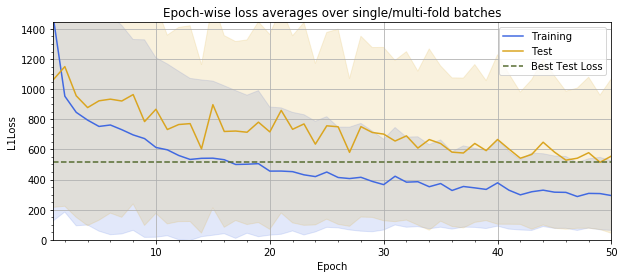

lr=0.001, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181119_231002332_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181119_231002332_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 499.09


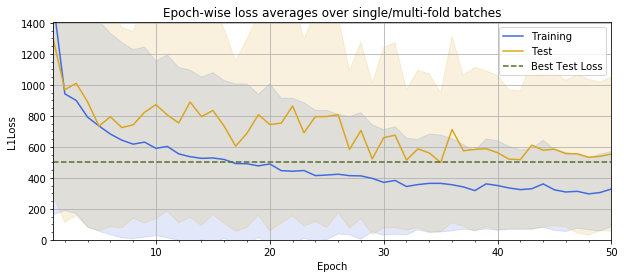

lr=0.001, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181119_233559977_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181119_233559977_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 381.84


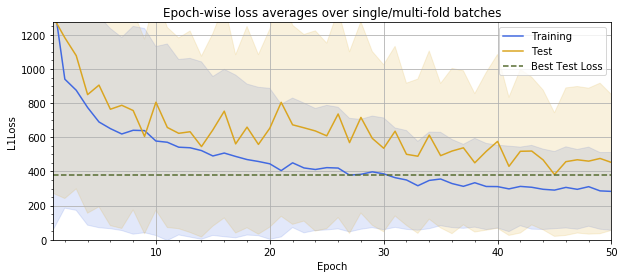

lr=0.001, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_000157893_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_000157893_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 473.33


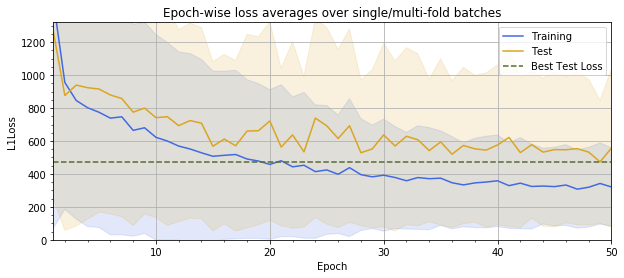

lr=0.01, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_002806285_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_002806285_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 526.66


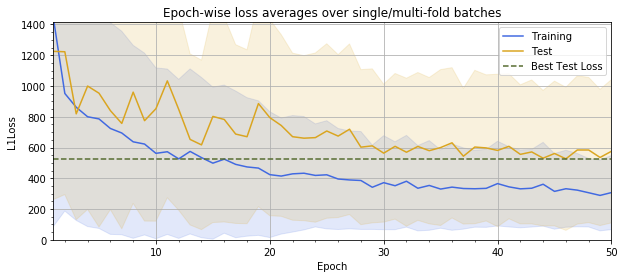

lr=0.01, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_005404131_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_005404131_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 525.78


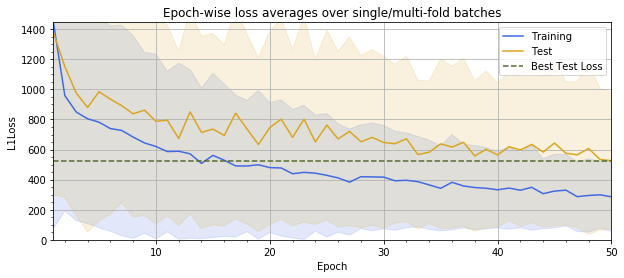

lr=0.01, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_012014340_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_012014340_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 462.32


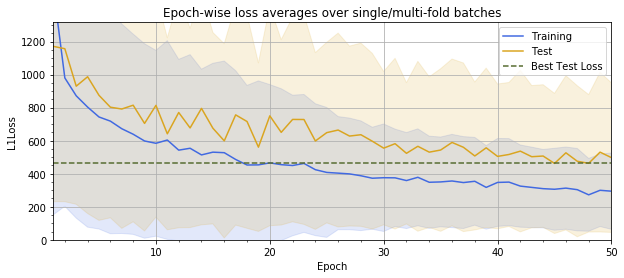

lr=0.01, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_014547248_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_014547248_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 517.33


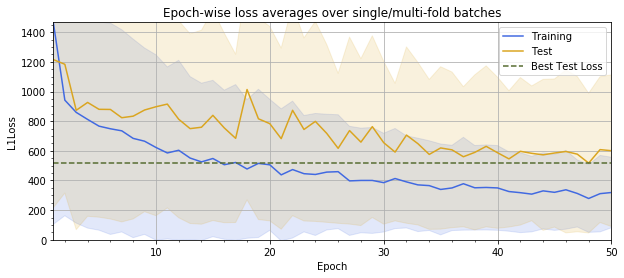

lr=0.1, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_021121113_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_021121113_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 508.72


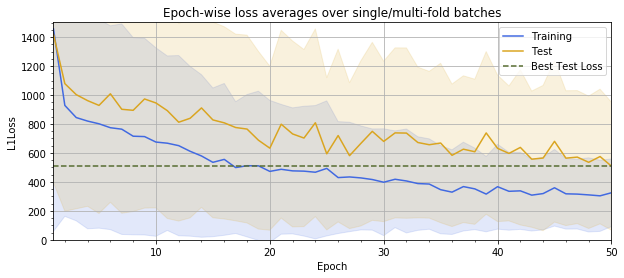

lr=0.1, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_023651842_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_023651842_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 471.56


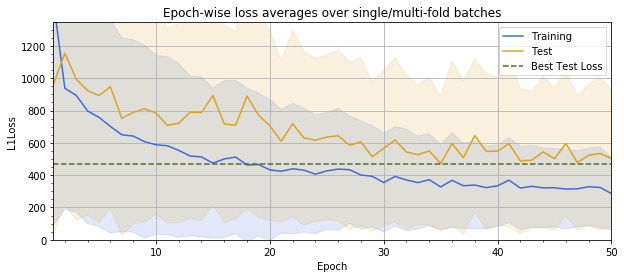

lr=0.1, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_030218360_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_030218360_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 473.43


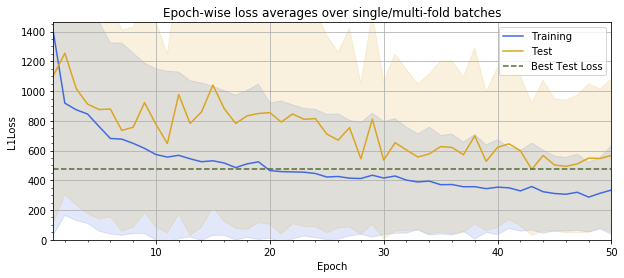

lr=0.1, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_032741138_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_032741138_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 559.84


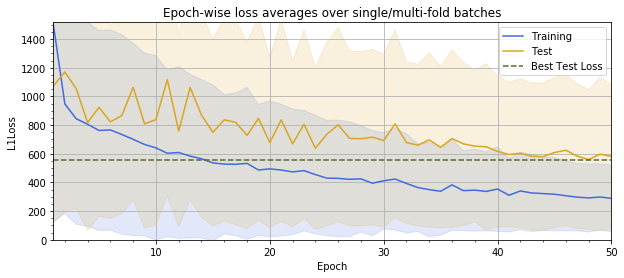

lr=1.0, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_035302781_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_035302781_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 562.78


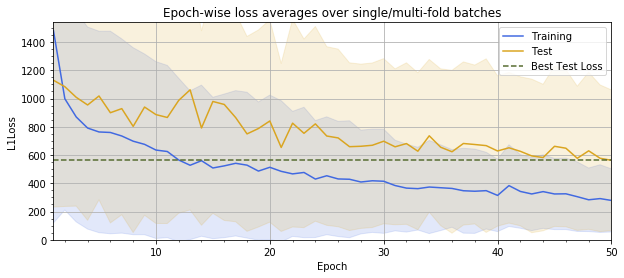

lr=1.0, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_041835587_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_041835587_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 488.96


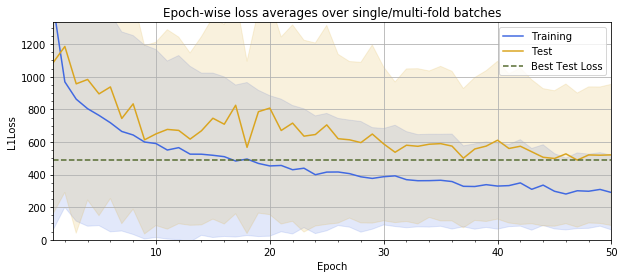

lr=1.0, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_044356939_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_044356939_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 447.79


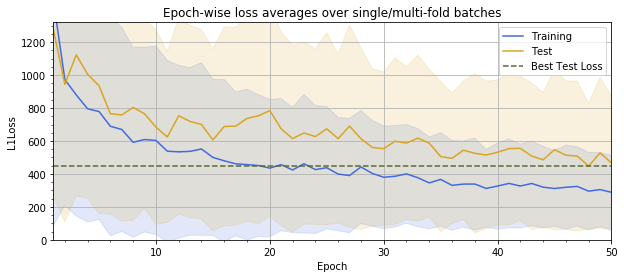

lr=1.0, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_050923269_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_050923269_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 513.65


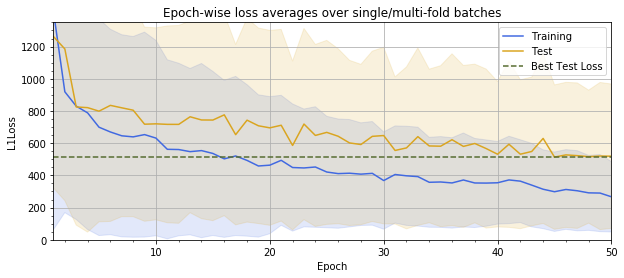

In [4]:
optimizer_earlier = test_optimizer(dp.DroneRGBEarlier, 
                                   best_l2_earlier[0], 
                                   [1e-4,1e-3,1e-2,1e-1,1e0], 
                                   [0,0.3,0.6,0.9])

rho,0.0,0.3,0.6,0.9
lr,,,,
0.0001,451.310649,467.713428,420.287404,528.392169
0.0010,514.395317,499.086313,381.841347,473.327527
0.0100,526.655816,525.775942,462.321376,517.329485
0.1000,508.720574,471.558966,473.425034,559.838420
1.0000,562.783473,488.964478,447.785706,513.645023


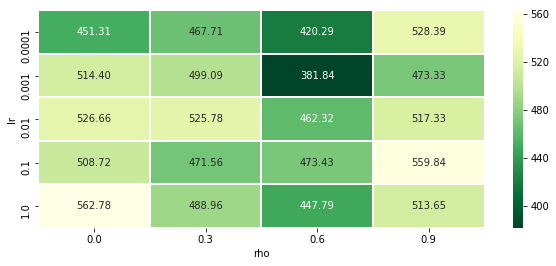

In [5]:
pivot = optimizer_earlier.pivot_table(values='best_loss',index='lr',columns='rho')
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlGn_r', linewidth=1, linecolor='white')
pivot

In [6]:
best_row = optimizer_earlier.loc[optimizer_earlier['best_loss'].idxmin()]
best_optimizer_earlier = (best_row['lr'], best_row['rho'], best_row['best_loss'])
best_optimizer_earlier

(0.001, 0.6, 381.8413472830829)

#### 4.1.2 RGB Later Dataset

lr=0.0001, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_053445012_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_053445012_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 464.45


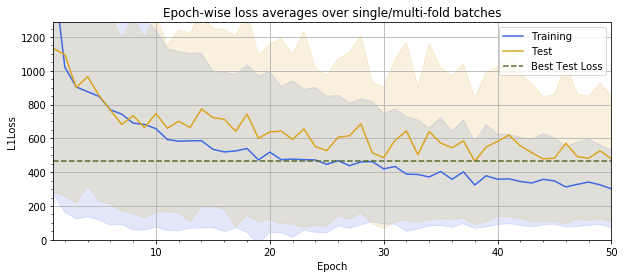

lr=0.0001, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_055806506_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_055806506_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 504.43


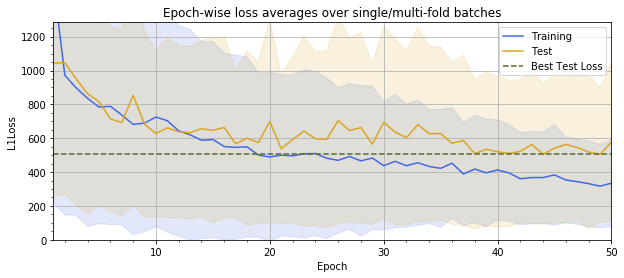

lr=0.0001, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_062133382_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_062133382_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 432.02


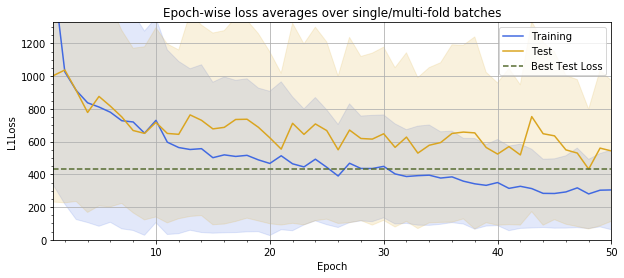

lr=0.0001, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_064501293_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_064501293_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 447.56


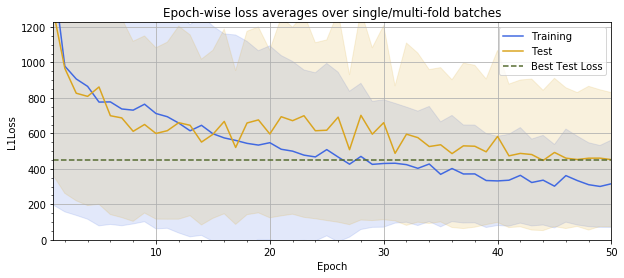

lr=0.001, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_070824675_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_070824675_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 455.85


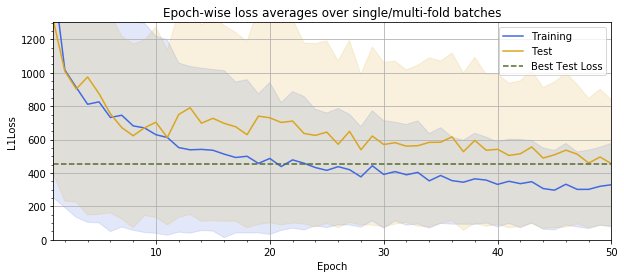

lr=0.001, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_073148294_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_073148294_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 425.53


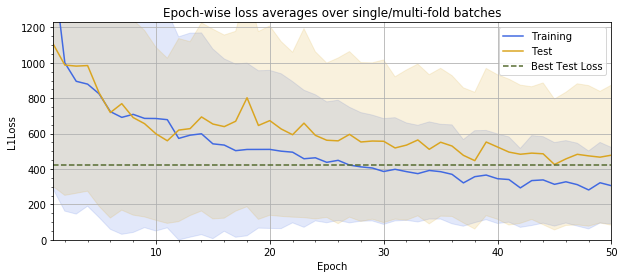

lr=0.001, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_075513584_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_075513584_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 493.17


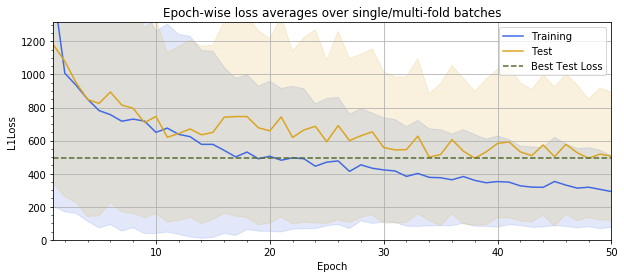

lr=0.001, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_081851980_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_081851980_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 407.71


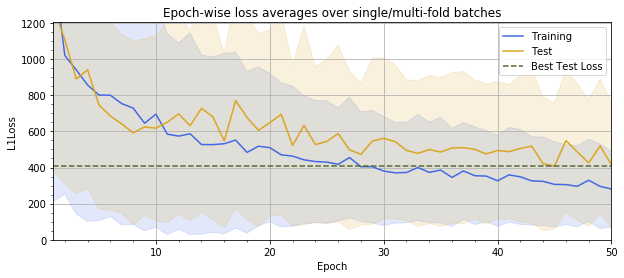

lr=0.01, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_084224129_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_084224129_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 445.52


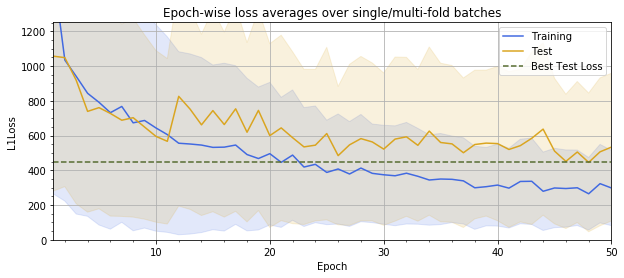

lr=0.01, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_090554327_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_090554327_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 476.14


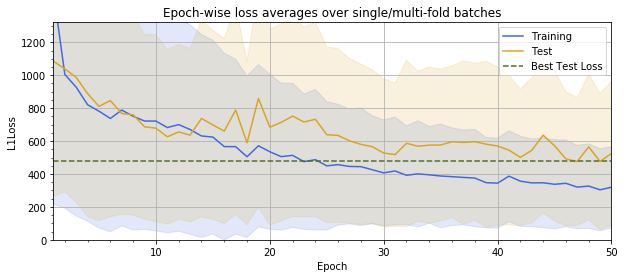

lr=0.01, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_092925093_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_092925093_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 451.20


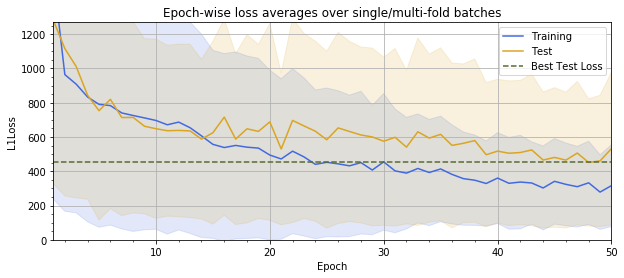

lr=0.01, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_095253833_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_095253833_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 509.67


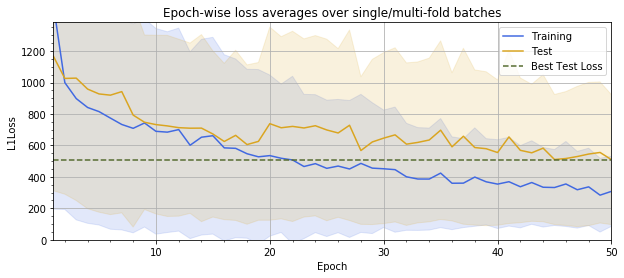

lr=0.1, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_101637766_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_101637766_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 429.12


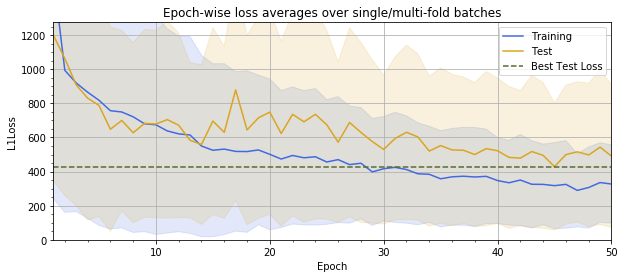

lr=0.1, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_104012041_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_104012041_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 435.79


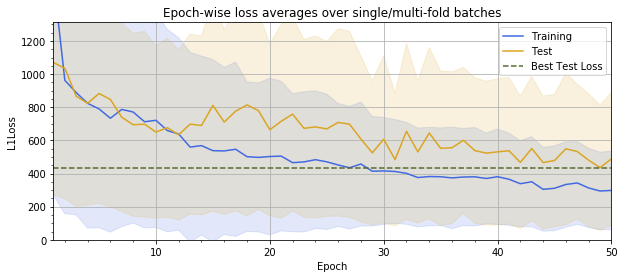

lr=0.1, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_110350180_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_110350180_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 484.92


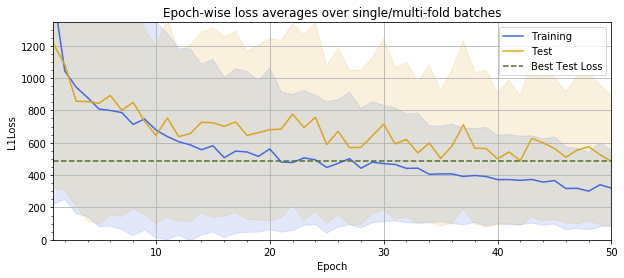

lr=0.1, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_112720247_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_112720247_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 439.00


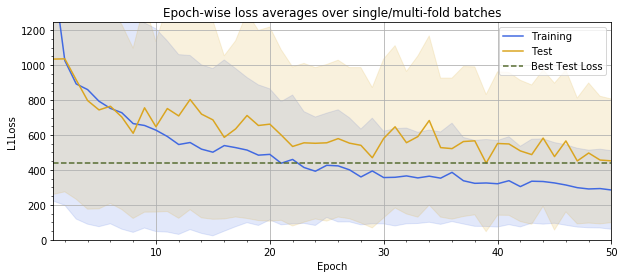

lr=1.0, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_115050929_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_115050929_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 471.81


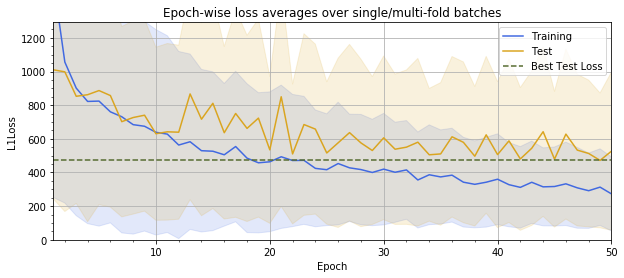

lr=1.0, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_121426706_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_121426706_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 437.52


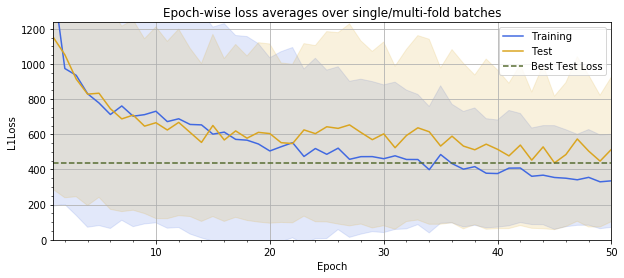

lr=1.0, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_123758123_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_123758123_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 421.79


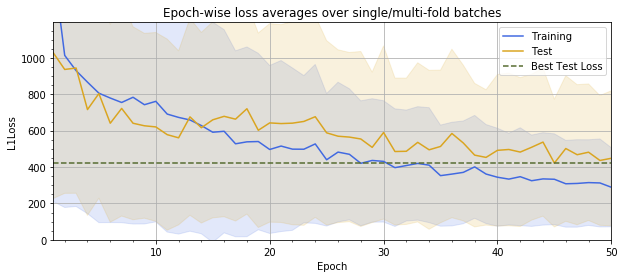

lr=1.0, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_130129526_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_130129526_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 441.07


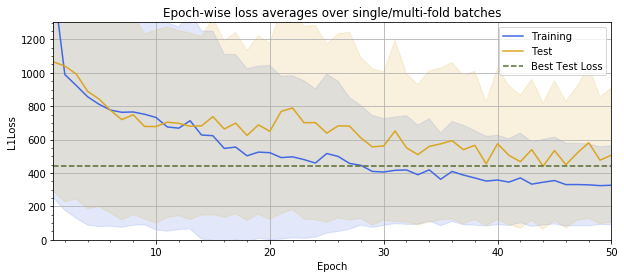

In [7]:
optimizer_later = test_optimizer(dp.DroneRGBLater, 
                                   best_l2_later[0], 
                                   [1e-4,1e-3,1e-2,1e-1,1e0], 
                                   [0,0.3,0.6,0.9])

rho,0.0,0.3,0.6,0.9
lr,,,,
0.0001,464.447796,504.425771,432.020263,447.558978
0.0010,455.850280,425.527146,493.168235,407.706709
0.0100,445.522235,476.137238,451.201221,509.665986
0.1000,429.118011,435.789419,484.921405,438.995331
1.0000,471.808526,437.523586,421.785104,441.072465


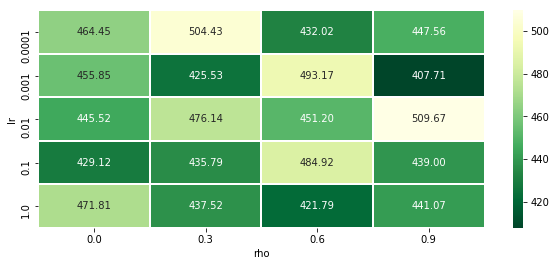

In [8]:
pivot = optimizer_later.pivot_table(values='best_loss',index='lr',columns='rho')
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlGn_r', linewidth=1, linecolor='white')
pivot

In [9]:
best_row = optimizer_later.loc[optimizer_later['best_loss'].idxmin()]
best_optimizer_later = (best_row['lr'], best_row['rho'], best_row['best_loss'])
best_optimizer_later

(0.001, 0.9, 407.7067093626888)

#### 4.1.3 Conclusions

From the results it seems that the optimal learning rate is in the ballpark of ``0.01`` for the earlier and ``0.1`` for the later dataset. The coefficient for the squared gradients is however around ``0.3`` for both datasets.

### 4.2 Random Search

Next up the random search with values in the ballpark of the ones concluded in the grid search.

#### 4.2.1 RGB Earlier Dataset

lr=0.000794307931424446, rho=0.498075758035043
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_132501656_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_132501656_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 451.33


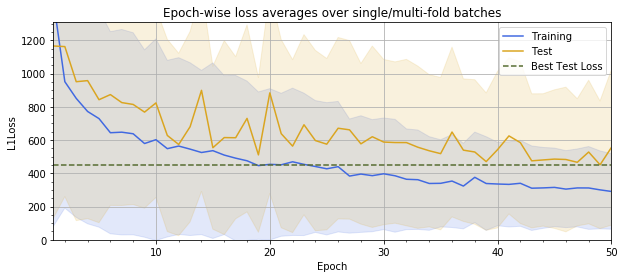

lr=0.000794307931424446, rho=0.3700883871360454
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_135029965_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_135029965_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 412.64


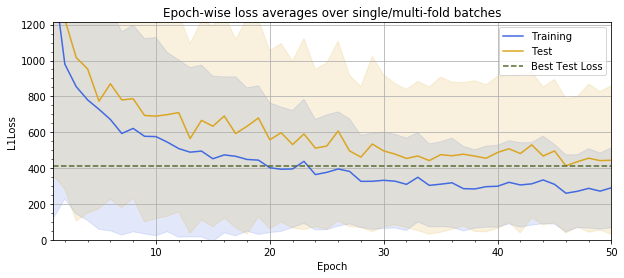

lr=0.000794307931424446, rho=0.3695273230938274
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_141602159_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_141602159_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 506.44


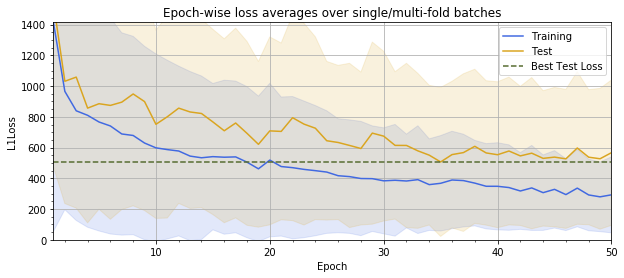

lr=0.000794307931424446, rho=0.6677426122782043
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_144134773_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_144134773_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 491.30


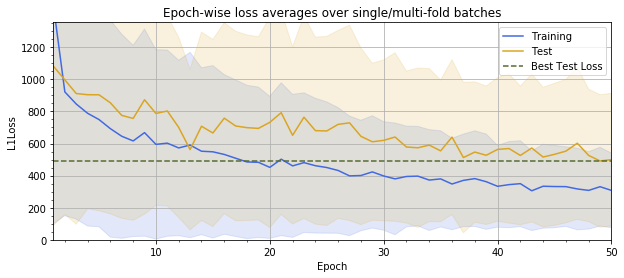

lr=0.0007589618115735587, rho=0.498075758035043
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_150704150_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_150704150_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 447.85


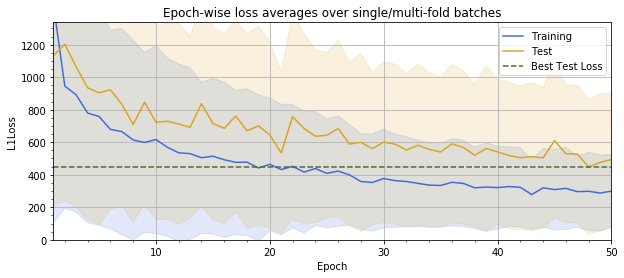

lr=0.0007589618115735587, rho=0.3700883871360454
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_153235988_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_153235988_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 542.10


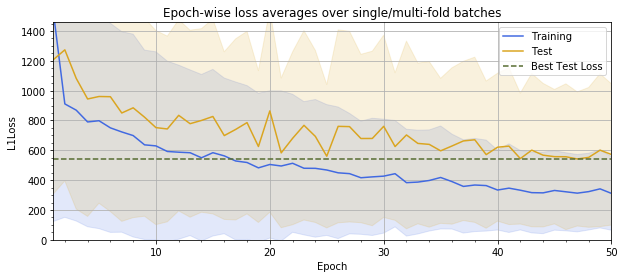

lr=0.0007589618115735587, rho=0.3695273230938274
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_155803469_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_155803469_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 518.09


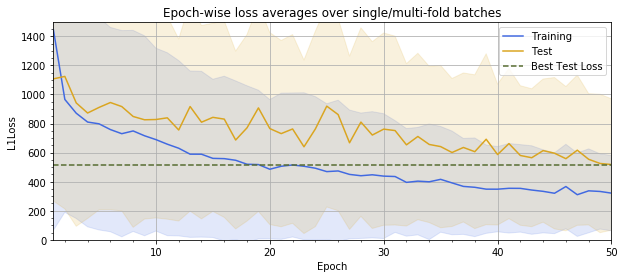

lr=0.0007589618115735587, rho=0.6677426122782043
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_162346192_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_162346192_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 543.94


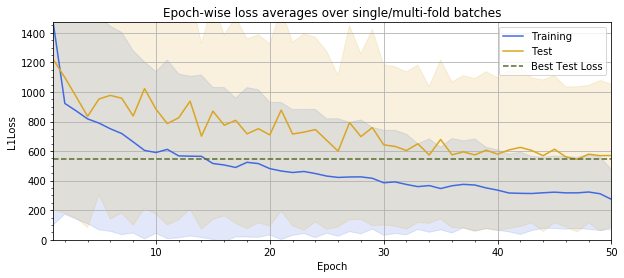

lr=0.0009333513496134003, rho=0.498075758035043
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_164914549_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_164914549_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 460.72


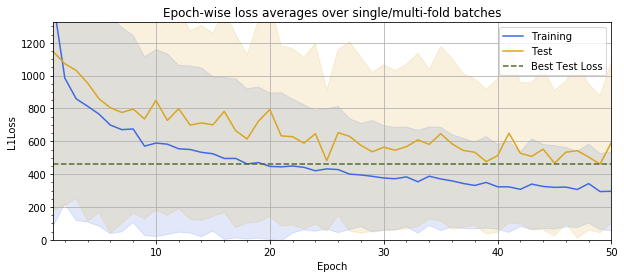

lr=0.0009333513496134003, rho=0.3700883871360454
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_171538864_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_171538864_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 423.37


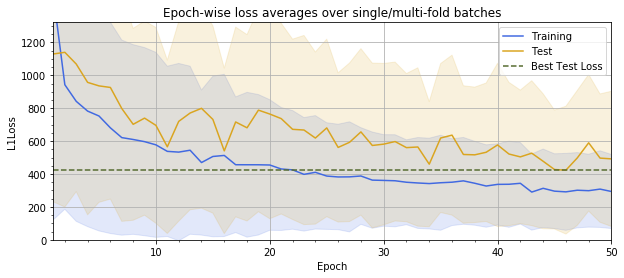

lr=0.0009333513496134003, rho=0.3695273230938274
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_174130686_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_174130686_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 419.38


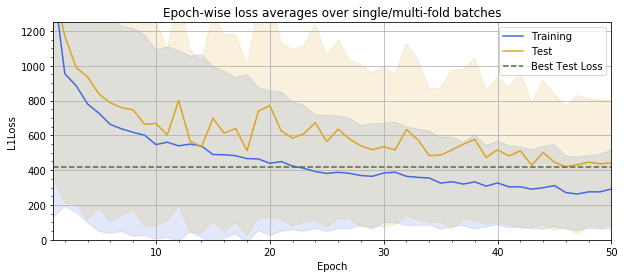

lr=0.0009333513496134003, rho=0.6677426122782043
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_180736381_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_180736381_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 406.30


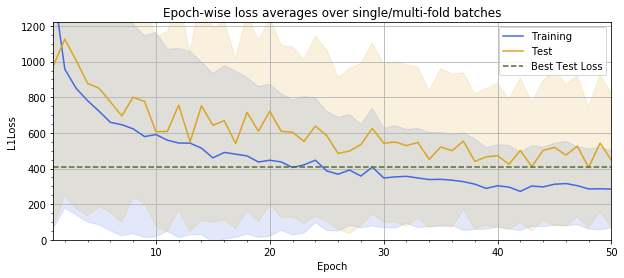

lr=0.0011111754764718852, rho=0.498075758035043
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_183401681_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_183401681_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 471.99


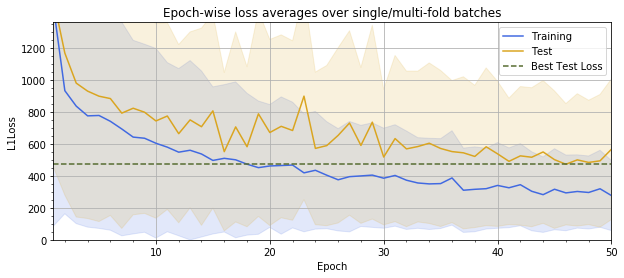

lr=0.0011111754764718852, rho=0.3700883871360454
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_185937942_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_185937942_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 464.78


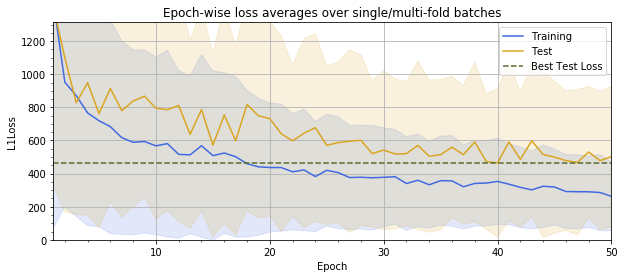

lr=0.0011111754764718852, rho=0.3695273230938274
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_192504562_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_192504562_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 506.95


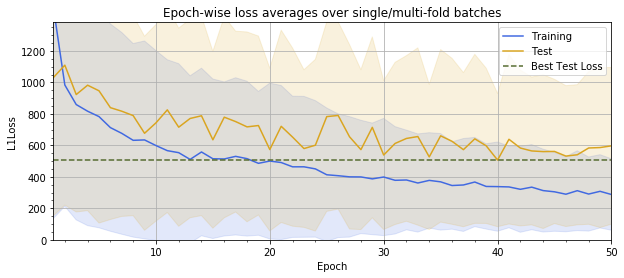

lr=0.0011111754764718852, rho=0.6677426122782043
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_195042808_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_195042808_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 421.75


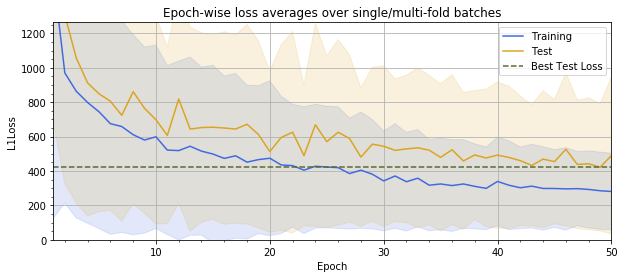

In [10]:
optimizer_earlier = test_optimizer(
    dp.DroneRGBEarlier, 
    best_l2_earlier[0],
    np.abs(np.random.normal(loc=best_optimizer_earlier[0],
                            scale=2*best_optimizer_earlier[0]*0.1, 
                            size=4)),
    np.abs(np.random.normal(loc=best_optimizer_earlier[1],
                            scale=2*best_optimizer_earlier[1]*0.1, 
                            size=4)))

rho,0.3695273230938274,0.3700883871360454,0.498075758035043,0.6677426122782043
lr,,,,
0.000759,518.086752,542.101650,447.853409,543.940292
0.000794,506.437742,412.641741,451.333487,491.301242
0.000933,419.384444,423.368898,460.719913,406.302163
0.001111,506.948471,464.778381,471.986509,421.753222


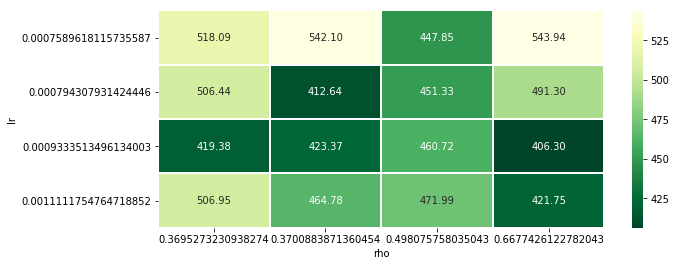

In [11]:
pivot = optimizer_earlier.pivot_table(values='best_loss',index='lr',columns='rho')
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlGn_r', linewidth=1, linecolor='white')
pivot

In [12]:
best_row = optimizer_earlier.loc[optimizer_earlier['best_loss'].idxmin()]
if best_row['best_loss'] < best_optimizer_earlier[-1]:
    best_optimizer_earlier = (best_row['lr'], best_row['rho'], best_row['best_loss'])
best_optimizer_earlier

(0.001, 0.6, 381.8413472830829)

#### 4.2.2 RGB Later Dataset

lr=0.001012240709663465, rho=0.9156668091621438
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_201626396_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_201626396_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 464.83


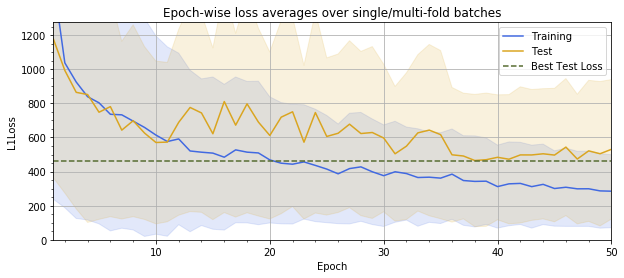

lr=0.001012240709663465, rho=0.8178296979714593
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_204002225_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_204002225_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 417.01


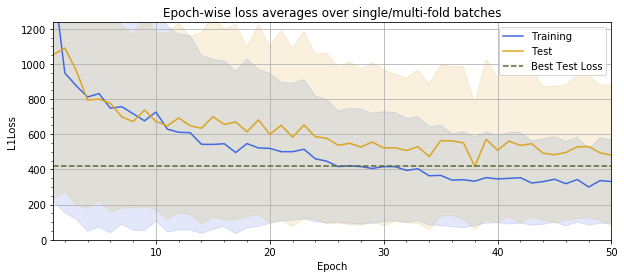

lr=0.001012240709663465, rho=0.8489727459712645
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_210338984_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_210338984_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 505.07


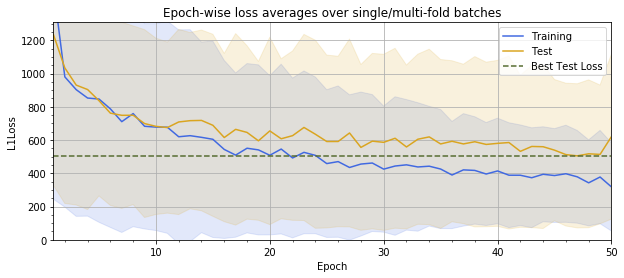

lr=0.001012240709663465, rho=0.9156413144631518
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_212716309_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_212716309_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 428.79


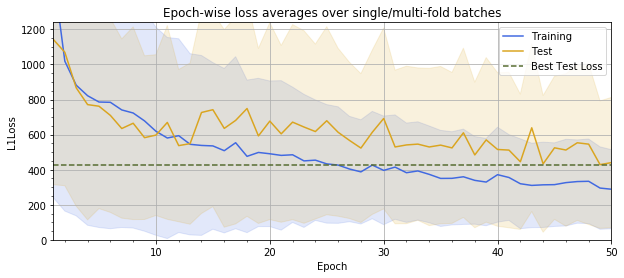

lr=0.001150415294768993, rho=0.9156668091621438
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_215054285_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_215054285_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 480.06


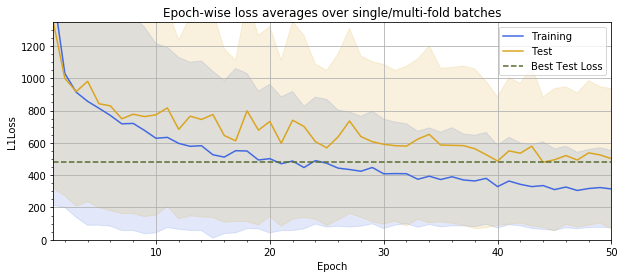

lr=0.001150415294768993, rho=0.8178296979714593
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_221438839_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_221438839_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 443.56


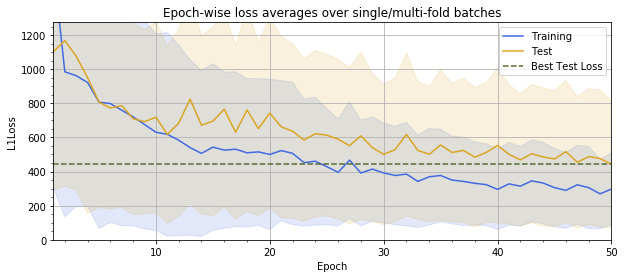

lr=0.001150415294768993, rho=0.8489727459712645
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_223820692_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_223820692_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 444.61


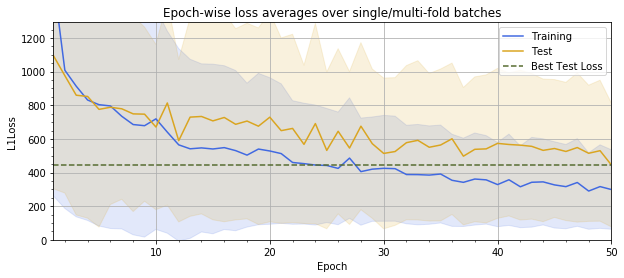

lr=0.001150415294768993, rho=0.9156413144631518
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_230206423_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_230206423_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 436.67


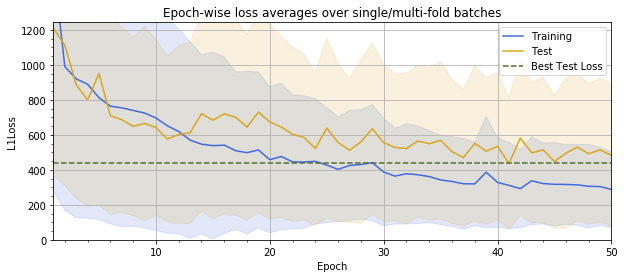

lr=0.001251569626996042, rho=0.9156668091621438
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_232549384_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_232549384_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 418.75


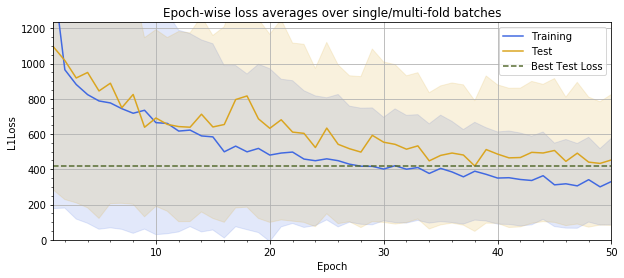

lr=0.001251569626996042, rho=0.8178296979714593
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181120_234931251_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181120_234931251_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 435.15


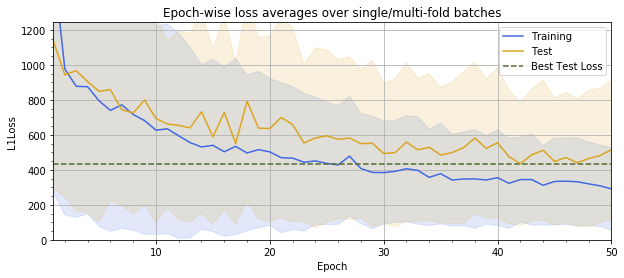

lr=0.001251569626996042, rho=0.8489727459712645
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181121_001318913_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181121_001318913_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 420.53


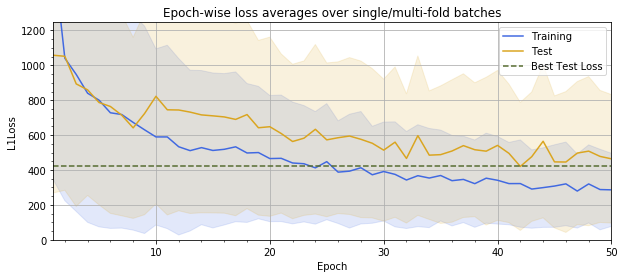

lr=0.001251569626996042, rho=0.9156413144631518
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181121_003659274_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181121_003659274_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 440.16


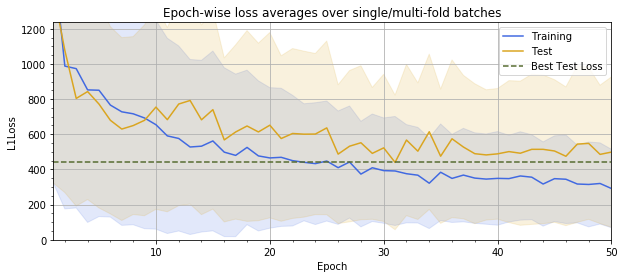

lr=0.001071733101353628, rho=0.9156668091621438
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181121_010039222_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181121_010039222_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 490.43


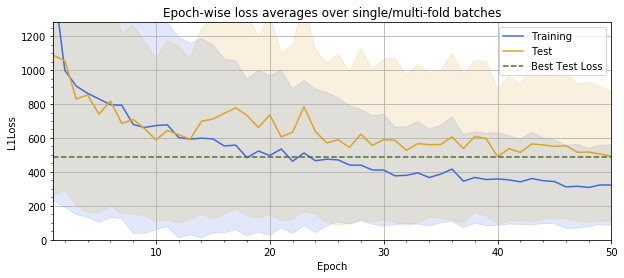

lr=0.001071733101353628, rho=0.8178296979714593
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181121_012421959_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181121_012421959_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 459.63


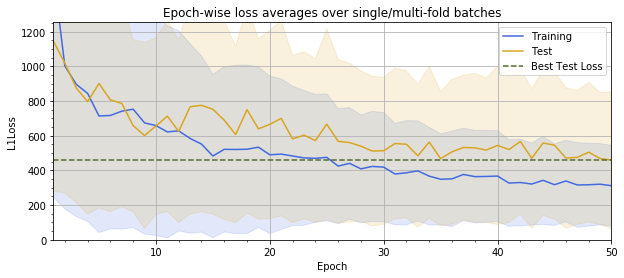

lr=0.001071733101353628, rho=0.8489727459712645
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181121_014804809_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181121_014804809_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 483.88


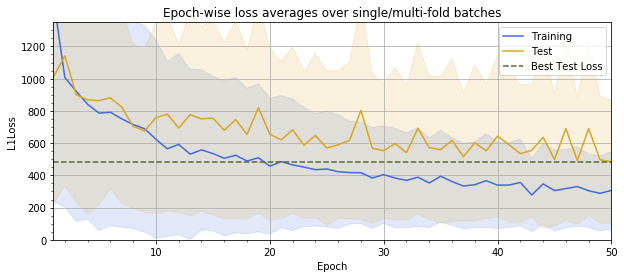

lr=0.001071733101353628, rho=0.9156413144631518
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181121_021152750_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181121_021152750_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 450.44


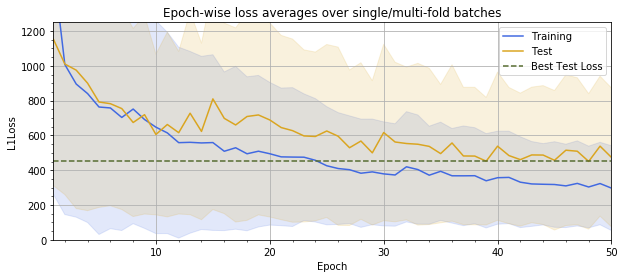

In [13]:
optimizer_later = test_optimizer(
    dp.DroneRGBLater, 
    best_l2_later[0],
    np.abs(np.random.normal(loc=best_optimizer_later[0],
                            scale=2*best_optimizer_later[0]*0.1, 
                            size=4)),
    np.abs(np.random.normal(loc=best_optimizer_later[1],
                            scale=2*best_optimizer_later[1]*0.1, 
                            size=4)))

rho,0.8178296979714593,0.8489727459712645,0.9156413144631518,0.9156668091621438
lr,,,,
0.001012,417.005659,505.072872,428.786123,464.834931
0.001072,459.630492,483.875201,450.436597,490.428836
0.001150,443.557490,444.610152,436.665275,480.062021
0.001252,435.154712,420.528019,440.164016,418.751131


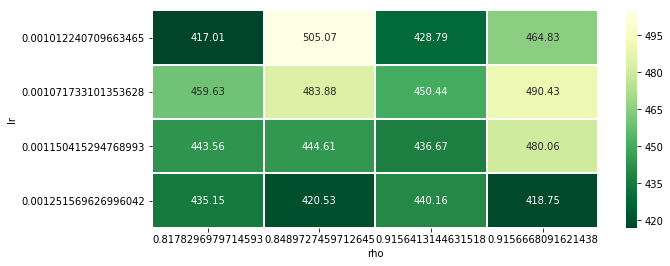

In [14]:
pivot = optimizer_later.pivot_table(values='best_loss',index='lr',columns='rho')
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlGn_r', linewidth=1, linecolor='white')
pivot

In [15]:
best_row = optimizer_later.loc[optimizer_later['best_loss'].idxmin()]
if best_row['best_loss'] < best_optimizer_later[-1]:
    best_optimizer_later = (best_row['lr'], best_row['rho'], best_row['best_loss'])
best_optimizer_later

(0.001, 0.9, 407.7067093626888)

#### 4.2.3 Conclusions


In [19]:
best_optimizer_earlier = (0.001, 0.6, 381.8413472830829)
best_optimizer_later = (0.001, 0.9, 407.7067093626888)

In [20]:
print("RGB Earlier")
print("\tLearning Rate: {}".format(best_optimizer_earlier[0]))
print("\tMoving Mean Gradient Coefficient: {}".format(best_optimizer_earlier[1]))
print("\tBest Loss: {}".format(best_optimizer_earlier[2]))
print("RGB Later")
print("\tLearning Rate: {}".format(best_optimizer_later[0]))
print("\tMoving Mean Gradient Coefficient: {}".format(best_optimizer_later[1]))
print("\tBest Loss: {}".format(best_optimizer_later[2]))

RGB Earlier
	Learning Rate: 0.001
	Moving Mean Gradient Coefficient: 0.6
	Best Loss: 381.8413472830829
RGB Later
	Learning Rate: 0.001
	Moving Mean Gradient Coefficient: 0.9
	Best Loss: 407.7067093626888


### 4.3. Full Training

We then want to see if tuning the optimizer resulted in better loss than using only vanilla default values.

In [22]:
def test_optimizer_full(dataset, weight_decay, patience, lr, rho):
    cnn = DroneYieldMeanCNN(
        source_bands=3,
        source_dim=128,
        cnn_layers=10,
        optimizer=optim.Adadelta,
        optimizer_parameters={
            'weight_decay': weight_decay,
            'lr': lr,
            'rho': rho})
    copy_model(
        cnn=cnn,
        is_later=isinstance(dataset, dp.DroneRGBLater),
        save=False)
    cnn.load_model()
    cnn.train(
        epochs=250,
        training_data=dataset(DB_128),
        k_cv_folds=3,
        early_stopping_patience=patience)
    cnn.train(
        epochs=250,
        training_data=dataset(DB_128),
        k_cv_folds=3,
        early_stopping_patience=patience)

#### 4.3.1 RGB Earlier Dataset

Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181121_201256583_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181121_201256583_Adadelta_3x128x128_10cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (6m 52s) 	Mean Loss:	Train=555.82 +-511.01	Test=764.80 +-651.83
[  26/ 250] (13m 36s) 	Mean Loss:	Train=378.86 +-315.33	Test=712.89 +-555.64
[  39/ 250] (20m 20s) 	Mean Loss:	Train=293.89 +-247.03	Test=481.41 +-435.17
[  52/ 250] (27m  4s) 	Mean Loss:	Train=243.17 +-199.38	Test=389.78 +-378.16
[  65/ 250] (33m 48s) 	Mean Loss:	Train=223.05 +-188.85	Test=422.48 +-417.38
[  78/ 250] (40m 30s) 	Mean Loss:	Train=236.66 +-169.31	Test=446.85 +-377.37
[  91/ 250] (47m 14s) 	Mean Loss:	Train=213.13 +-162.04	Test=425.16 +-379.71
[ 104/ 250] (53m 57s) 	Mean Loss:	Train=205.92 +-148.45	Test=382.71 +-354.00
[ 117/ 250] (

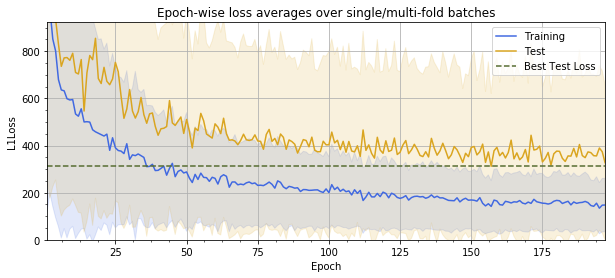

Starting the training with GPU:
[  13/ 250] (6m 54s) 	Mean Loss:	Train=160.92 +-114.81	Test=383.35 +-364.10
[  26/ 250] (13m 48s) 	Mean Loss:	Train=150.81 +-109.46	Test=405.14 +-402.37
[  39/ 250] (20m 34s) 	Mean Loss:	Train=132.04 +-100.83	Test=365.92 +-384.18
[  41/ 250] (21m 36s) 	Mean Loss:	Train=129.46 +-101.40	Test=340.49 +-347.49
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/optimization/20181121_201256583_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 311.98


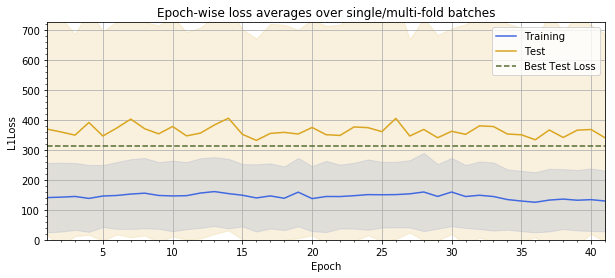

In [23]:
test_optimizer_full(dataset=dp.DroneRGBEarlier,
                    weight_decay=best_l2_earlier[0],
                    patience=40,
                    lr=best_optimizer_earlier[0], 
                    rho=best_optimizer_earlier[1])

#### 4.3.2 RGB Later Dataset

Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181121_221638527_Adadelta_3x128x128_10cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181121_221638527_Adadelta_3x128x128_10cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (6m 20s) 	Mean Loss:	Train=565.56 +-548.25	Test=745.25 +-603.60
[  26/ 250] (12m 33s) 	Mean Loss:	Train=425.27 +-344.02	Test=571.04 +-487.97
[  39/ 250] (18m 46s) 	Mean Loss:	Train=355.47 +-254.96	Test=486.61 +-389.27
[  52/ 250] (24m 59s) 	Mean Loss:	Train=305.47 +-229.22	Test=467.87 +-358.77
[  65/ 250] (31m 14s) 	Mean Loss:	Train=264.58 +-191.69	Test=478.24 +-393.20
[  78/ 250] (37m 26s) 	Mean Loss:	Train=247.67 +-181.84	Test=458.19 +-365.85
[  91/ 250] (43m 41s) 	Mean Loss:	Train=234.27 +-169.50	Test=392.21 +-315.83
[ 104/ 250] (49m 54s) 	Mean Loss:	Train=201.78 +-146.89	Test=407.81 +-326.97
[ 117/ 250] (

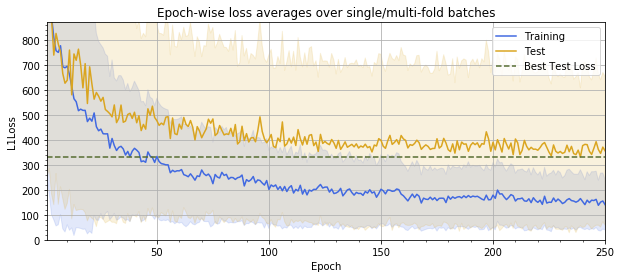

Starting the training with GPU:
[  13/ 250] (6m 22s) 	Mean Loss:	Train=148.84 +-108.83	Test=387.14 +-319.82
[  26/ 250] (12m 37s) 	Mean Loss:	Train=137.69 +-99.08	Test=335.14 +-282.86
[  39/ 250] (18m 51s) 	Mean Loss:	Train=163.90 +-112.85	Test=347.17 +-298.23
[  52/ 250] (25m  5s) 	Mean Loss:	Train=154.01 +-104.12	Test=331.59 +-291.12
[  62/ 250] (29m 53s) 	Mean Loss:	Train=121.91 +-93.32	Test=349.04 +-296.32
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/optimization/20181121_221638527_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 315.56


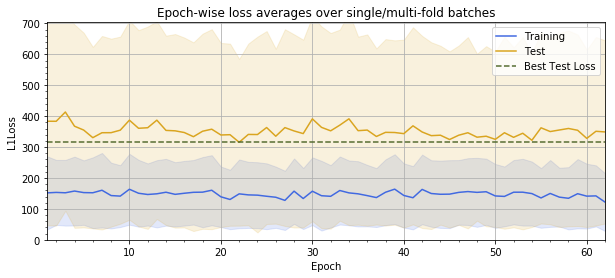

In [24]:
test_optimizer_full(dataset=dp.DroneRGBLater,
                    weight_decay=best_l2_later[0],
                    patience=40,
                    lr=best_optimizer_later[0], 
                    rho=best_optimizer_later[1])